# <span style="color:#800080;font-size:60px;"> MACHINE LEARNING  </span>

<span style="color:#1B3B6F;font-size:40px;"> IRENE EIROS FONSECA </span>


Libraries that should be installed:

In [1]:
import importlib

def install_and_import(package):
    try:
        importlib.import_module(package)
    except ImportError:
        print(f"{package} is not installed. Proceeding with installation...")
        !pip install {package}
        print(f"{package} has been successfully installed.")
    else:
        print(f"{package} is already installed. Continuing...")

# List of packages to check and install if necessary
packages = ['scipy', 'biosppy', 'seaborn', 'imbalanced-learn', 'EMD-signal']

for package in packages:
    install_and_import(package)


scipy is already installed. Continuing...
biosppy is already installed. Continuing...
seaborn is already installed. Continuing...
imbalanced-learn is not installed. Proceeding with installation...
imbalanced-learn has been successfully installed.
EMD-signal is not installed. Proceeding with installation...
EMD-signal has been successfully installed.


and imported:

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import biosppy as bs
import pandas as pd
import os
import joblib


from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,recall_score,precision_score,f1_score
from sklearn.metrics import confusion_matrix
from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline

from scipy.spatial import distance
import scipy
from scipy.signal import find_peaks
from scipy.signal import find_peaks, peak_widths
from scipy.fft import fft, fftfreq
from scipy.stats import skew, kurtosis, entropy, zscore
from scipy.stats import pearsonr

from sklearn.feature_selection import RFE
from sklearn.linear_model import LassoCV

from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF

from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix


# <span style="color:#1C7293;"> 1. Introduction </span>

## <span style="color:#3390FF;"> 1.1. EMG </span>

The analysis and detection of muscle activity by electromyography (EMG) is crucial, as it serves as a vital indicator of an individual's physiological state. Variations in the electrical activity of muscles can be symptoms of various underlying medical conditions, from neuromuscular disorders to central nervous system injuries. In addition, changes in muscle activity patterns are often related to stress, muscle fatigue and other psychological factors.

By monitoring and analyzing EMG signals, medical professionals can diagnose, treat and manage a variety of health conditions more effectively. This allows for early intervention and better management of conditions such as muscle injuries, neurological disorders and post-operative rehabilitation, thereby improving patient outcomes and quality of life.

## <span style="color:#3390FF;"> 1.2. Feature Extraction </span>


One of the most important concepts in Machine Learning is that of 'features', which are individual measurable properties or characteristics of the data, which we can use as variables in ML models. Often, the success of a model hinges on the quality and relevance of the available features.

Biosignals are rich sources of data, but their raw form can be overwhelming for ML models. By transforming these signals into a set of meaningful yet simple bits of information, we can capture the essence of the data while shedding the noise and redundancy.

Extracting or creating the best features from raw data (a process called feature extraction or engineering) can allow models to discern patterns, recognize relationships, make predictions, and classify data.

## <span style="color:#3390FF;"> 1.3. Data Characterization & Objectives </span>


Most importantly, these signals represent the electrical activity of muscles captured over time by EMG signals.

More specifically, these signals correspond to independent sources of muscle activity obtained by independent component analysis (ICA) techniques. It is necessary to select the best sources, i.e., those containing relevant patterns for muscle movement analysis.

To this end, features will be extracted from these signals to train a classifier to determine which EMG signals contain the most meaningful patterns for the project.

# <span style="color:#1C7293;"> 2. Importing Data </span>

Two types of data will be used for testing: a Kaggle database consisting of 8 channels, and my own source called "IRENE", which I have obtained and consists of 1 channel.

In [3]:
# PARAMETERS

SOURCE           = 'IRENE'
SAMPLE_FREQUENCY = 1000  # SAMPLE FREQUENCY
clases           = 4 
SAMPLE_MAXDATA   = 8000

ARCHIVOS CSV DE KAGGLE 

In [4]:
if(SOURCE == 'KAGGLE'):
        path = ".\\DATOS_KAGGLE"
        filename = "EMG-dataKaggle.csv"
        path_file = os.path.join(path, filename)
        df = pd.read_csv(path_file)
        print(df.info())
        print(df.head())

        print("class :", df["class"].unique(),"\n")

        print("Labels :",df["label"].unique()) # 36 people hand gesture data

        print("Value Count :\n",df["class"].value_counts())



        df.drop('time', inplace=True, axis=1)
        df = df[df['class'] != 0] #SE ELIMINA PORQUE NO APORTA DEMASIADA INFORMACION, DATOS DISTINTOS, SON AUSENCIA DE GESTOS 
        df = df[df['class'] != 7]

        data_clases = df.groupby(['class']) #agrupas

        data_list = []
        for n in range(clases):
            data_list.append([])

        # Iterar sobre los grupos
        for ix, (nombre_classe, classe) in enumerate(data_clases):
            print('\nCLASE: ',ix, '-', nombre_classe, '\n')    
            data_labels = classe.groupby(['label'])

            for iy, (nombre_label, label) in enumerate(data_labels):
                sample = label.values
                sample_length = len(sample)
                sample_shape = sample.shape
                if(len(sample) > SAMPLE_MAXDATA):
                    sample = sample[:SAMPLE_MAXDATA,:]#segunda columna: canales

                if(len(sample) < SAMPLE_MAXDATA):
                    #sample = np.pad(sample, 
                    #                ((0, SAMPLE_MAXDATA - len(sample)), (0, 0)), 
                    #                mode='constant', constant_values = 0)
                    repeat = np.tile(sample,(SAMPLE_MAXDATA//len(sample) + 1, 1))
                    
                    sample = repeat[:SAMPLE_MAXDATA]
                    
                    
                sample = np.transpose(sample[:,:8], axes=(1,0)) #muevo canales a la primera columna
                print('SAMPLE:', iy,sample_shape,'--->', sample.shape)

                #print(iy,'-',label.sample.agg(list).sample.shape)
                data_list[ix].append(sample)
                #print('SHAPE 1', data_list[ix].shape)

            filename_category = ''.join(['EMG_Gesture_',str(ix),'.npy'])
            path_category = os.path.join(path, filename_category)
            np.save(path_category, np.stack(data_list[ix]))    

        filename_category = ''.join(['EMG_Gesture_5.npy'])
        path_category = os.path.join(path, filename_category)
        sample_0 = np.load(path_category)

        # Visualizar el contenido del array
        
        for ix in range(sample_0.shape[1]):   
            plt.plot(sample_0[0,ix])  # cmap es el mapa de colores que quieres usar
        plt.show()


        fig, axs = plt.subplots(3, 3, figsize=(12, 12))

        # Iterar sobre los subplots y trazar los gráficos
        for i in range(8):
            fila = i // 3
            columna = i % 3
            ax = axs[fila, columna]
            ax.plot(sample_0[0,ix])
            ax.set_title(f'Canal {i+1}')

        # Ocultar los ejes del subplot extra
        axs[2, 2].axis('off')

        # Ajustar automáticamente el diseño para evitar superposiciones
        plt.tight_layout()

        # Mostrar los gráficos
        plt.show()


ARCHIVOS GENERADOS POR MI PROPIO SISTEMA 

In [5]:
if(SOURCE == 'IRENE'):
        path = ".\\DATOS_EMG"
        index_pos = 10 #posicion dentro del prefijo que indica la categoria donde estoy
        prefix = 'datos_emg_'

        data_list = [] 

        file_iter = os.listdir(path)
        file_path = [ file for file in file_iter if file.startswith(prefix)  ]
        for n in range(clases):
            data_list.append([])


        for file in file_path:
            clase = int(file[index_pos])
            path_file = os.path.join(path, file)
            sample = np.genfromtxt(path_file, delimiter = ",")
            sample = np.expand_dims(sample, axis=1)
            
            if(len(sample) > SAMPLE_MAXDATA):
                    sample = sample[:SAMPLE_MAXDATA,:]#segunda columna: canales

            if(len(sample) < SAMPLE_MAXDATA):
                repeat = np.tile(sample,(SAMPLE_MAXDATA//len(sample) + 1, 1))
                sample = repeat[:SAMPLE_MAXDATA]
                    
            sample = np.transpose(sample, (1,0))
            data_list[clase].append(sample)

        print('\n---------------------------')            
        for idx in range(clases):

            file = ''.join(['emg_gesture_',str(idx),'.npy'])
            path_file = os.path.join(path, file)
            sample = np.stack(data_list[idx])
            
            np.save(path_file, sample)
            sample = np.load(path_file)
            print('CLASS:',idx,'-->',path_file,'\tLENGTH:\t', sample.shape)
            


---------------------------
CLASS: 0 --> .\DATOS_EMG\emg_gesture_0.npy 	LENGTH:	 (8, 1, 8000)
CLASS: 1 --> .\DATOS_EMG\emg_gesture_1.npy 	LENGTH:	 (8, 1, 8000)
CLASS: 2 --> .\DATOS_EMG\emg_gesture_2.npy 	LENGTH:	 (5, 1, 8000)
CLASS: 3 --> .\DATOS_EMG\emg_gesture_3.npy 	LENGTH:	 (6, 1, 8000)


In [6]:
EMG_DataFiles = [] 

for ix in range(clases):
    file = "".join(["EMG_Gesture_", str(ix), ".npy"])
    pathfile = os.path.join(path, file)
    data = np.load(pathfile)
    if (np.sum(np.isnan(sample))>0):
            print('Nan = ', np.sum(np.isnan(data)), ix)
    EMG_DataFiles.append(np.load(pathfile))
            
    print("\nCLASE", ix, "\n\tNúmero de Archivos:", len(EMG_DataFiles[ix]))
    print("\tEstructura de los datos:\t", EMG_DataFiles[ix][0].shape)
    print("\t Máximo:\t", np.max(EMG_DataFiles[ix]), "\tMinimo:\t", np.min(EMG_DataFiles[ix])) 
    print("\t Media: \t", np.mean(EMG_DataFiles[ix]), "\tStd.:  \t", np.std(EMG_DataFiles[ix])) 
    print("\t Zeros: \t", np.sum(np.isnan(EMG_DataFiles[ix])), "\tInfinite:\t", np.sum(np.isinf(EMG_DataFiles[ix]))) 

    


CLASE 0 
	Número de Archivos: 8
	Estructura de los datos:	 (1, 8000)
	 Máximo:	 6.0 	Minimo:	 0.0
	 Media: 	 0.3921875 	Std.:  	 0.9065223189992345
	 Zeros: 	 0 	Infinite:	 0

CLASE 1 
	Número de Archivos: 8
	Estructura de los datos:	 (1, 8000)
	 Máximo:	 5.0 	Minimo:	 0.0
	 Media: 	 0.269484375 	Std.:  	 0.7686555123271147
	 Zeros: 	 0 	Infinite:	 0

CLASE 2 
	Número de Archivos: 5
	Estructura de los datos:	 (1, 8000)
	 Máximo:	 5.0 	Minimo:	 0.0
	 Media: 	 0.5646 	Std.:  	 1.0765578665357471
	 Zeros: 	 0 	Infinite:	 0

CLASE 3 
	Número de Archivos: 6
	Estructura de los datos:	 (1, 8000)
	 Máximo:	 7.0 	Minimo:	 0.0
	 Media: 	 0.2590625 	Std.:  	 0.6929339466551507
	 Zeros: 	 0 	Infinite:	 0


<span style="color:#1B3B6F; font-size:30px;"> DATA PREPROCESSING: DATA FILTERING AND RECTIFICATION  </span>

In [7]:

FILTER = True

if FILTER:
    for clase in range(clases):
        for sample in range(len(EMG_DataFiles[clase])):
             for channel in range(len(EMG_DataFiles[clase][sample])):
                 
                 b, a = scipy.signal.butter(4, [10,450] , btype='bandpass', fs=SAMPLE_FREQUENCY)
                 filtered_emg = scipy.signal.filtfilt(b, a, EMG_DataFiles[clase][sample][channel])
        
                 # Rectification
                 rectified_emg = np.abs(filtered_emg)
                 
                 rectification_cutoff = 10
                 b, a = scipy.signal.butter(4, rectification_cutoff, btype='low', fs=SAMPLE_FREQUENCY)
                 #rectified_emg = scipy.signal.filtfilt(b, a, rectified_emg)

                 EMG_DataFiles[clase][sample][channel] = rectified_emg

        print("\nCLASE", clase, "\n\tNúmero de Archivos:", len(EMG_DataFiles[clase]))
        print("\tEstructura de los datos:\t", EMG_DataFiles[clase][0].shape)
        print("\t Máximo:\t", np.max(EMG_DataFiles[clase]), "\tMinimo:\t", np.min(EMG_DataFiles[clase])) 
        print("\t Media: \t", np.mean(EMG_DataFiles[clase]), "\tStd.:  \t", np.std(EMG_DataFiles[clase])) 
        print("\t Zeros: \t", np.sum(np.isnan(EMG_DataFiles[clase])), "\tInfinite:\t", np.sum(np.isinf(EMG_DataFiles[clase]))) 


CLASE 0 
	Número de Archivos: 8
	Estructura de los datos:	 (1, 8000)
	 Máximo:	 5.106892335402821 	Minimo:	 1.1272995476350328e-05
	 Media: 	 0.6125968191017276 	Std.:  	 0.639995525658196
	 Zeros: 	 0 	Infinite:	 0

CLASE 1 
	Número de Archivos: 8
	Estructura de los datos:	 (1, 8000)
	 Máximo:	 4.462621894465166 	Minimo:	 4.1146323462328083e-72
	 Media: 	 0.4170172324928487 	Std.:  	 0.5948244617001096
	 Zeros: 	 0 	Infinite:	 0

CLASE 2 
	Número de Archivos: 5
	Estructura de los datos:	 (1, 8000)
	 Máximo:	 4.426990672802505 	Minimo:	 0.011718394481511255
	 Media: 	 0.8282903445697569 	Std.:  	 0.6747756988658831
	 Zeros: 	 0 	Infinite:	 0

CLASE 3 
	Número de Archivos: 6
	Estructura de los datos:	 (1, 8000)
	 Máximo:	 5.538791041948115 	Minimo:	 1.048359492955564e-05
	 Media: 	 0.4174168739172282 	Std.:  	 0.5175898409341464
	 Zeros: 	 0 	Infinite:	 0


<span style="color:#1B3B6F; font-size:40px;"> VISUALIZATION </span>


Then, we will visualize the **time-series signals** of both of these classes:

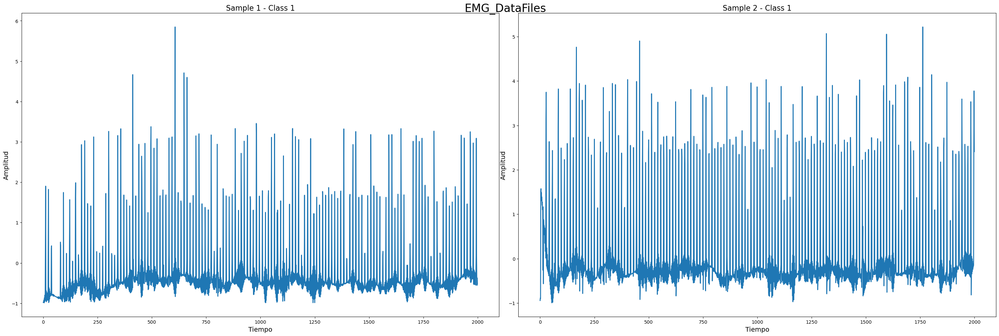

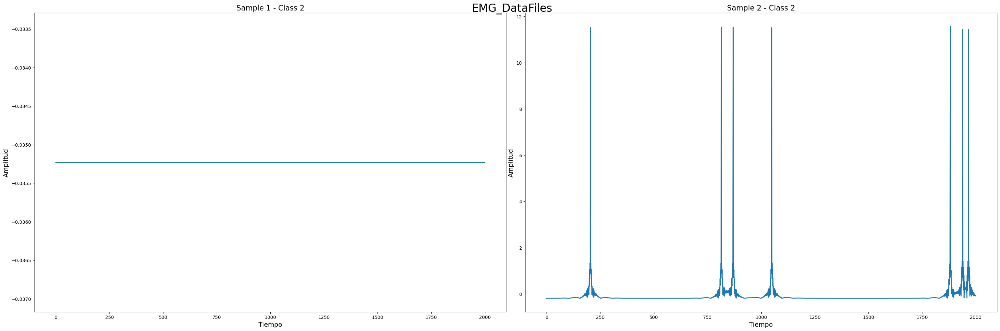

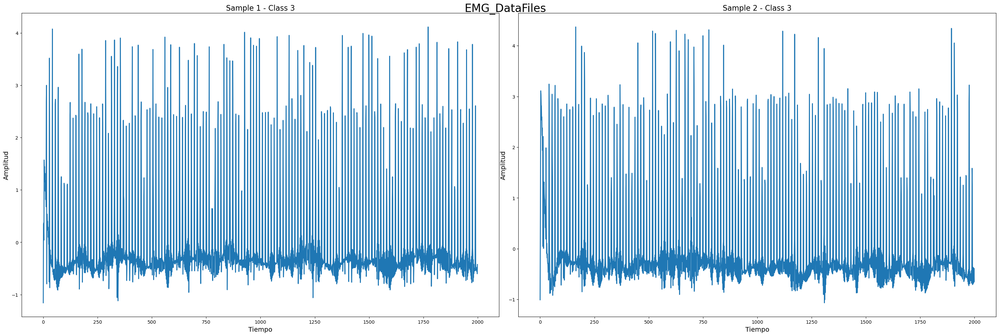

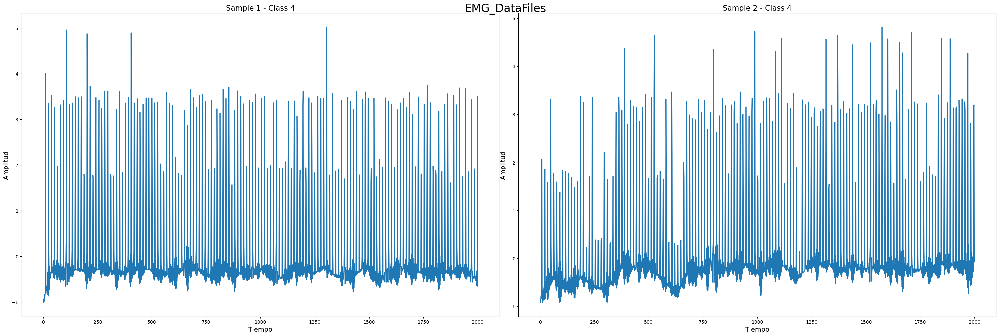

In [8]:
#NO LA VOY A MOSTRAR EN EL DOC 
#[ix] categoria, aux--> muestra 

for clase in range(clases):
    sample=0;
    fig, ax_array = plt.subplots(1, 2, squeeze=False, figsize=(30,10)) #figsize(anchura,altura)
    fig.tight_layout()
    for i,ax_row in enumerate(ax_array):
        for j,axes in enumerate(ax_row):
            if sample<5:
                for channel in range(EMG_DataFiles[clase][sample].shape[0]):
                    signal = EMG_DataFiles[clase][sample][channel]
                    signal = (signal - np.mean(signal))/np.std(signal)

                    axes.plot(signal[0:2000], linewidth=2)   
                    axes.set_title(f"Sample {sample + 1} - Class {clase + 1}", fontsize=16)
                    axes.set_xlabel("Tiempo", fontsize=14)
                    axes.set_ylabel("Amplitud", fontsize=14)
                sample = sample + 1 

    # Adjust the position of the overall title
    plt.subplots_adjust(top=0.95)

    # Add an overall title to the figure
    fig.suptitle("EMG_DataFiles", fontsize=24)



0.0 1.0
0.0 1.0000000000000002
-1.4566126083082054e-16 0.9999999999999999
-4.9737991503207014e-17 1.0


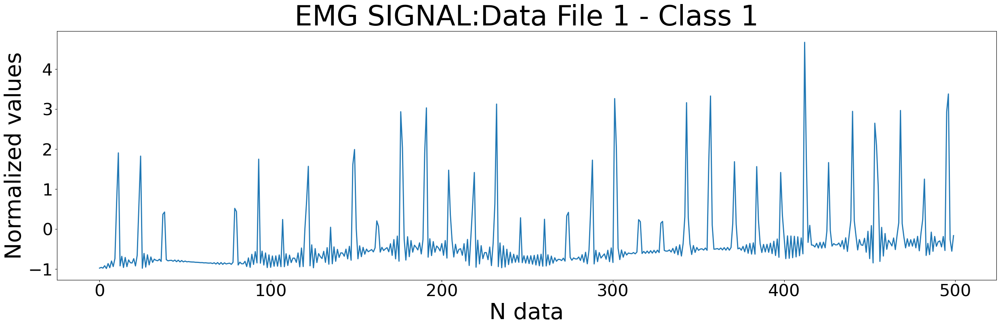

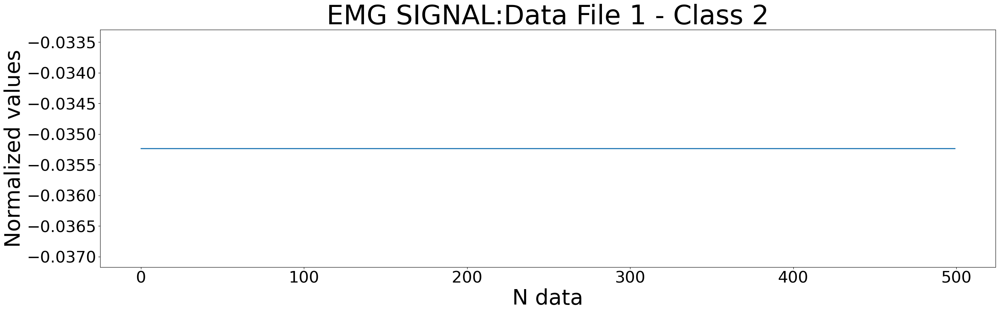

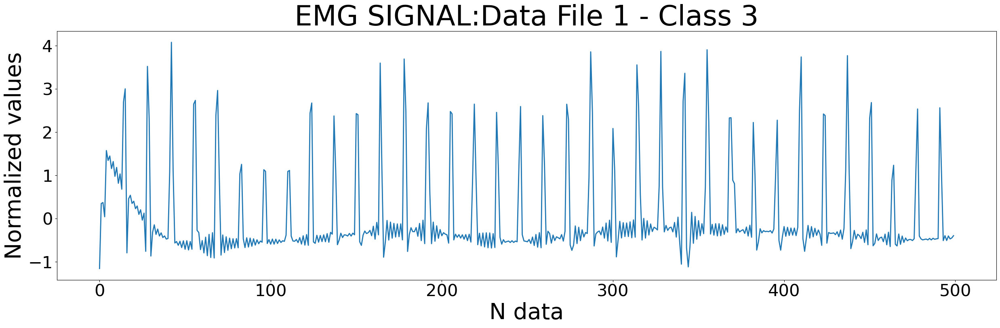

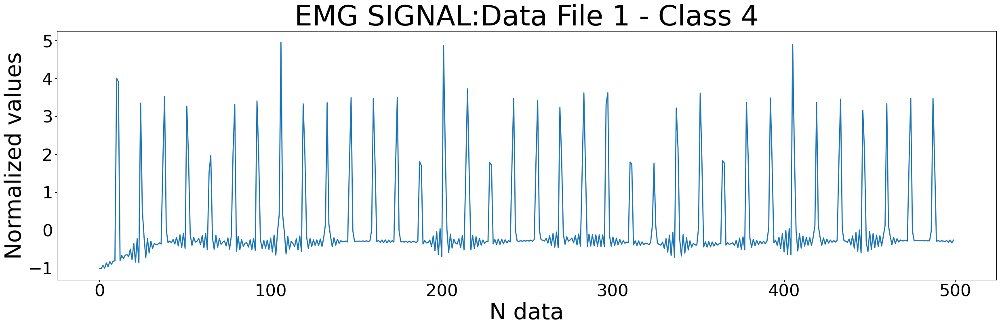

In [9]:
#MUESTRA SOLO 1 CATEGORIA
for clase in range(clases):
    sample=0;
    channel = 0
    plt.figure(figsize=(30,8)) #figsize(anchura,altura)
    signal = EMG_DataFiles[clase][sample][channel]
    signal = (signal - np.mean(signal))/np.std(signal)
    print(np.mean(signal), np.std(signal))

    plt.plot(signal[0:500], linewidth=2)   
    plt.title(f"EMG SIGNAL:Data File {sample + 1} - Class {clase + 1}", fontsize=50)
    plt.xlabel("N data", fontsize=40)
    plt.ylabel("Normalized values", fontsize=40)
    plt.xticks(fontsize = 30)
    plt.yticks(fontsize = 30)
    
    

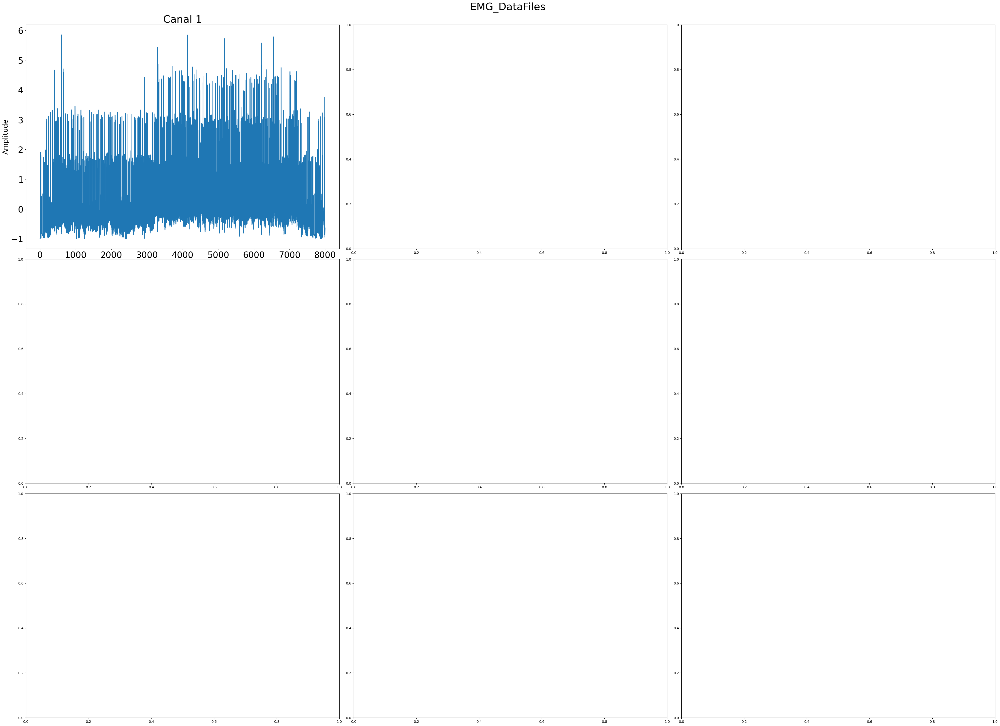

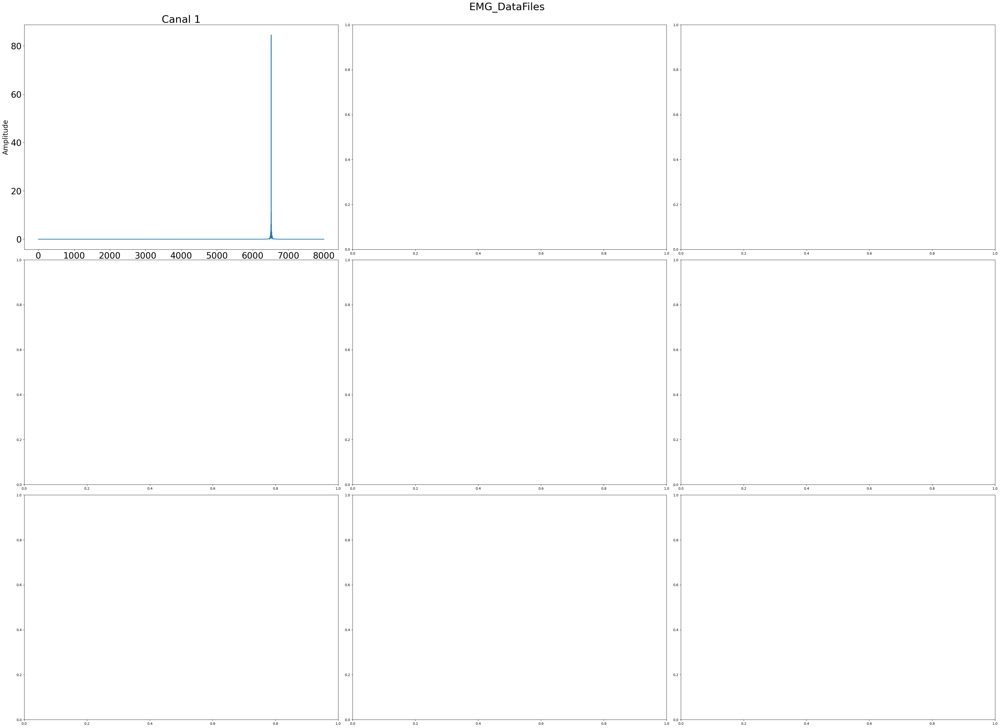

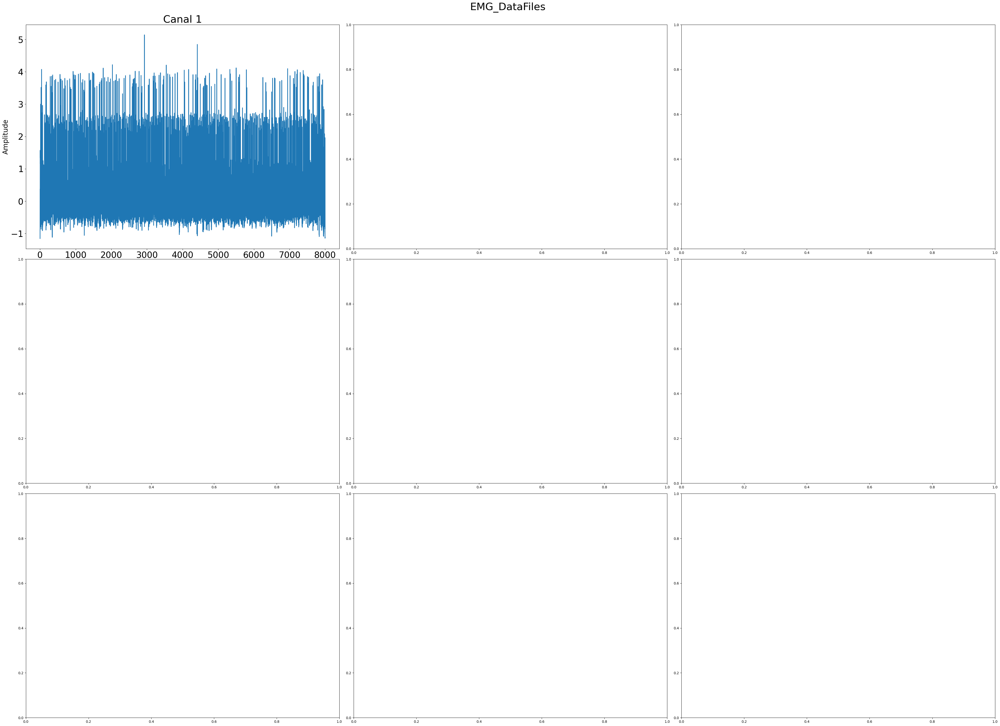

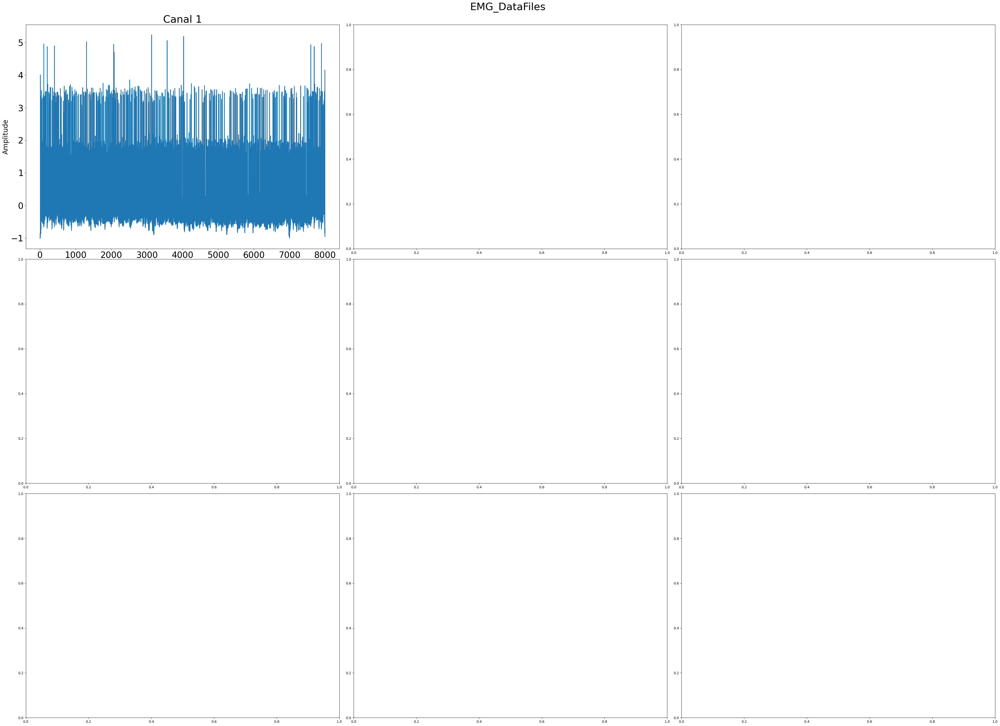

In [10]:
#LA VOY A MOSTRAR 
for clase in range(clases):
    sample=0; #PROBAR CON DISTINTOS SAMPLES
    fig, ax_array = plt.subplots(3, 3,squeeze=False, figsize=(40,30))
    fig.tight_layout()
    for channel in range(EMG_DataFiles[clase][sample].shape[0]):
        fila = channel //3 
        columna = channel % 3 
        axes = ax_array[fila, columna]
        signal = EMG_DataFiles[clase][sample][channel]
        signal = (signal - np.mean(signal))/np.std(signal)

        axes.plot(signal, linewidth=2) 
        axes.set_title(f"Canal {channel + 1}", fontsize = 30)  #Título con el número de canal
        axes.tick_params(axis = 'both', labelsize = 25)
        axes.set_xlabel("Data", fontsize = 20)
        axes.set_ylabel("Amplitude", fontsize = 20)
    
    
    # Adjust the position of the overall title
    plt.subplots_adjust(top=0.95)

    # Add an overall title to the figure
    fig.suptitle("EMG_DataFiles", fontsize=30)

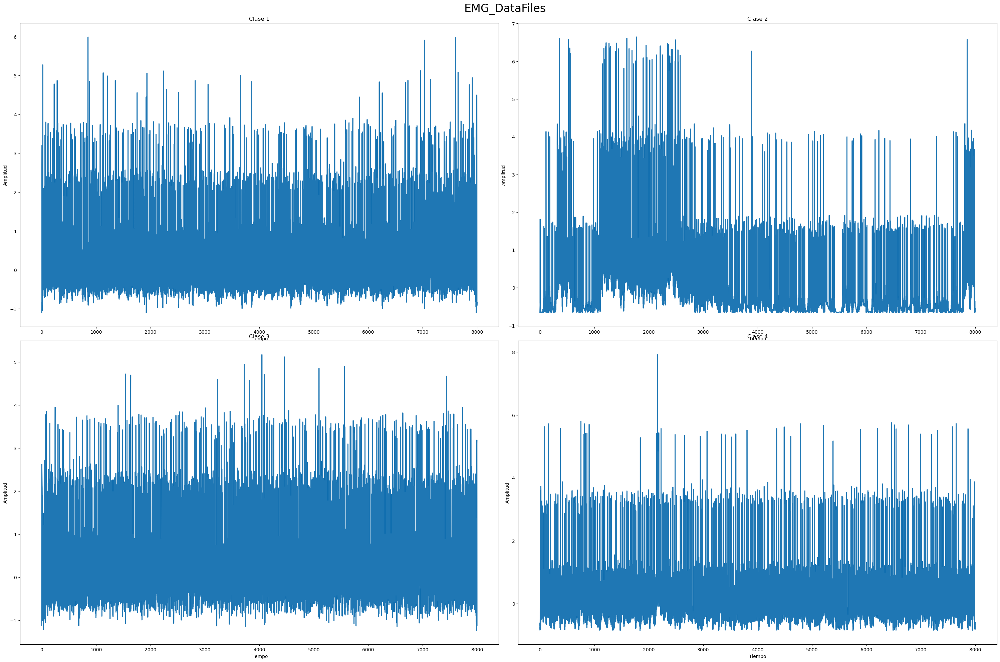

In [11]:
#LA VOY A MOSTRAR

fig, ax_array = plt.subplots(2, 2,squeeze=False, figsize=(30,20))
fig.tight_layout()

for clase in range(clases):
    sample=2; #PROBAR DISTINTOS SAMPLE     
    channel = 0
    fila = clase //2 
    columna = clase % 2
    
    axes = ax_array[fila, columna]
    signal = EMG_DataFiles[clase][sample][channel]
    signal = (signal - np.mean(signal))/np.std(signal)

    axes.plot(signal, linewidth=2) 
    axes.set_title(f"Clase {clase + 1}")  #Título con el número de canal
    axes.set_xlabel("Tiempo")
    axes.set_ylabel("Amplitud")
    
    
    # Adjust the position of the overall title
    plt.subplots_adjust(top=0.95)

    # Add an overall title to the figure
    fig.suptitle("EMG_DataFiles", fontsize=24)




In [12]:
# Seleccionar 5 señales aleatorias de cada

selected_EMG_DataFiles_indices = []
for clase in range(clases):
    selected_EMG_DataFiles_indices.append(np.random.choice(len(EMG_DataFiles[clase]), 5, replace=False))
    
selected_EMG_DataFiles = []
for clase in range(clases):  
    print("Clase", clase, selected_EMG_DataFiles_indices[clase], "selecciono 5 señales aleatorias")
    for i in range(5):
        selected_EMG_DataFiles.append(EMG_DataFiles[clase][selected_EMG_DataFiles_indices[clase][i]])
    
        
 

Clase 0 [3 4 2 6 7] selecciono 5 señales aleatorias
Clase 1 [2 0 3 5 6] selecciono 5 señales aleatorias
Clase 2 [4 3 1 0 2] selecciono 5 señales aleatorias
Clase 3 [4 1 0 5 3] selecciono 5 señales aleatorias


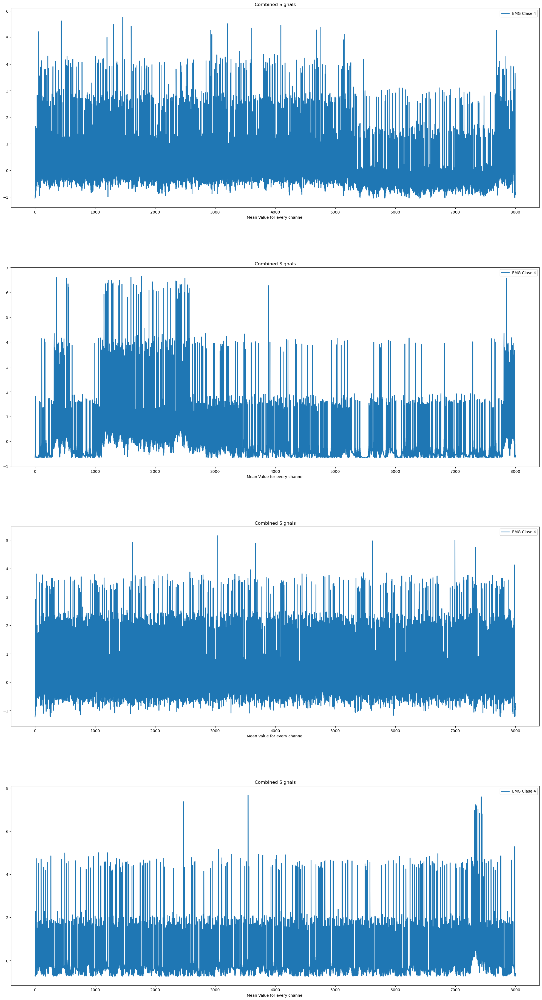

In [13]:
####IMPRIMIR LAS DEL MISMO CHANNEL DE LAS 5 SELECCIONADAS ALEATORIAMENTE 

fig, ax_array = plt.subplots(clases, 1, squeeze=False, figsize=(20, 40))
fig.tight_layout()
sample = 0

for clase in range(clases):
    signal_index_EMG = selected_EMG_DataFiles_indices[clase][sample]
    signal = EMG_DataFiles[clase][signal_index_EMG]
    signal = (signal - np.mean(signal))/np.std(signal)

    ax_array[clase, 0].plot(signal.mean(axis=0), label=f"EMG Clase {clases}", linewidth=2)
    ax_array[clase, 0].set_title(f'Combined Signals')
    ax_array[clase, 0].set_xlabel(f'Mean Value for every channel')
    ax_array[clase, 0].legend()

# Ajustar la posición del título general y dejar más espacio vertical entre los subgráficos
plt.subplots_adjust(top=0.9, hspace=0.3)
plt.show()


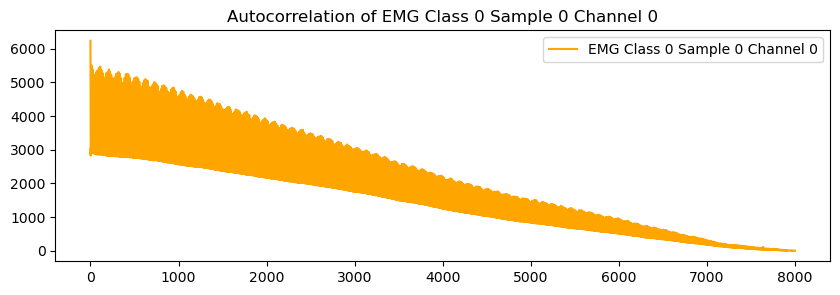

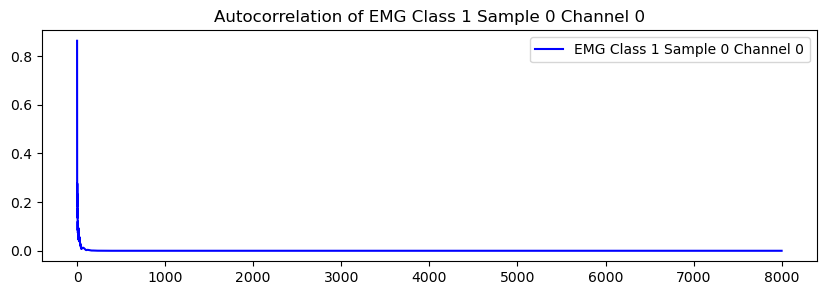

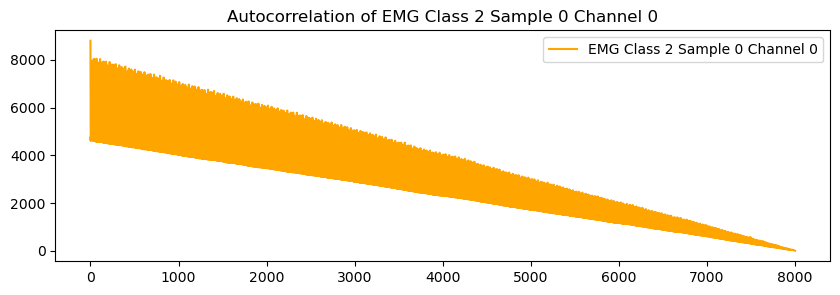

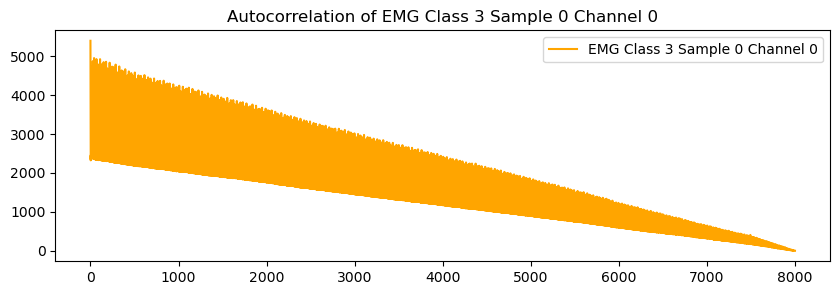

In [14]:
# Function to calculate and plot the right autocorrelation of a signal
def plot_right_autocorrelation(signal, label, color):
    autocorrelation = np.correlate(signal, signal, mode='full')
    right_autocorrelation = autocorrelation[len(autocorrelation)//2:]
    plt.figure(figsize=(10, 3))
    plt.plot(right_autocorrelation, label=label, color=color)
    plt.title(f'Autocorrelation of {label}')
    plt.legend()
    plt.show()

# Calculate and plot the right side of the autocorrelation(in blue) for a lot of classes and channels 

for clase in range(clases):
    sample = 0
    channel = 0
    signal = EMG_DataFiles[clase][sample][channel]
    plot_right_autocorrelation(signal, f'EMG Class {clase} Sample {sample} Channel {channel}', 'blue' if clase == 1 else 'orange')



Clase 1, Canal 1:
  - Min: 0.0007142648216922603
  - Max: 4.290679297873121
  - Std Deviation: 0.6274871647214594



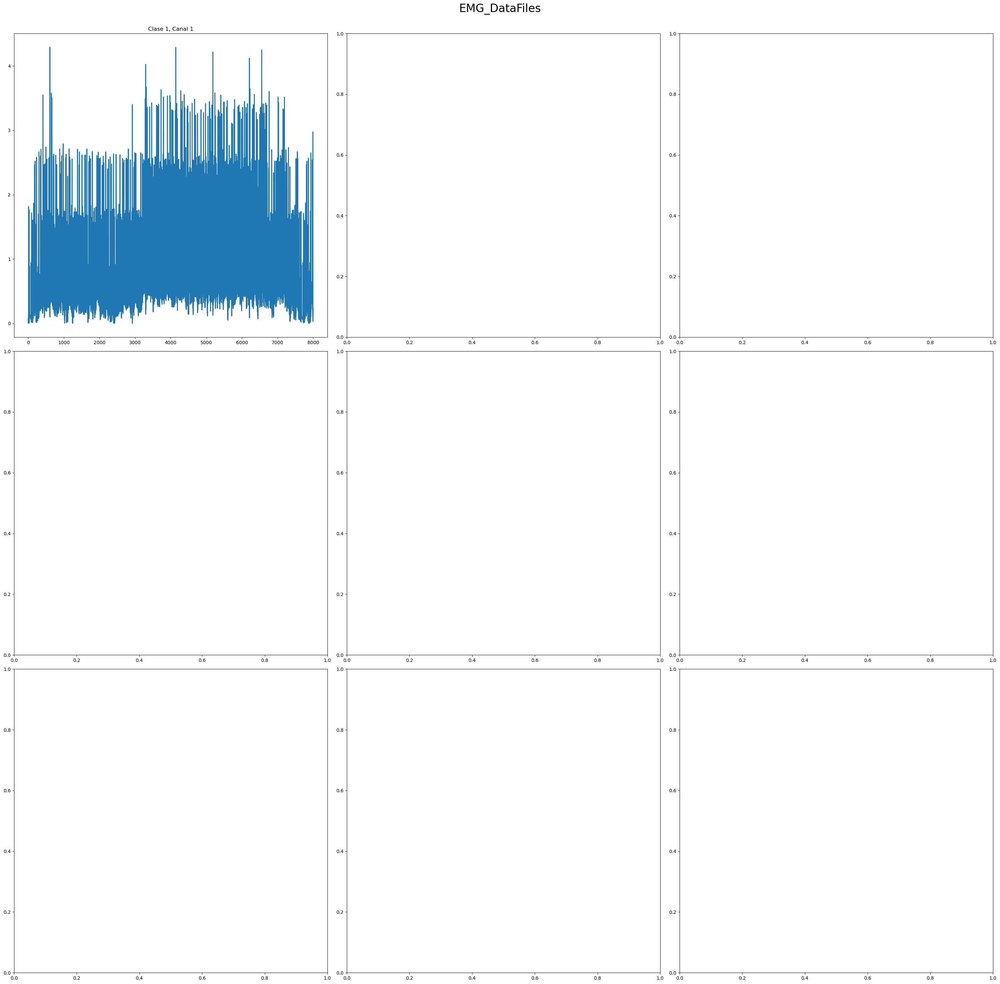

Clase 2, Canal 1:
  - Min: 4.1146323462328083e-72
  - Max: 0.8771944048362144
  - Std Deviation: 0.010375532051465722



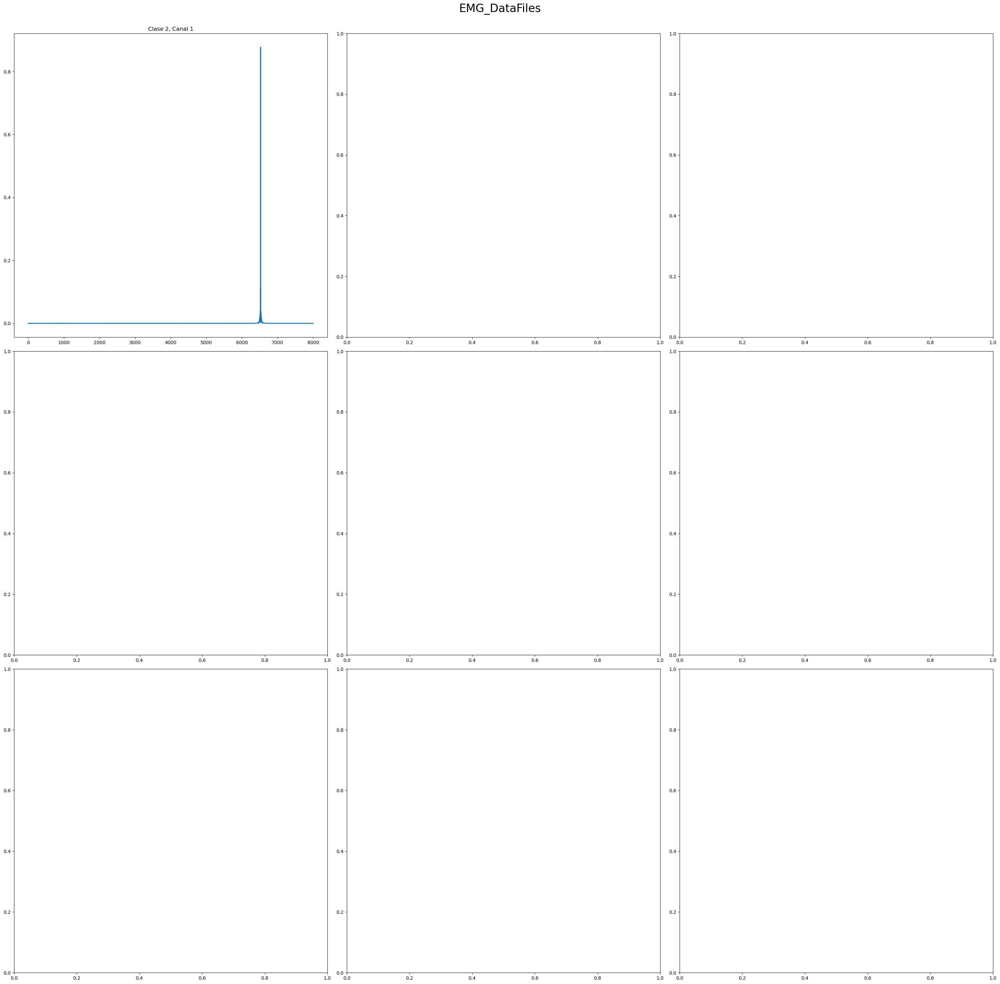

Clase 3, Canal 1:
  - Min: 0.03195918748715809
  - Max: 4.252690911569093
  - Std Deviation: 0.6698988913458522



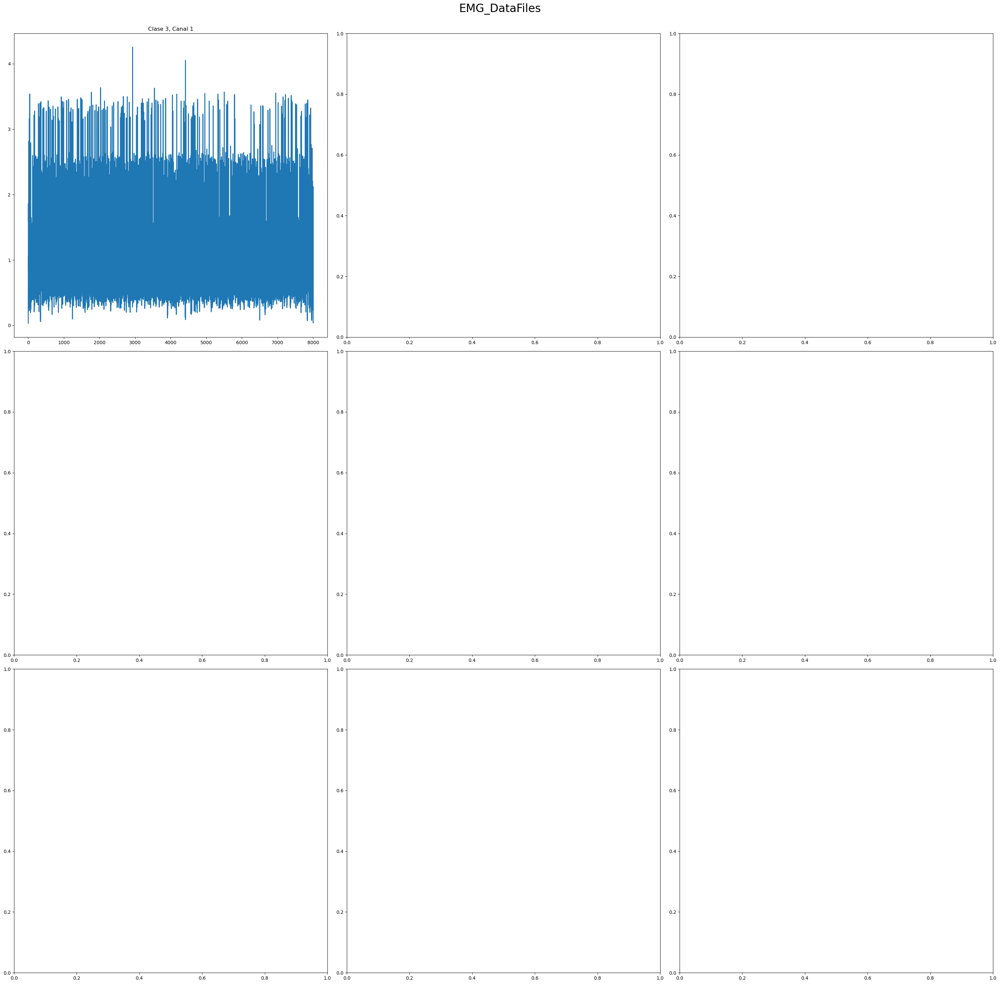

Clase 4, Canal 1:
  - Min: 0.004951600573870563
  - Max: 3.588569388485721
  - Std Deviation: 0.5731959349554977



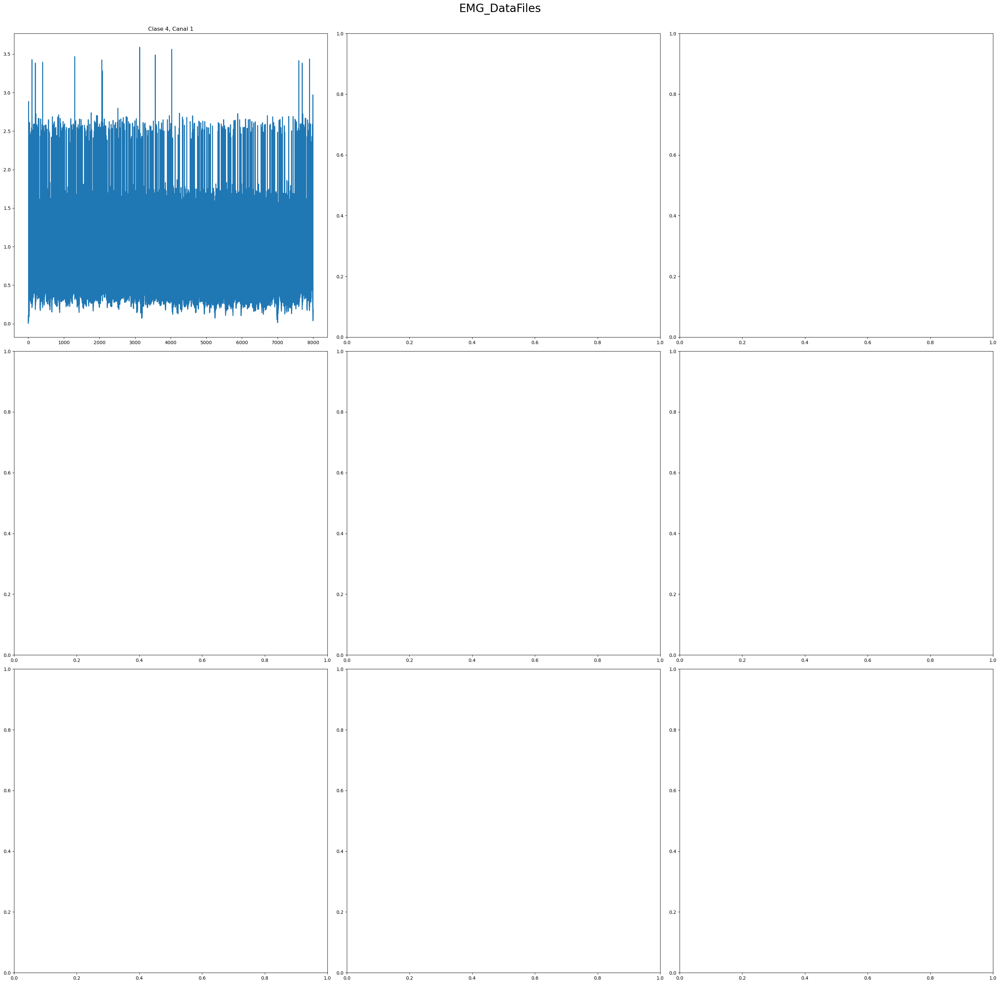

In [15]:
#CALCULAR MIN, MAX, DESV ESTANDAR 
import numpy as np
import matplotlib.pyplot as plt

def calcular_estadisticas_emg(EMG_DataFiles, clases):
   
    for clase in range(clases):
        sample = 0
        fig, ax_array = plt.subplots(3, 3, squeeze=False, figsize=(30, 30))
        fig.tight_layout()
        
        for channel in range(EMG_DataFiles[clase][sample].shape[0]):
            # Calcular min, max y std_deviation de cada señal
            signal = EMG_DataFiles[clase][sample][channel]
            signal_min = np.min(signal)
            signal_max = np.max(signal)
            signal_std = np.std(signal)

            # Imprimir los resultados
            print(f"Clase {clase + 1}, Canal {channel + 1}:")
            print(f"  - Min: {signal_min}")
            print(f"  - Max: {signal_max}")
            print(f"  - Std Deviation: {signal_std}")
            print()

            # Plot del canal actual
            fila = channel // 3 
            columna = channel % 3 
            axes = ax_array[fila, columna]
            axes.plot(signal, linewidth=2)
            axes.set_title(f"Clase {clase + 1}, Canal {channel + 1}")

        # Ajustar la posición del título general
        plt.subplots_adjust(top=0.95)

        # Agregar un título general a la figura
        fig.suptitle("EMG_DataFiles", fontsize=24)

        # Mostrar la figura
        plt.show()

calcular_estadisticas_emg(EMG_DataFiles, clases)


And now we will observe the signals in the **frequency domain.**







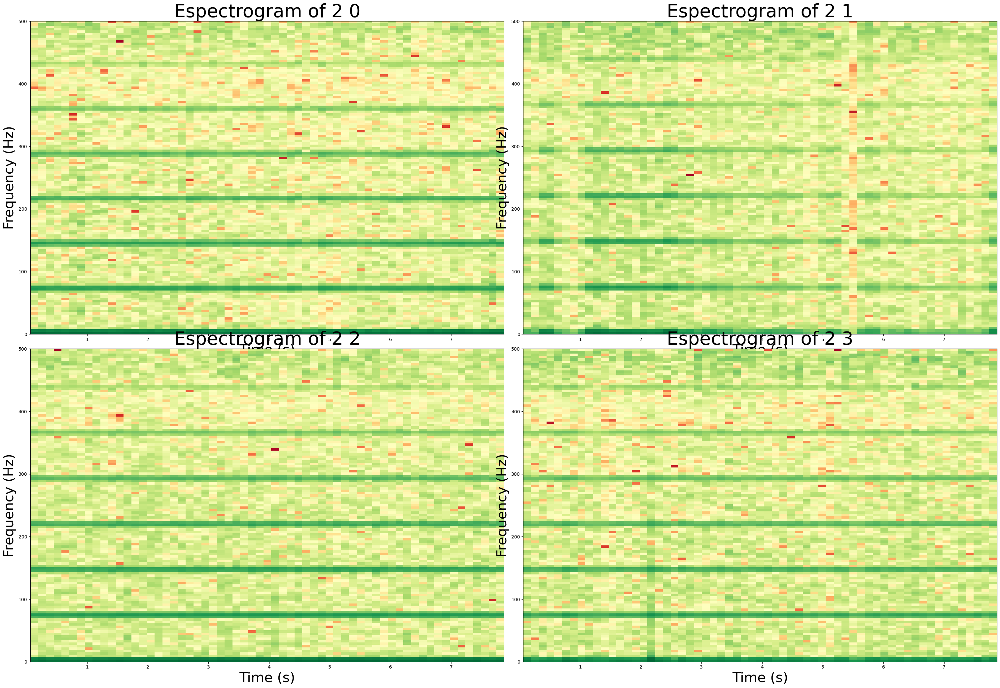

In [16]:
#SPECTOGRAM: DE UN GRID 2*2. SE TRATA DE UNA VISUALIZACION DE CÓMO LA FRECUENCIA DE UNA SEÑAL CAMBIA CON EL TIEMPO  
fig, ax_array = plt.subplots(2, 2, squeeze=False, figsize=(30, 20))
fig.tight_layout()

# Calcular y graficar el espectrograma para cada señal 
for clase in range(clases):    
    sample = 2
    channel = 0
    fila = clase //2 
    columna = clase % 2
    signal = EMG_DataFiles[clase][sample][channel] + 1e-7
    
    a,b,c,d = ax_array[fila, columna].specgram(signal, Fs = SAMPLE_FREQUENCY, cmap='RdYlGn')  # Fs=1Khz- Ajusta el valor de Fs según la frecuencia de muestreo de tus señales
    #plt.colorbar(d, ax_array[fila, columna], label = "dBs")
    ax_array[fila, columna].set_title(f'Espectrogram of {sample} {clase}', fontsize=40)
    ax_array[fila, columna].set_xlabel('Time (s)', fontsize=30)
    ax_array[fila, columna].set_ylabel('Frequency (Hz)', fontsize=30)


        

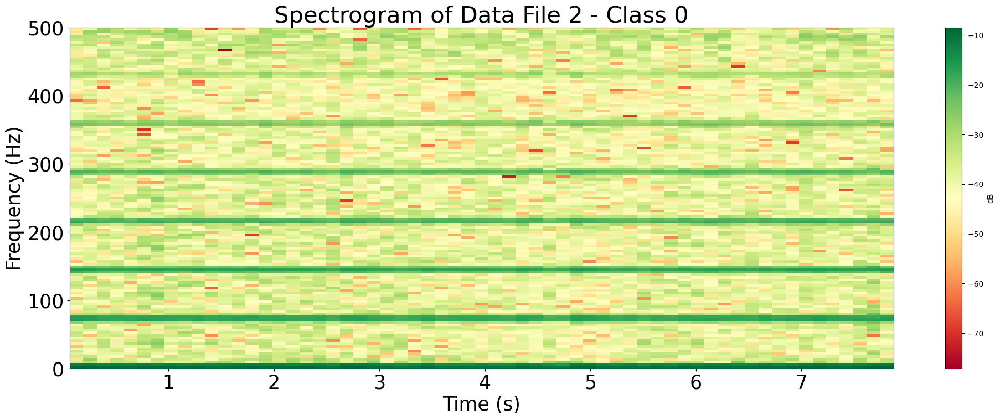

In [17]:
#SPECTOGRAM THAT SHOWS ONLY 1 OF THEM 

clase = 0     
sample = 2    
channel = 0  

# Retrieve the data for the specified class, sample, and channel
signal = EMG_DataFiles[clase][sample][channel] + 1e-7

# Create a figure and axis for the spectrogram
fig, ax = plt.subplots(figsize=(24, 8))

# Calculate and plot the spectrogram
S, freqs, times, im = ax.specgram(signal, Fs=SAMPLE_FREQUENCY, cmap='RdYlGn')  # Fs=1kHz - Adjust according to your signal's sampling frequency

# Set titles and labels
ax.set_title(f'Spectrogram of Data File {sample} - Class {clase}', fontsize=30)
ax.set_xlabel('Time (s)', fontsize=25)
ax.set_ylabel('Frequency (Hz)', fontsize=25)
ax.tick_params(axis = 'both', which='major', labelsize= 25)

# Optional: Add a colorbar
plt.colorbar(im, ax=ax, label='dB')

# Show the plot
plt.show()


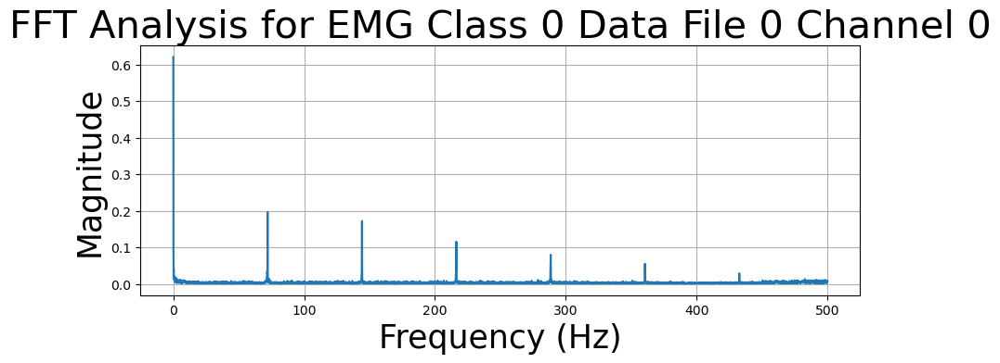

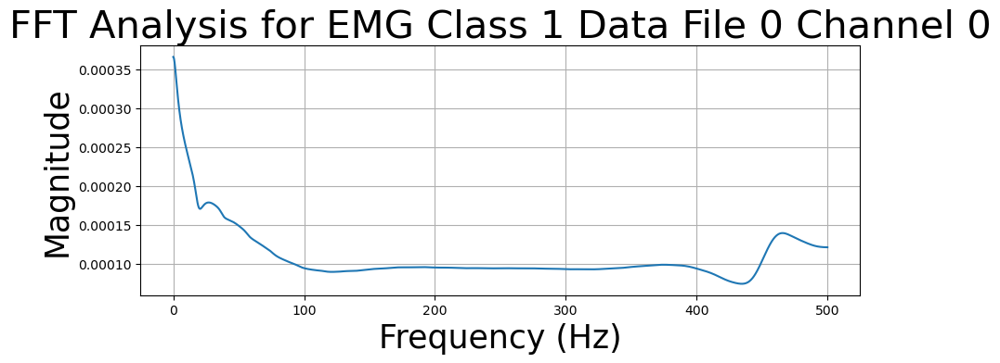

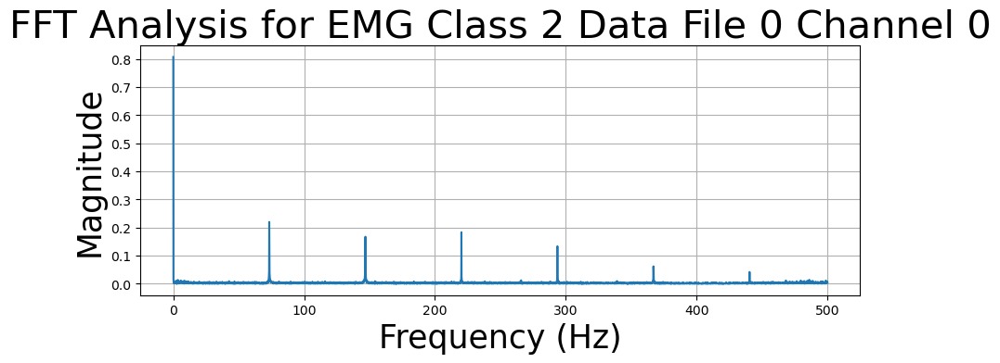

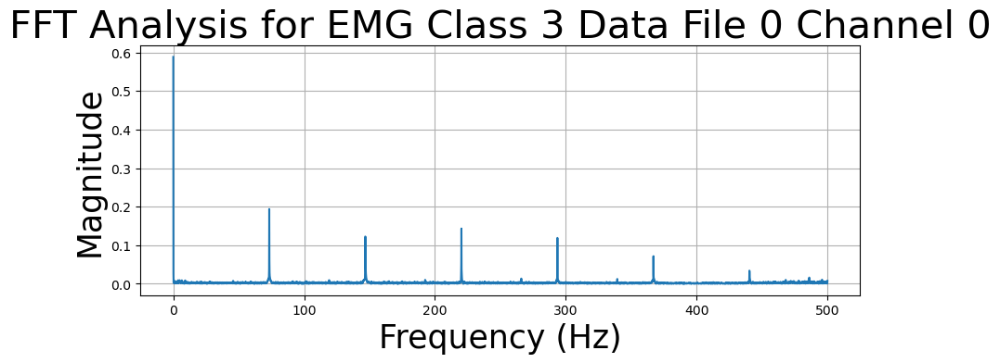

In [18]:

# Define a function to calculate and plot the FFT of a signal
#Descompone la señal en las componentes de frecuencia
def plot_fft(signal, label, signal_index, sampling_rate):
    n = len(signal)
    freq = np.fft.rfftfreq(n, d=1/sampling_rate)
    fft_result = np.abs(np.fft.rfft(signal)) / n
    plt.figure(figsize=(10, 3.5))
    plt.plot(freq, fft_result)
    plt.title(f'FFT Analysis for {label}',  fontsize=30)
    plt.xlabel('Frequency (Hz)',  fontsize=25)
    plt.ylabel('Magnitude',  fontsize=25)
    plt.grid(True)
    plt.show()

# Apply FFT and visualize for each EMG signal
for clase in range(clases):
    sample = 0
    channel = 0
    signal = EMG_DataFiles[clase][sample][channel]
    plot_fft(signal, f'EMG Class {clase} Data File {sample} Channel {channel}', signal_index=sample, sampling_rate=SAMPLE_FREQUENCY)  # Adjust the sampling rate as needed
       


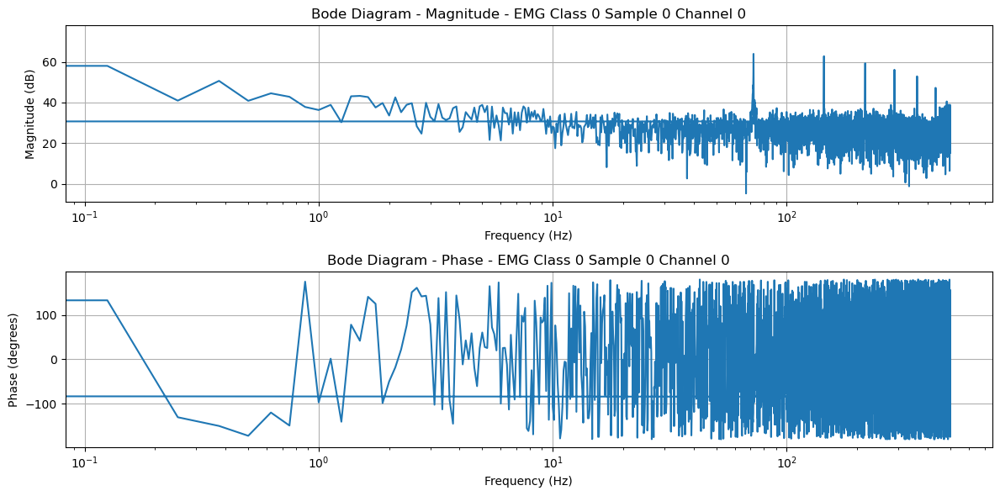

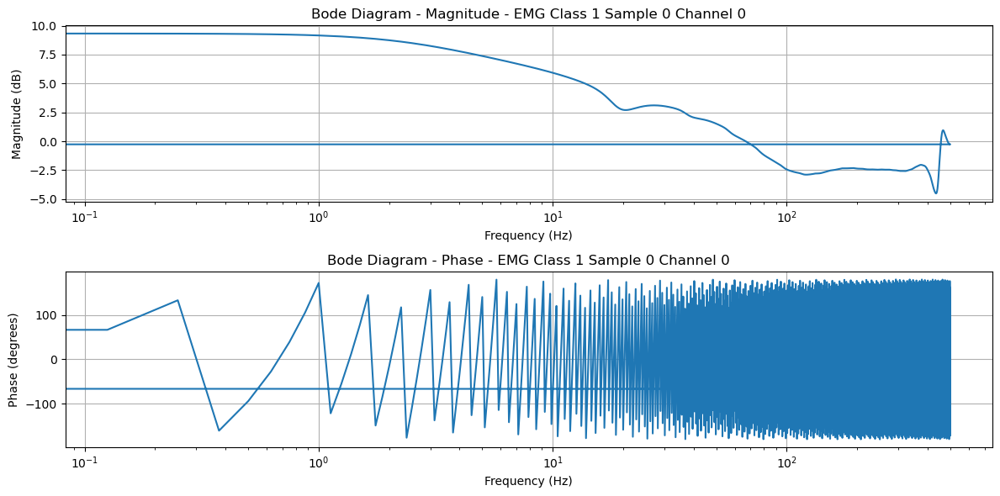

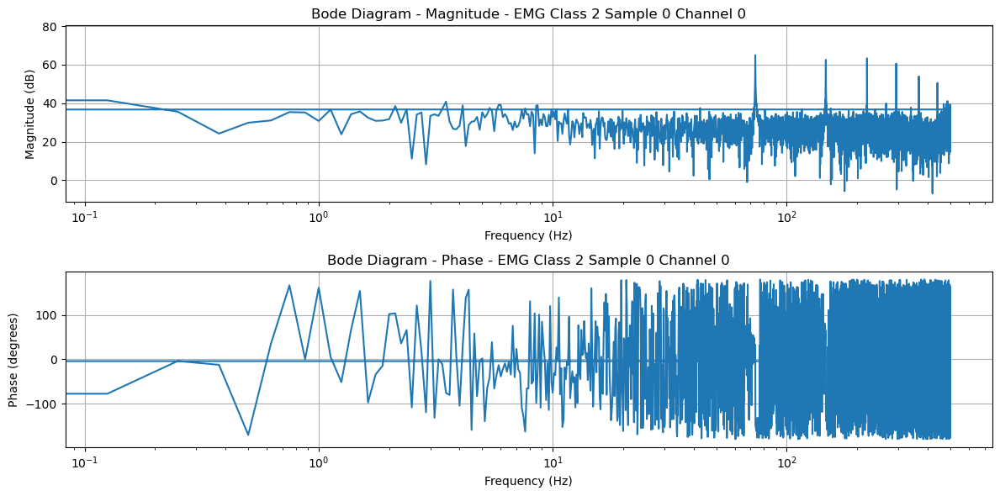

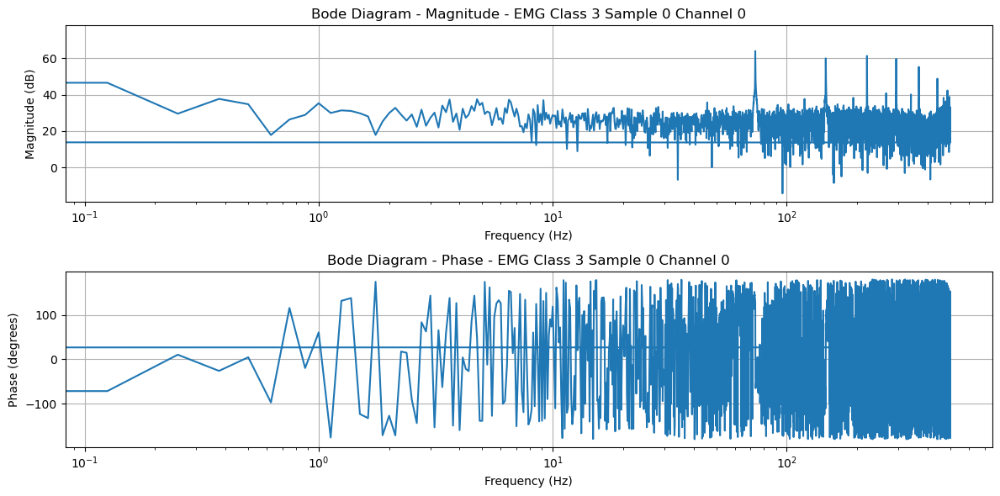

In [19]:
#NO APORTA INFORMACIÓN DE INTERES
# Define a function to calculate and visualize the Bode diagram
#Bode(funcion de transferencia se representa en el dominio de La Place) compuesto por magnitud y fase
def plot_bode_diagram(signal, label, fs=1000):
    n = len(signal)
    freq = np.fft.fftfreq(n, d=1/fs)
    fft_values = np.fft.fft(signal)
    magnitude = np.abs(fft_values)
    phase = np.angle(fft_values)

    plt.figure(figsize=(12, 6))

    # Plot magnitude
    plt.subplot(2, 1, 1)
    plt.semilogx(freq, 20 * np.log10(magnitude))
    plt.title(f'Bode Diagram - Magnitude - {label}')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Magnitude (dB)')
    plt.grid(True)

    # Plot phase
    plt.subplot(2, 1, 2)
    plt.semilogx(freq, np.degrees(phase))
    plt.title(f'Bode Diagram - Phase - {label}')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Phase (degrees)')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

# Apply Bode diagram and visualize for each EMG signal
for clase in range(clases):
    sample = 0
    channel = 0
    signal = EMG_DataFiles[clase][sample][channel]
    plot_bode_diagram(signal, f'EMG Class {clase} Sample {sample} Channel {channel}', fs = SAMPLE_FREQUENCY)  # Adjust the sampling rate as needed
    

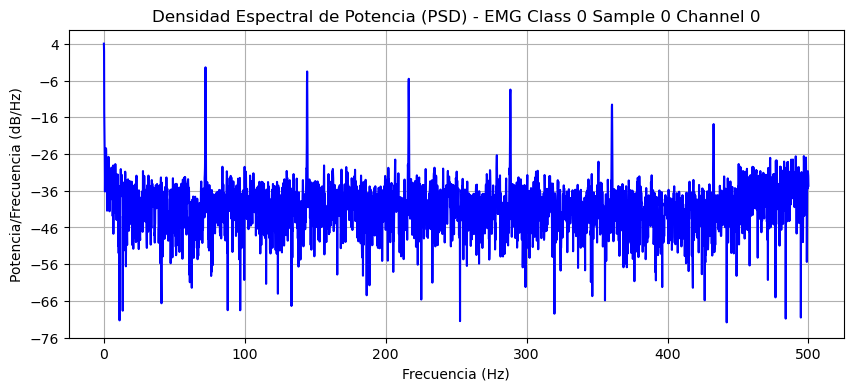

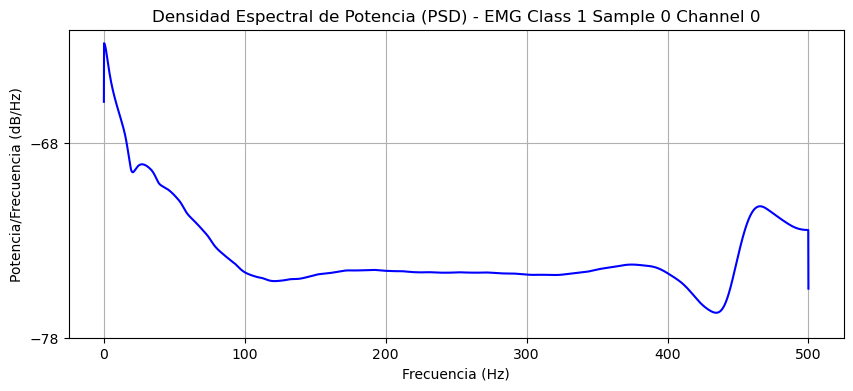

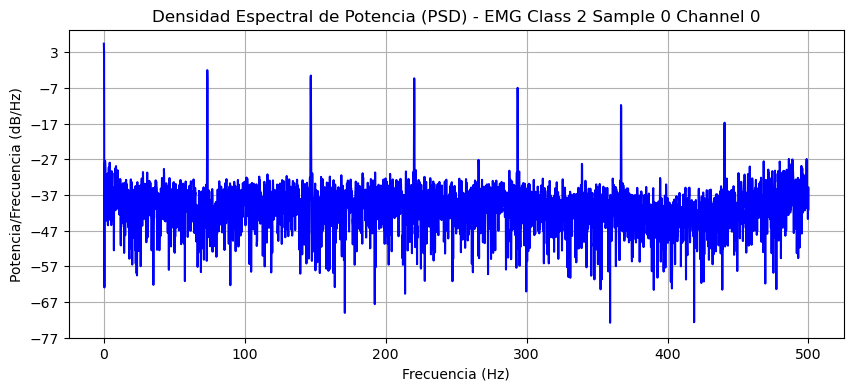

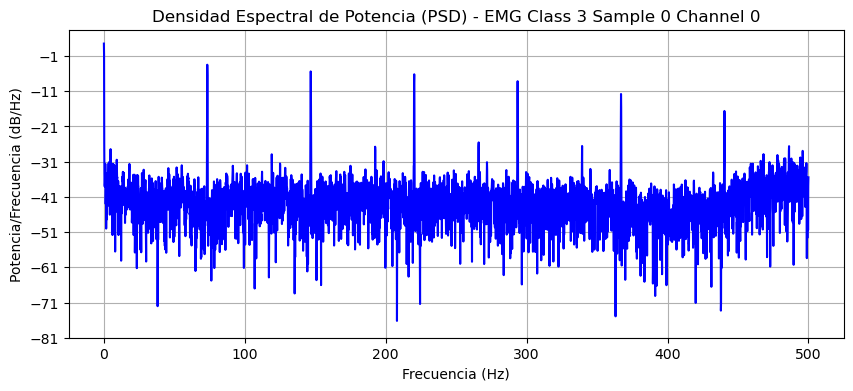

In [20]:
# Función para calcular y visualizar la PSD
#PSD: describe cómo se distribuye la potencia de una señal en funcion de la frecuencia
def plot_power_spectral_density(signal, label, fs=1000):
    plt.figure(figsize=(10, 4))
    plt.psd(signal, NFFT=len(signal), Fs=SAMPLE_FREQUENCY, color='blue', scale_by_freq=True)
    plt.title(f'Densidad Espectral de Potencia (PSD) - {label}')
    plt.xlabel('Frecuencia (Hz)')
    plt.ylabel('Potencia/Frecuencia (dB/Hz)')
    plt.grid(True)
    plt.show()

# Visualizar la PSD para cada EMG signal 
for clase in range(clases):
    sample = 0
    channel = 0
    signal = EMG_DataFiles[clase][sample][channel]
    plot_power_spectral_density(signal, f'EMG Class {clase} Sample {sample} Channel {channel}', fs = SAMPLE_FREQUENCY)  # Adjust the sampling rate as needed
    

# <span style="color:#1C7293;"> 3. Feature Engineering & Extraction </span>

Now that the data has been imported, the next step is to calculate features to enable classification. We can use the biosppy package to extract basicf statistical features, which can be useful as a starting point. Subsequently, we will construct a dataframe named EMG_DF to organize these features.

In [21]:
SAMPLE_CHANNELS = EMG_DataFiles[0][0].shape[0]
SAMPLE_DATA     = EMG_DataFiles[0][0].shape[1]
SAMPLE_SIZE     = 150   #tamaño muestras finales
STRIDE          = 30    #desplazamiento dentro del archivo de datos

NORMALIZATION = True 



<span style="color:#1B3B6F; font-size:30px;"> NORMALIZATION </span>

NORMALIZED DATA
------------------------------------

Class: 0 	MIN =  -1.179156120445301 	Max =  7.469753921465569 
		MEAN =  1.3107976677508209e-18 	std =  0.9999999999999999 
		NaN =  0 	Infinite =  0

Class: 1 	MIN =  -1.3890824667821864 	Max =  11.904984836292176 
		MEAN =  3.841993164097234e-19 	std =  0.9999999999999998 
		NaN =  0 	Infinite =  0

Class: 2 	MIN =  -1.3001476350093177 	Max =  5.398647876626915 
		MEAN =  8.791384357846023e-19 	std =  0.9999999999999999 
		NaN =  0 	Infinite =  0

Class: 3 	MIN =  -1.3692874748374928 	Max =  7.5046278948125025 
		MEAN =  -5.04355769286882e-18 	std =  1.0 
		NaN =  0 	Infinite =  0

 -------------------------------------------------- 

Número de categorias:	 4
Número de muestras por clase:	 [2096, 2096, 1310, 1572]
Número total de muestras:	 7074
Tamaño de cada muestra:	 (1, 150)


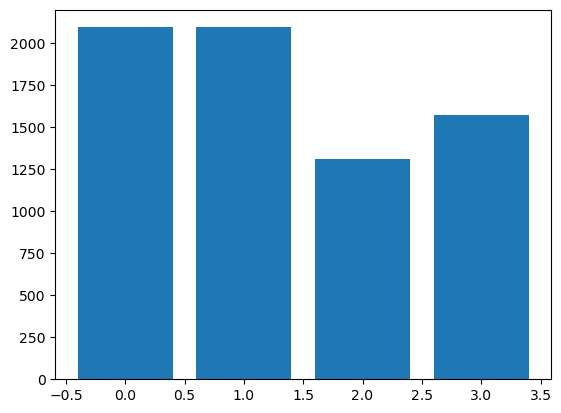

In [22]:

EMG_Signals = []
nsamples = []
for clase in range(clases):
    samples_clase = []
    nsamples_clase = 0

    for sample in EMG_DataFiles[clase]:
        for iz in range(0, SAMPLE_DATA - SAMPLE_SIZE + 1, STRIDE):
              sample_w = sample[:,iz:iz+SAMPLE_SIZE]
                
              if NORMALIZATION:
                  sample_w = (sample_w - np.mean(sample_w)) 
                  if ( np.std(sample_w) !=0):
                      sample_w = sample_w / np.std(sample_w)
              samples_clase.append(sample_w)
              nsamples_clase += 1
    nsamples.append(nsamples_clase)
    EMG_Signals.append(samples_clase)

print('NORMALIZED DATA\n------------------------------------')
for clase in range(clases):
    EMG_Signals[clase] = np.array(EMG_Signals[clase])
    print('\nClass:',clase, 
          '\tMIN = ', np.min(EMG_Signals[clase]), '\tMax = ', np.max(EMG_Signals[clase]), 
          '\n\t\tMEAN = ', np.mean(EMG_Signals[clase]), '\tstd = ', np.std(EMG_Signals[clase]), 
          '\n\t\tNaN = ', np.sum(np.isnan(EMG_Signals[clase])), '\tInfinite = ', np.sum(np.isinf(EMG_Signals[clase])))

print('\n','-'*50,'\n')
print('Número de categorias:\t',len(EMG_Signals))
print('Número de muestras por clase:\t',nsamples)
print('Número total de muestras:\t', np.sum(nsamples))
print('Tamaño de cada muestra:\t', EMG_Signals[0][0].shape)
plt.bar(range(clases), nsamples)
plt.show()


<span style="color:#1B3B6F; font-size:30px;"> EXTRACCION DE CARACTERISTICAS ESTADISTICAS </span>

Processing Class 0  	Samples: 2096


C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to ca

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to ca

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to ca

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to ca

Processing Class 1  	Samples: 2096


C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to ca

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

Processing Class 2  	Samples: 1310


C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to ca

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

Processing Class 3  	Samples: 1572


C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to ca

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t

C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = stats.skew(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:994: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurt = stats.kurtosis(signal, bias=False)
C:\Users\irene\anaconda3\lib\site-packages\biosppy\signals\tools.py:997: RuntimeWarning: Precision loss occurred in moment calculation due t


Built Dataframe:
---------------------------

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7074 entries, 0 to 0
Data columns (total 9 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   mean     7074 non-null   float64
 1   median   7074 non-null   float64
 2   min      7074 non-null   float64
 3   max      7074 non-null   float64
 4   max_amp  7074 non-null   float64
 5   var      7074 non-null   float64
 6   std_dev  7074 non-null   float64
 7   abs_dev  7074 non-null   float64
 8   Class    7074 non-null   int64  
dtypes: float64(8), int64(1)
memory usage: 552.7 KB
None 

           mean    median       min       max   max_amp       var  std_dev  \
0  2.368476e-17 -0.348695 -0.640952  4.424663  4.424663  1.006711  1.00335   
0  1.657933e-16 -0.361878 -0.689400  5.711982  5.711982  1.006711  1.00335   
0 -9.473903e-17 -0.266359 -0.745451  4.908950  4.908950  1.006711  1.00335   
0 -1.776357e-16 -0.272044 -0.794881  4.538395  4.538395  1.00

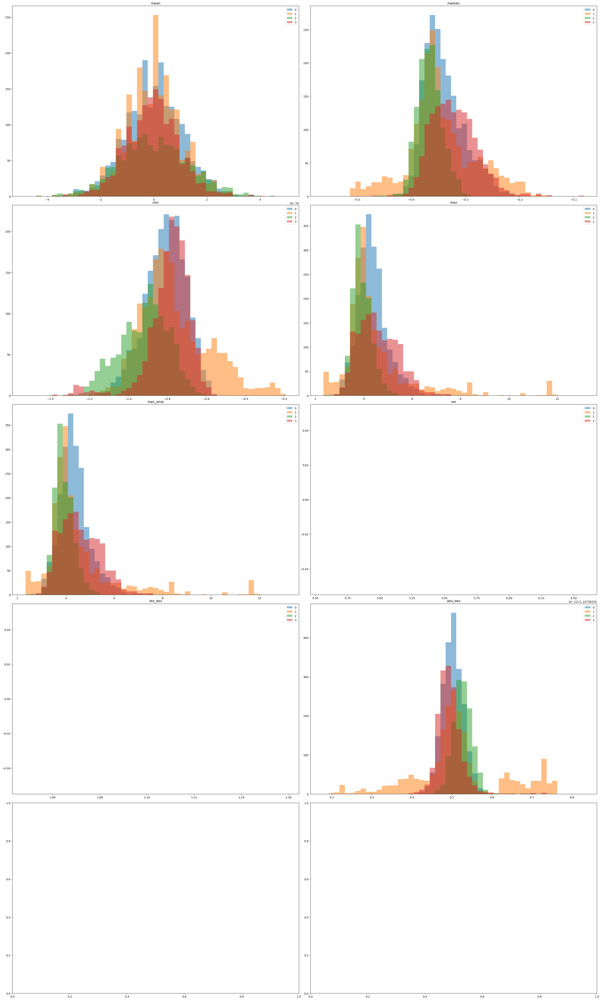

In [23]:

EMG_DF = pd.DataFrame()
# Iterate over each EMG signal
for clase in range(clases):
    print('Processing Class',clase,' \tSamples:', len(EMG_Signals[clase]))
    for sample in EMG_Signals[clase]: 
            
        # Extract features from the EMG signal
        feats_val = []
        f = bs.signals.tools.signal_stats(sample)
        feats_val += list(f[:-2])

        # Save features as a DataFrame row
        new_row = pd.DataFrame(np.array(feats_val).reshape(1, -1), columns=f.keys()[:-2])
        #Now we will need to add a "Class" column to the dataframes
        new_row["Class"] = clase
        # Concatenate DataFrame rows
        if EMG_DF.empty:
            EMG_DF = new_row
        else:
            EMG_DF = pd.concat([EMG_DF, new_row], axis=0)
    
print('\nBuilt Dataframe:\n---------------------------\n')
print(EMG_DF.info(), '\n')
print(EMG_DF.head())

fig, ax = plt.subplots(5, 2,squeeze=False, figsize=(30,50))
fig.tight_layout()
columns = ['mean', 'median', 'min', 'max', 'max_amp', 'var', 'std_dev', 'abs_dev']

EMG_DF_Group = EMG_DF.groupby('Class')

for ix, (column) in enumerate(columns):
    print('\n------------------------------------\nSTATISTIC:\t', column)
    fila = ix//2
    col = ix%2
    print(ix, fila,col)
    bins = np.linspace(1.1*np.min(EMG_DF[column]), 1.1*np.max(EMG_DF[column]), 50)
    for clase in range(clases):    
        histo = EMG_DF_Group.get_group(clase)[column].tolist()
        print('Class:',clase, '\t MIN = ', np.min(histo), '\tMax = ', np.max(histo), '\tNaN = ', np.sum(np.isnan(histo)), '\tInfinite = ', np.sum(np.isinf(histo)))
        ax[fila,col].hist(histo, bins = bins, label = clase, alpha = 0.5)
    ax[fila,col].set_title(column)
    ax[fila,col].legend()

plt.show()


<span style="color:#1B3B6F; font-size:30px;"> DATAFRAME </span>

In [24]:
EMG_DF

,mean,median,min,max,max_amp,var,std_dev,abs_dev,Class
0,2.368476e-17,-0.348695,-0.640952,4.424663,4.424663,1.006711,1.00335,0.465948,0
0,1.657933e-16,-0.361878,-0.689400,5.711982,5.711982,1.006711,1.00335,0.497758,0
0,-9.473903e-17,-0.266359,-0.745451,4.908950,4.908950,1.006711,1.00335,0.527766,0
0,-1.776357e-16,-0.272044,-0.794881,4.538395,4.538395,1.006711,1.00335,0.527162,0
0,-3.552714e-17,-0.281565,-0.805174,4.670309,4.670309,1.006711,1.00335,0.523832,0
...,...,...,...,...,...,...,...,...,...
0,-5.625130e-17,-0.318403,-0.835293,4.388412,4.388412,1.006711,1.00335,0.490579,3
0,8.881784e-17,-0.337060,-0.721710,4.418471,4.418471,1.006711,1.00335,0.475108,3
0,1.095420e-16,-0.346806,-0.731693,4.684402,4.684402,1.006711,1.00335,0.457204,3
0,1.776357e-17,-0.327068,-0.725476,5.025648,5.025648,1.006711,1.00335,0.456248,3


## <span style="color:#3390FF;"> 3.2. Creating More Features </span>

<span style="color:#1B3B6F; font-size:20px;"> GENERAL FUNCTIONS  </span>

In [25]:
#####################################################
##########   PLOT FEATURE HISTOGRAM AND SHOW STATISTICS
#####################################################

def plot_Histogram(histo, feature_name, BINS = 50):
    
    clases = len(histo)
    minimo = []
    maximo = []
    mean = []
    std = []
    nan = []
    inf = []
    
    for clase in range(clases):
        histo[clase] = np.array(histo[clase])
        nan.append(np.sum(np.isnan(histo[clase]) ))
        inf.append(np.sum(np.isinf(histo[clase]) ))
        histo[clase] = histo[clase][~np.isnan(histo[clase])]
        histo[clase] = histo[clase][~np.isinf(histo[clase])]
        minimo.append(np.min(histo[clase]) )
        maximo.append(np.max(histo[clase]) )
        mean.append(np.mean(histo[clase]) )
        std.append(np.std(histo[clase]) )

    
    bins = np.linspace(np.min(minimo), np.min(maximo), BINS)  
    
    print('\nFeature:\t',feature_name,'\n',
              '\n\t\tMIN = ', np.min(minimo), '\tMAX = ', np.max(maximo), 
              '\n\t\tMEAN = ', np.mean(mean), '\tSTD = ', np.mean(std), 
              '\n\t\tNaN = ', np.sum(nan), '\tInfinite = ', np.sum(inf))
    
    for clase in range(clases):
        print('\nClass:\t',clase,
              '\n\t\tMIN = ', minimo[clase], '\tMAX = ', maximo[clase], 
              '\n\t\tMEAN = ', mean[clase], '\tSTD = ', std[clase], 
              '\n\t\tNaN = ', nan[clase], '\tInfinite = ', inf[clase])
        histo[clase] = np.nan_to_num(histo[clase], nan=0)
        plt.hist(histo[clase], bins = bins, label = ''.join(['Class ',str(clase)]), alpha = 0.4)
    
    plt.title(feature_name)
    plt.legend()
    plt.show()

In [26]:
#####################################################
##########   COMPUTE AND  SHOW FEATURE CARACTERISTICS
#####################################################

def get_Feature(feature_function, feature_name, channel = 0, args = None, BINS = 50):
    feature_list = []
    histo   = []
    
    for clase in range(clases):
        print('Processing Class',clase,' \tSamples:', len(EMG_Signals[clase]))
        histo.append([])
        for sample in EMG_Signals[clase]:
            if args is None:
                if channel == -1:
                    feature = 0
                    for c in range(SAMPLE_CHANNELS):
                        feature += feature_function(sample[channel]) / SAMPLE_CHANNELS
                else:
                    feature = feature_function(sample[channel])
            else:
                if channel == -1:
                    feature = 0
                    for c in range(SAMPLE_CHANNELS):
                        
                        feature += feature_function(sample[channel], args) / SAMPLE_CHANNELS
                else:
                    feature = feature_function(sample[channel], args)
            
            feature_list.append(feature)
            histo[clase].append(feature)#valores de cada muestra en mayusculas 
    
    print()
    plot_Histogram(histo, feature_name, BINS)
    #feature_list = np.nan_to_num(feature_list, nan=0)
    
    return feature_list



<span style="color:#1B3B6F; font-size:40px;">  Manual Features - Extraction </span>



In [27]:
###########################################
##########   NEW FEATURE
#####################################
#COMPUTE POWER RATIO: calcula qué fraccion de la potencia total de una señal está concentrada en la
#frecuencia con la maxima potencia

def compute_power_ratio(signal, fs):
    # Compute FFT of the signal
    
    fft_vals = np.fft.fft(signal)

    fft_freqs = np.fft.fftfreq(len(signal), 1/fs)

    # Compute power spectral density
    psd = np.abs(fft_vals) ** 2

    # Find peak frequency
    peak_freq = fft_freqs[np.argmax(psd)]

    # Compute power at peak frequency
    peak_power = psd[fft_freqs == peak_freq][0]

    # Compute total power
    total_power = np.sum(psd)

    if total_power == 0:
        return 0
    
    return peak_power / total_power


Processing Class 0  	Samples: 2096
Processing Class 1  	Samples: 2096
Processing Class 2  	Samples: 1310
Processing Class 3  	Samples: 1572


Feature:	 Power Ratio 
 
		MIN =  0.02080731000246145 	MAX =  0.3030736727884624 
		MEAN =  0.12920012973537603 	STD =  0.028033592591912643 
		NaN =  0 	Infinite =  0

Class:	 0 
		MIN =  0.04929736749945324 	MAX =  0.17629338595256047 
		MEAN =  0.12201906659623026 	STD =  0.021674752622804144 
		NaN =  0 	Infinite =  0

Class:	 1 
		MIN =  0.02080731000246145 	MAX =  0.3030736727884624 
		MEAN =  0.13286165762220556 	STD =  0.056922134014337704 
		NaN =  0 	Infinite =  0

Class:	 2 
		MIN =  0.05482496762371499 	MAX =  0.18250021401420793 
		MEAN =  0.1464230937478375 	STD =  0.01068664091727004 
		NaN =  0 	Infinite =  0

Class:	 3 
		MIN =  0.0553032263433328 	MAX =  0.18052029711757614 
		MEAN =  0.11549670097523074 	STD =  0.02285084281323869 
		NaN =  0 	Infinite =  0


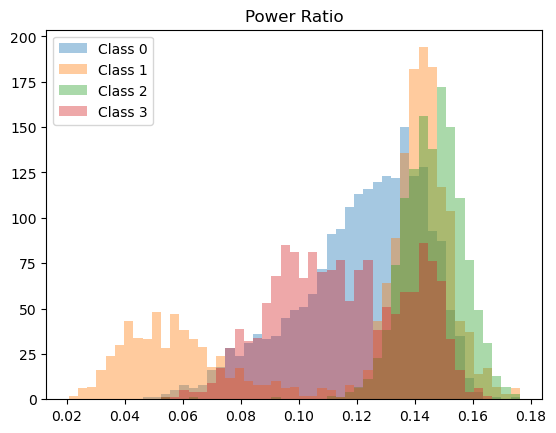

In [28]:
EMG_DF['Power_Ratio'] = get_Feature(compute_power_ratio, 
                                     'Power Ratio', 
                                     channel = -1, 
                                     args = SAMPLE_FREQUENCY)

In [29]:
###########################################
##########   NEW FEATURE
#####################################
#FRECUENCIA FUNDAMENTAL
#Estima la frecuencia fundamental de una señal mediante la autocorrelación. Calcula la autocorrelación, 
#encuentra el primer mínimo después del pico en 0, y usa ese mínimo para determinar la frecuencia fundamental en Hertz.

# Definir la función para calcular la frecuencia fundamental
def calcular_frecuencia_fundamental(señal, fs):
    # Asegurarse de que la señal es un array de una dimensión
    señal = np.squeeze(señal)

    # Calcular la autocorrelación de la señal
    autocorrelacion = np.correlate(señal, señal, mode='full')

    # Mantener solo la mitad derecha de la autocorrelación (la mitad positiva)
    autocorrelacion = autocorrelacion[len(autocorrelacion)//2:]

    # Encontrar el primer mínimo después del primer pico (que es el pico en 0, la autocorrelación máxima)
    primer_minimo = np.argmin(autocorrelacion[1:]) + 1

    # Calcular la frecuencia fundamental en Hz
    frecuencia_fundamental = fs / primer_minimo

    return frecuencia_fundamental

Processing Class 0  	Samples: 2096
Processing Class 1  	Samples: 2096
Processing Class 2  	Samples: 1310
Processing Class 3  	Samples: 1572


Feature:	 Fundamental Frequency 
 
		MIN =  7.462686567164179 	MAX =  500.0 
		MEAN =  269.97393286631865 	STD =  104.4350579525348 
		NaN =  0 	Infinite =  0

Class:	 0 
		MIN =  8.771929824561404 	MAX =  500.0 
		MEAN =  302.18007859358283 	STD =  83.8976638115811 
		NaN =  0 	Infinite =  0

Class:	 1 
		MIN =  7.462686567164179 	MAX =  500.0 
		MEAN =  200.873484926217 	STD =  146.68739323576656 
		NaN =  0 	Infinite =  0

Class:	 2 
		MIN =  15.151515151515152 	MAX =  500.0 
		MEAN =  267.22898318028933 	STD =  109.9125383919165 
		NaN =  0 	Infinite =  0

Class:	 3 
		MIN =  10.204081632653061 	MAX =  500.0 
		MEAN =  309.61318476518545 	STD =  77.24263637087503 
		NaN =  0 	Infinite =  0


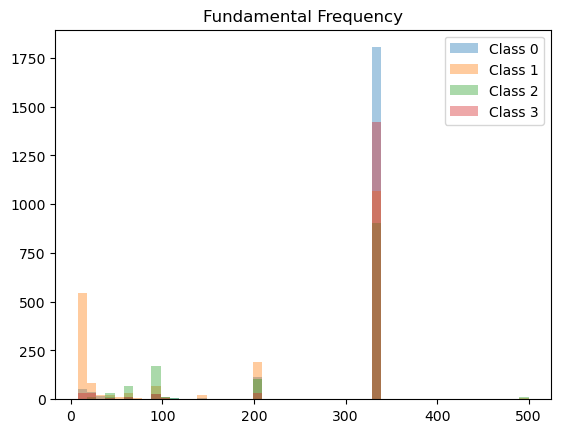

In [30]:
EMG_DF['Frec_Fundamental'] = get_Feature(calcular_frecuencia_fundamental, 
                                          'Fundamental Frequency', 
                                          channel = -1, 
                                          args = SAMPLE_FREQUENCY)

In [31]:
###########################################
##########   NEW FEATURE
#####################################
#FRECUENCIA DOMINANTE
#Identifica la frecuencia dominante de una señal al aplicar la FFT, descartar las frecuencias 
#negativas, y encontrar la frecuencia con la mayor amplitud en la parte positiva del espectro.

def calcular_frecuencia_dominante(señal, fs):
    # Aplicar la transformada de Fourier a la señal
    fft_resultado = fft(señal)

    # Obtener las frecuencias correspondientes
    frecuencias = fftfreq(len(señal), 1/fs)

    # Ignorar la mitad negativa de las frecuencias (simetría en la FFT)
    positivas = frecuencias > 0
    frecuencias_positivas = frecuencias[positivas]
    fft_positiva = fft_resultado[positivas]

    # Encontrar la frecuencia con la mayor amplitud
    frecuencia_dominante = frecuencias_positivas[np.argmax(np.abs(fft_positiva))]

    return frecuencia_dominante


Processing Class 0  	Samples: 2096
Processing Class 1  	Samples: 2096
Processing Class 2  	Samples: 1310
Processing Class 3  	Samples: 1572


Feature:	 Dominant Frequency 
 
		MIN =  6.666666666666667 	MAX =  493.33333333333337 
		MEAN =  71.28758481764208 	STD =  22.202175199375652 
		NaN =  0 	Infinite =  0

Class:	 0 
		MIN =  6.666666666666667 	MAX =  146.66666666666669 
		MEAN =  73.6291348600509 	STD =  6.969693220952853 
		NaN =  0 	Infinite =  0

Class:	 1 
		MIN =  6.666666666666667 	MAX =  493.33333333333337 
		MEAN =  63.40330788804073 	STD =  65.40598226938887 
		NaN =  0 	Infinite =  0

Class:	 2 
		MIN =  73.33333333333334 	MAX =  146.66666666666669 
		MEAN =  73.38931297709927 	STD =  2.0253493910064226 
		NaN =  0 	Infinite =  0

Class:	 3 
		MIN =  6.666666666666667 	MAX =  486.6666666666667 
		MEAN =  74.72858354537746 	STD =  14.407675916154457 
		NaN =  0 	Infinite =  0


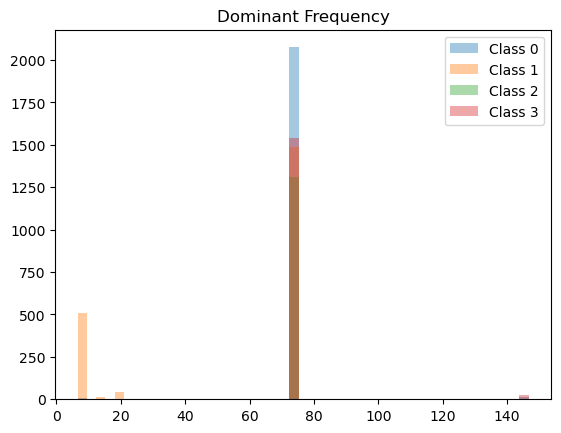

In [32]:
EMG_DF['Frec_Dominante'] = get_Feature(calcular_frecuencia_dominante, 
                                          'Dominant Frequency', 
                                          channel = -1, 
                                          args = SAMPLE_FREQUENCY)

In [33]:
###########################################
##########   NEW FEATURE
#####################################
#FRECUENCIA MEDIA
#Usando la FFT, ponderando las frecuencias por sus magnitudes y promediándolas en función de 
#esas magnitudes.

def calcular_frecuencia_media(signal, fs):
    # Aplicar la transformada de Fourier a la señal
    fft_result = np.fft.fft(signal)
    frequencies = np.fft.fftfreq(len(fft_result), 1/fs)

    # Obtener las magnitudes de la transformada de Fourier
    magnitudes = np.abs(fft_result)

    # Calcular la frecuencia media ponderada por la magnitud
    frecuencia_media = np.sum(frequencies * magnitudes) / np.sum(magnitudes)

    return frecuencia_media


Processing Class 0  	Samples: 2096
Processing Class 1  	Samples: 2096
Processing Class 2  	Samples: 1310
Processing Class 3  	Samples: 1572


Feature:	 Mean Frequency 
 
		MIN =  -19.180568910981403 	MAX =  -0.00015771415041882352 
		MEAN =  -3.1444942073097746 	STD =  2.507143430165788 
		NaN =  0 	Infinite =  0

Class:	 0 
		MIN =  -14.211127922833239 	MAX =  -0.0009904901352858508 
		MEAN =  -2.9979600603306764 	STD =  2.294562763770573 
		NaN =  0 	Infinite =  0

Class:	 1 
		MIN =  -19.180568910981403 	MAX =  -0.00015771415041882352 
		MEAN =  -3.057280436766745 	STD =  2.770135662977801 
		NaN =  0 	Infinite =  0

Class:	 2 
		MIN =  -10.75076668693625 	MAX =  -0.0017248993100902872 
		MEAN =  -2.8285609389108943 	STD =  2.139217073833942 
		NaN =  0 	Infinite =  0

Class:	 3 
		MIN =  -16.953990969660666 	MAX =  -0.0009366779602471219 
		MEAN =  -3.6941753932307826 	STD =  2.8246582200808366 
		NaN =  0 	Infinite =  0


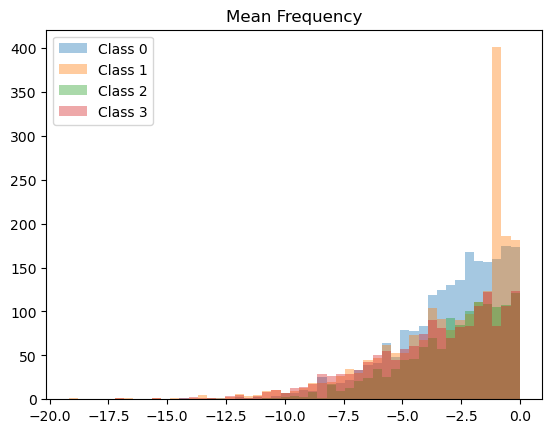

In [34]:
EMG_DF['Frec_Mean'] = get_Feature(calcular_frecuencia_media, 
                                          'Mean Frequency', 
                                          channel = -1, 
                                          args = SAMPLE_FREQUENCY)

In [35]:
###########################################
##########   NEW FEATURE
#####################################
# ENTROPY (From Scipy Function)
#calcula la entropía de una señal, ajustando la señal para que todos los valores sean positivos
#antes de aplicar la función de entropía de la biblioteca SciPy.

def entropy_scipy(signal):
    epsilon = 1e-7
    if np.min(signal) <= 0:
        signal = signal - np.min(signal) + epsilon
    return entropy(signal)

Processing Class 0  	Samples: 2096
Processing Class 1  	Samples: 2096
Processing Class 2  	Samples: 1310
Processing Class 3  	Samples: 1572


Feature:	 Entropy 
 
		MIN =  2.681297945766738 	MAX =  4.78224172240867 
		MEAN =  4.483323398073953 	STD =  0.13681338718063432 
		NaN =  0 	Infinite =  0

Class:	 0 
		MIN =  4.0369869075191716 	MAX =  4.747414674929785 
		MEAN =  4.488899823549098 	STD =  0.1099353054917386 
		NaN =  0 	Infinite =  0

Class:	 1 
		MIN =  2.681297945766738 	MAX =  4.757324482970841 
		MEAN =  4.393827333725936 	STD =  0.22902385010796536 
		NaN =  0 	Infinite =  0

Class:	 2 
		MIN =  4.184059286184007 	MAX =  4.772342140834476 
		MEAN =  4.575637736671764 	STD =  0.10365244465232477 
		NaN =  0 	Infinite =  0

Class:	 3 
		MIN =  4.085812789941393 	MAX =  4.78224172240867 
		MEAN =  4.474928698349013 	STD =  0.1046419484705086 
		NaN =  0 	Infinite =  0


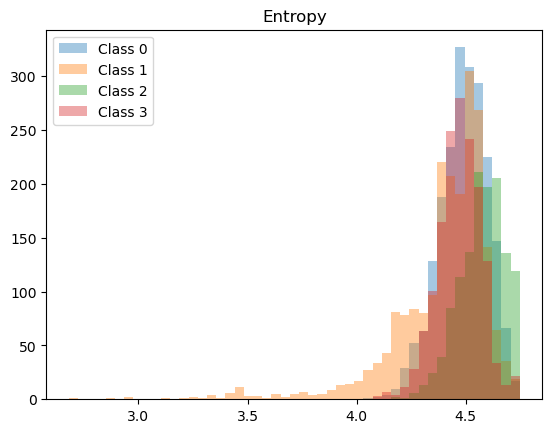

In [36]:
EMG_DF['Entropy'] = get_Feature(entropy_scipy, 
                              'Entropy', 
                              channel = -1, 
                              args = None)

In [37]:
###########################################
##########   NEW FEATURE
#####################################
#SHANNON ENTROPY
#Calcula la entropía de Shannon de una señal normalizando primero los valores de la señal para que
#sumen 1, y luego usando la fórmula de entropía de Shannon para medir la incertidumbre en la 
#distribución de probabilidad de la señal.
def shannon_entropy(signal):
    # Normaliza la señal para que la suma de las probabilidades sea 1
    if (np.min(signal) < 0):
        signal = signal - np.min(signal) + 1e-5
    
    normalized_signal = signal / np.sum(signal)
    
    # Calcula la entropía de Shannon
    entropy = -np.sum(normalized_signal * np.log2(normalized_signal))
    
    return entropy


Processing Class 0  	Samples: 2096
Processing Class 1  	Samples: 2096
Processing Class 2  	Samples: 1310
Processing Class 3  	Samples: 1572


Feature:	 Entropy Shannon 
 
		MIN =  3.86865641300488 	MAX =  6.899321959930756 
		MEAN =  6.468089694470053 	STD =  0.19736888532278807 
		NaN =  0 	Infinite =  0

Class:	 0 
		MIN =  5.824192223547586 	MAX =  6.8490784477996876 
		MEAN =  6.476133407267253 	STD =  0.15859643534092013 
		NaN =  0 	Infinite =  0

Class:	 1 
		MIN =  3.86865641300488 	MAX =  6.863375066798072 
		MEAN =  6.3389822903428605 	STD =  0.33038555062698 
		NaN =  0 	Infinite =  0

Class:	 2 
		MIN =  6.036360583673076 	MAX =  6.885040194454446 
		MEAN =  6.6012646344613986 	STD =  0.14953340159418965 
		NaN =  0 	Infinite =  0

Class:	 3 
		MIN =  5.8946298803626265 	MAX =  6.899321959930756 
		MEAN =  6.455978445808701 	STD =  0.1509601537290626 
		NaN =  0 	Infinite =  0


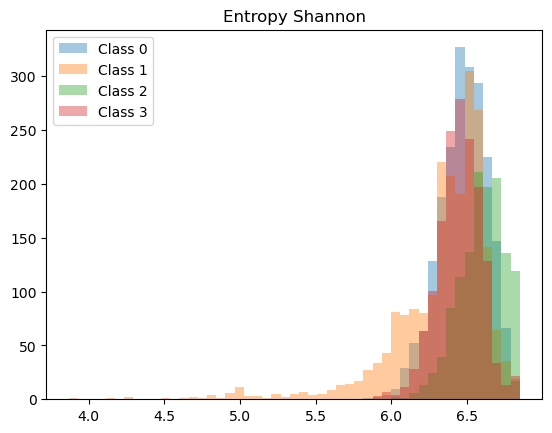

In [38]:
EMG_DF['Entropy_Shannon'] = get_Feature(shannon_entropy, 
                                          'Entropy Shannon', 
                                          channel = -1, 
                                          args = None)

In [39]:
###########################################
##########   NEW FEATURE
###########################################
#ENERGIA
#Suma el cuadrado de todos sus valores(dom tiempo) 
def energy(signal):
    #print(np.sum(np.square(signal)), np.max(np.square(signal)))
    return np.sum(np.square(signal))


Processing Class 0  	Samples: 2096
Processing Class 1  	Samples: 2096
Processing Class 2  	Samples: 1310
Processing Class 3  	Samples: 1572


Feature:	 energy 
 
		MIN =  149.9999999999999 	MAX =  150.0000000000001 
		MEAN =  150.0 	STD =  2.873510414711563e-14 
		NaN =  0 	Infinite =  0

Class:	 0 
		MIN =  149.99999999999991 	MAX =  150.0000000000001 
		MEAN =  150.0 	STD =  2.7977539506295412e-14 
		NaN =  0 	Infinite =  0

Class:	 1 
		MIN =  149.9999999999999 	MAX =  150.0000000000001 
		MEAN =  150.0 	STD =  2.8231231491205096e-14 
		NaN =  0 	Infinite =  0

Class:	 2 
		MIN =  149.9999999999999 	MAX =  150.00000000000009 
		MEAN =  150.0 	STD =  2.9622178685054866e-14 
		NaN =  0 	Infinite =  0

Class:	 3 
		MIN =  149.99999999999991 	MAX =  150.00000000000009 
		MEAN =  150.0 	STD =  2.9109466905907154e-14 
		NaN =  0 	Infinite =  0


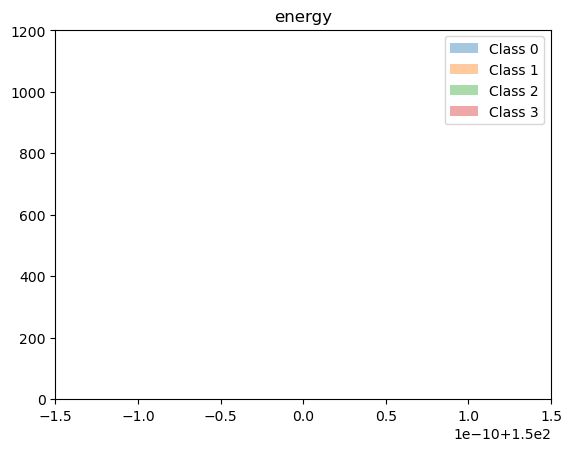

In [40]:
EMG_DF['Energy'] = get_Feature(energy, 
                              'energy', 
                              channel = -1, 
                              args = None)

In [41]:
###########################################
##########   NEW FEATURE
#####################################
#CRESTA FACTOR
#Relación entre el valor máximo de la señal y su valor cuadrático

def calcular_cresta_factor(señal):
    return np.max(señal) / np.sqrt(np.mean(señal**2))


Processing Class 0  	Samples: 2096
Processing Class 1  	Samples: 2096
Processing Class 2  	Samples: 1310
Processing Class 3  	Samples: 1572


Feature:	 Cresta_Factor 
 
		MIN =  2.119903426990518 	MAX =  11.904984836292176 
		MEAN =  4.303533851881849 	STD =  0.8518795332166718 
		NaN =  0 	Infinite =  0

Class:	 0 
		MIN =  2.614266974574996 	MAX =  7.469753921465569 
		MEAN =  4.35100221717387 	STD =  0.6181854656683298 
		NaN =  0 	Infinite =  0

Class:	 1 
		MIN =  2.119903426990518 	MAX =  11.904984836292176 
		MEAN =  4.35470126507213 	STD =  1.5976289184278885 
		NaN =  0 	Infinite =  0

Class:	 2 
		MIN =  2.4925203169281858 	MAX =  5.398647876626915 
		MEAN =  3.921147303649859 	STD =  0.38520120597668933 
		NaN =  0 	Infinite =  0

Class:	 3 
		MIN =  2.7726672501184 	MAX =  7.504627894812503 
		MEAN =  4.587284621631538 	STD =  0.8065025427937793 
		NaN =  0 	Infinite =  0


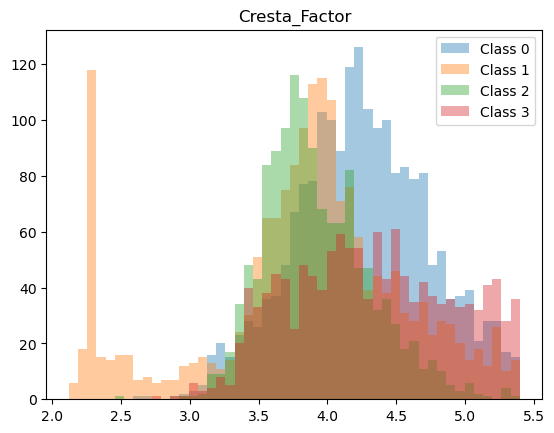

In [42]:
EMG_DF['Cresta_Factor'] = get_Feature(calcular_cresta_factor, 
                              'Cresta_Factor', 
                              channel = -1, 
                              args = None)

In [43]:
###########################################
##########   NEW FEATURE
#####################################
#PEAK HEIGHT AUTOCORRELATION 
#Calcula la altura del pico más alto en la autocorrelacion d ela señal. 

def calculate_peak_height_autocorrelation(signal):
    # Calculate the autocorrelation of the signal
    autocorrelation = np.correlate(signal, signal, mode='full')

    # Keep only the right half of the autocorrelation (positive half)
    autocorrelation = autocorrelation[len(autocorrelation)//2:]


    # Find the index of the highest peak in the autocorrelation
    peak_indices, _ = find_peaks(autocorrelation, height=0)

    if len(peak_indices) == 0:
        # No peaks found
        return 0.0

    peak_index = peak_indices[0]

    # Calculate the height of the highest peak
    peak_height = autocorrelation[peak_index]

    return peak_height

Processing Class 0  	Samples: 2096
Processing Class 1  	Samples: 2096
Processing Class 2  	Samples: 1310
Processing Class 3  	Samples: 1572


Feature:	 Peak_Height_Autocorrelation 
 
		MIN =  0.0 	MAX =  134.48190598459286 
		MEAN =  79.10261572774185 	STD =  30.05561589802902 
		NaN =  0 	Infinite =  0

Class:	 0 
		MIN =  0.011042734261083265 	MAX =  129.46771375152062 
		MEAN =  86.08093526809323 	STD =  34.8092830971675 
		NaN =  0 	Infinite =  0

Class:	 1 
		MIN =  0.0 	MAX =  134.48190598459286 
		MEAN =  63.13560118717076 	STD =  40.284971586445366 
		NaN =  0 	Infinite =  0

Class:	 2 
		MIN =  72.5453200205494 	MAX =  119.34998408620264 
		MEAN =  101.05620452602774 	STD =  7.152610282868971 
		NaN =  0 	Infinite =  0

Class:	 3 
		MIN =  0.01041013686783998 	MAX =  117.62563592788908 
		MEAN =  66.13772192967566 	STD =  37.97559862563425 
		NaN =  0 	Infinite =  0


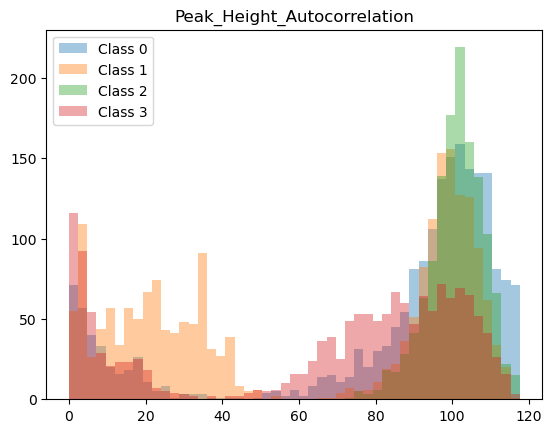

In [44]:
EMG_DF['Peak_Height_Autocorrelation'] = get_Feature(calculate_peak_height_autocorrelation, 
                              'Peak_Height_Autocorrelation', 
                              channel = -1, 
                              args = None)

In [45]:
###########################################
##########   NEW FEATURE
#####################################
#DESV DE AUTOCORRELACION 

# Función para calcular la desviación estándar de la autocorrelación
def calcular_std_autocorrelacion(signal):
    # Calcular la autocorrelación de la señal
    autocorrelacion = np.correlate(signal, signal, mode='full')

    # Mantener solo la mitad derecha de la autocorrelación (la mitad positiva)
    autocorrelacion = autocorrelacion[len(autocorrelacion)//2:]

    # Calcular la desviación estándar de la autocorrelación
    std_autocorrelacion = np.std(autocorrelacion)

    return std_autocorrelacion


Processing Class 0  	Samples: 2096
Processing Class 1  	Samples: 2096
Processing Class 2  	Samples: 1310
Processing Class 3  	Samples: 1572


Feature:	 STD_Autocorrelacion 
 
		MIN =  12.848208903081343 	MAX =  49.96067341462602 
		MEAN =  26.10513582091693 	STD =  4.1452833235906885 
		NaN =  0 	Infinite =  0

Class:	 0 
		MIN =  15.87750271063639 	MAX =  29.9240678753463 
		MEAN =  25.274826488567363 	STD =  2.9743533506105644 
		NaN =  0 	Infinite =  0

Class:	 1 
		MIN =  12.848208903081343 	MAX =  49.96067341462602 
		MEAN =  27.787603342316427 	STD =  9.293688130539723 
		NaN =  0 	Infinite =  0

Class:	 2 
		MIN =  19.501937468580255 	MAX =  31.26279478254975 
		MEAN =  27.786489069468686 	STD =  1.2003287831769125 
		NaN =  0 	Infinite =  0

Class:	 3 
		MIN =  16.521656322464008 	MAX =  32.304571400676004 
		MEAN =  23.571624383315257 	STD =  3.112763030035555 
		NaN =  0 	Infinite =  0


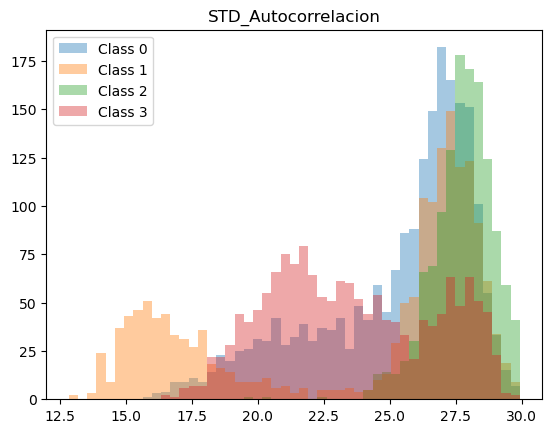

In [46]:
EMG_DF['STD_Autocorrelacion'] = get_Feature(calcular_std_autocorrelacion, 
                              'STD_Autocorrelacion', 
                              channel = -1, 
                              args = None)

In [47]:
###########################################
##########   NEW FEATURE
#####################################
#CORRELACION PEARSON(entre dos señales)
#1)ajusta las longitudes de las señales para que sean iguales, 
#2)utiliza la función pearsonr para medir la relación lineal entre ellas.

# Definir la función para calcular la correlación de Pearson
def calcular_correlacion_pearson(signal, reference_signal):
    # Asegurarse de que ambas señales tengan la misma longitud
    min_len = min(len(signal), len(reference_signal))

    signal = signal[:min_len]
    reference_signal = reference_signal[:min_len]

    # Calcular la correlación de Pearson
    correlacion, _ = pearsonr(signal, reference_signal)

    return correlacion

Processing Class 0  	Samples: 2096
Processing Class 1  	Samples: 2096
Processing Class 2  	Samples: 1310
Processing Class 3  	Samples: 1572


Feature:	 Correlacion_Pearson 
 
		MIN =  -0.18330177926192898 	MAX =  1.0 
		MEAN =  0.005403155564372746 	STD =  0.1739315964192194 
		NaN =  0 	Infinite =  0

Class:	 0 
		MIN =  -0.18148767598617294 	MAX =  1.0 
		MEAN =  -0.0003776650838770608 	STD =  0.19463695609587214 
		NaN =  0 	Infinite =  0

Class:	 1 
		MIN =  -0.17645723320133372 	MAX =  0.4892711563587006 
		MEAN =  0.022663343716225758 	STD =  0.15957548068223723 
		NaN =  0 	Infinite =  0

Class:	 2 
		MIN =  -0.17473964588280927 	MAX =  0.507692732186098 
		MEAN =  -0.0002179055967951557 	STD =  0.18064055662021722 
		NaN =  0 	Infinite =  0

Class:	 3 
		MIN =  -0.18330177926192898 	MAX =  0.5215886294352627 
		MEAN =  -0.0004551507780625554 	STD =  0.16087339227855102 
		NaN =  0 	Infinite =  0


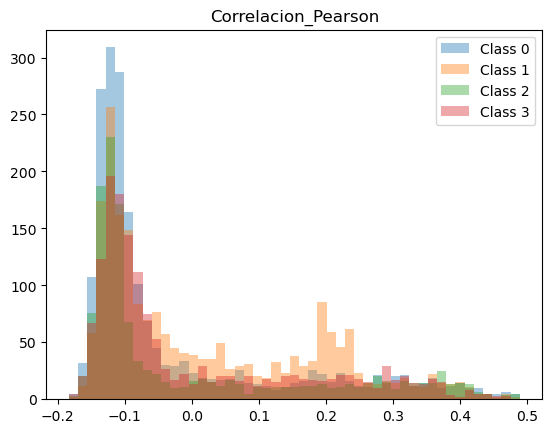

In [48]:
mean_signal = np.mean(EMG_Signals[:][:][0], axis = 1)[0]

EMG_DF['Correlacion_Pearson'] = get_Feature(calcular_correlacion_pearson, 
                              'Correlacion_Pearson', 
                              channel = -1, 
                              args = mean_signal)

In [49]:
###########################################
##########   NEW FEATURE
#####################################
#COEFICIENTE VARIACION
#Relacion entre la desviacion estandar y la media de la señal. 
#Si la media es 0, devuelve 0 para evitar division por 0

# Función para calcular el coeficiente de variación (CV)
def calcular_coeficiente_variacion(signal):
    if  np.mean(signal) != 0:
        coef = np.std(signal) / np.mean(signal)
    else:
        coef = 0
    return coef


Processing Class 0  	Samples: 2096
Processing Class 1  	Samples: 2096
Processing Class 2  	Samples: 1310
Processing Class 3  	Samples: 1572


Feature:	 Coeficiente_Variacion 
 
		MIN =  -2.7021597764222976e+18 	MAX =  2.7021597764222976e+18 
		MEAN =  -1828239723869909.5 	STD =  7.902428095208155e+16 
		NaN =  0 	Infinite =  0

Class:	 0 
		MIN =  -1.3510798882111488e+18 	MAX =  5.4043195528445965e+17 
		MEAN =  -1572251549238619.8 	STD =  7.490773887448395e+16 
		NaN =  0 	Infinite =  0

Class:	 1 
		MIN =  -2.7021597764222976e+18 	MAX =  2.7021597764222976e+18 
		MEAN =  -3476260387209645.0 	STD =  1.2407006181496168e+17 
		NaN =  0 	Infinite =  0

Class:	 2 
		MIN =  -6.755399441055744e+17 	MAX =  3.377699720527872e+17 
		MEAN =  -2653609305164496.5 	STD =  5.2097691448206344e+16 
		NaN =  0 	Infinite =  0

Class:	 3 
		MIN =  -6.755399441055741e+17 	MAX =  6.755399441055744e+17 
		MEAN =  389162346133123.94 	STD =  6.502163167067422e+16 
		NaN =  0 	Infinite =  0


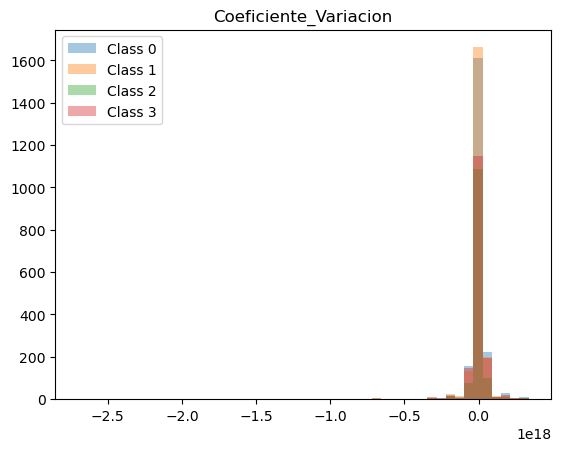

In [50]:
EMG_DF['Coeficiente_Variacion'] = get_Feature(calcular_coeficiente_variacion, 
                              'Coeficiente_Variacion', 
                              channel = 0, 
                              args = None)

In [51]:
###########################################
##########   NEW FEATURE
#####################################
#FOURIER TRANSFORM FEATURES 
#Calcula las caracteristicas especificas de la FFT

def calculate_fft_features(signal, feature):
    # Calculate FFT for the input signal
    fft_result = np.fft.fft(signal)
    frequencies = np.fft.fftfreq(len(fft_result))

    # Find the dominant frequency
    dominant_frequency = frequencies[np.argmax(np.abs(fft_result))]

    # Find the magnitude at 0.0 Hz
    magnitude_at_0 = np.abs(fft_result)[np.where(frequencies == 0.0)][0]

    # Calculate the absolute value of the dominant frequency
    absolute_dominant_frequency = abs(dominant_frequency)

    if feature == 'Abs_Dom_Frequency':
        return absolute_dominant_frequency
    if feature == 'Dom_Frequency':
        return dominant_frequency
    if feature ==  'At_Zero_Frequency':
        return magnitude_at_0



Processing Class 0  	Samples: 2096
Processing Class 1  	Samples: 2096
Processing Class 2  	Samples: 1310
Processing Class 3  	Samples: 1572


Feature:	 fft_features 
 
		MIN =  -0.5 	MAX =  0.49333333333333335 
		MEAN =  0.026535464376590337 	STD =  0.07816605367466278 
		NaN =  0 	Infinite =  0

Class:	 0 
		MIN =  -0.5 	MAX =  0.14666666666666667 
		MEAN =  0.03018129770992367 	STD =  0.06837853806470577 
		NaN =  0 	Infinite =  0

Class:	 1 
		MIN =  -0.5 	MAX =  0.49333333333333335 
		MEAN =  0.019484732824427482 	STD =  0.10584522673726307 
		NaN =  0 	Infinite =  0

Class:	 2 
		MIN =  -0.07333333333333333 	MAX =  0.14666666666666667 
		MEAN =  0.02715012722646311 	STD =  0.06821263732618131 
		NaN =  0 	Infinite =  0

Class:	 3 
		MIN =  -0.4866666666666667 	MAX =  0.14666666666666667 
		MEAN =  0.02932569974554708 	STD =  0.07022781257050095 
		NaN =  0 	Infinite =  0


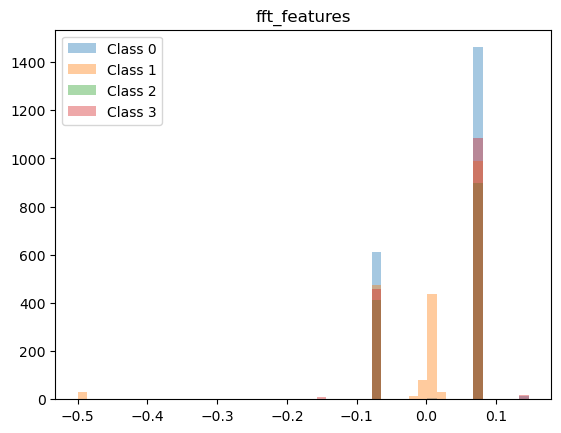

Processing Class 0  	Samples: 2096
Processing Class 1  	Samples: 2096
Processing Class 2  	Samples: 1310
Processing Class 3  	Samples: 1572


Feature:	 fft_features 
 
		MIN =  0.006666666666666667 	MAX =  0.5 
		MEAN =  0.07280635072094996 	STD =  0.027606935304071756 
		NaN =  0 	Infinite =  0

Class:	 0 
		MIN =  0.006666666666666667 	MAX =  0.5 
		MEAN =  0.07383269720101782 	STD =  0.011630478207893064 
		NaN =  0 	Infinite =  0

Class:	 1 
		MIN =  0.006666666666666667 	MAX =  0.5 
		MEAN =  0.06927480916030533 	STD =  0.08236423770123309 
		NaN =  0 	Infinite =  0

Class:	 2 
		MIN =  0.07333333333333333 	MAX =  0.14666666666666667 
		MEAN =  0.07338931297709925 	STD =  0.002025349391006422 
		NaN =  0 	Infinite =  0

Class:	 3 
		MIN =  0.006666666666666667 	MAX =  0.4866666666666667 
		MEAN =  0.07472858354537747 	STD =  0.014407675916154453 
		NaN =  0 	Infinite =  0


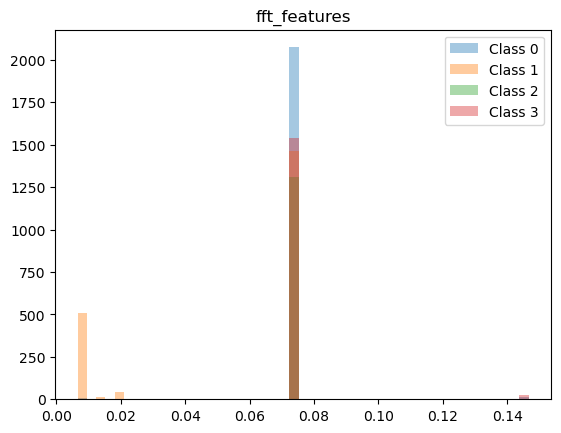

Processing Class 0  	Samples: 2096
Processing Class 1  	Samples: 2096
Processing Class 2  	Samples: 1310
Processing Class 3  	Samples: 1572


Feature:	 fft_features 
 
		MIN =  0.0 	MAX =  6.850076061937216e-14 
		MEAN =  1.2787759524601365e-14 	STD =  9.999855379044906e-15 
		NaN =  0 	Infinite =  0

Class:	 0 
		MIN =  0.0 	MAX =  5.5067062021407764e-14 
		MEAN =  1.2685463366769023e-14 	STD =  9.848839507907996e-15 
		NaN =  0 	Infinite =  0

Class:	 1 
		MIN =  0.0 	MAX =  5.950795411990839e-14 
		MEAN =  1.1506513511301732e-14 	STD =  9.411320598147794e-15 
		NaN =  0 	Infinite =  0

Class:	 2 
		MIN =  0.0 	MAX =  6.850076061937216e-14 
		MEAN =  1.5699019692370357e-14 	STD =  1.1666540440189052e-14 
		NaN =  0 	Infinite =  0

Class:	 3 
		MIN =  0.0 	MAX =  5.46229728115577e-14 
		MEAN =  1.1260041527964346e-14 	STD =  9.072720969934784e-15 
		NaN =  0 	Infinite =  0


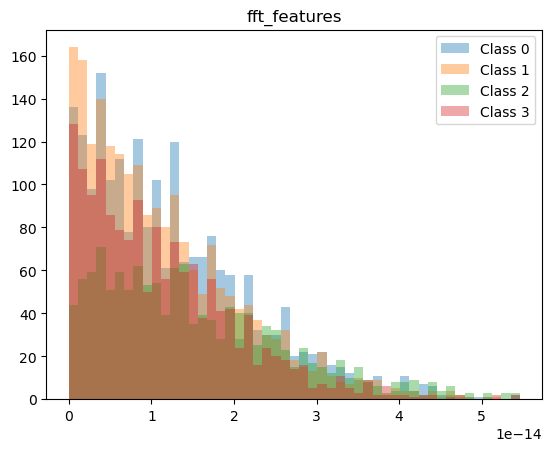

In [52]:
EMG_DF['Dom_Frequency'] = get_Feature(calculate_fft_features, 
                              'fft_features', 
                              channel = 0, 
                              args = 'Dom_Frequency')

EMG_DF['Abs_Dom_Frequency'] = get_Feature(calculate_fft_features, 
                              'fft_features', 
                              channel = 0, 
                              args = 'Abs_Dom_Frequency')

EMG_DF['At_Zero_Frequency'] = get_Feature(calculate_fft_features, 
                              'fft_features', 
                              channel = 0, 
                              args = 'At_Zero_Frequency')


In [53]:
###########################################
##########   NEW FEATURE
#####################################
#PEAK DENSITY & PEAK COUNTS 
#Densidad de picos en una serie temporal al contar cuantos valores absolutos superan un umbral(threshold)
#Devuelve el numero de picos que superan el umbral .

def calculate_peak_density(time_series, threshold):
    # Use a simple peak detection approach based on a threshold.
    peaks = (abs(time_series) > threshold)
    peak_count = np.sum(peaks)
    return peak_count


Processing Class 0  	Samples: 2096
Processing Class 1  	Samples: 2096
Processing Class 2  	Samples: 1310
Processing Class 3  	Samples: 1572


Feature:	 Peak_Density 
 
		MIN =  2 	MAX =  75 
		MEAN =  23.09836991094148 	STD =  6.6601996018395635 
		NaN =  0 	Infinite =  0

Class:	 0 
		MIN =  9 	MAX =  53 
		MEAN =  21.924141221374047 	STD =  4.1251265568255615 
		NaN =  0 	Infinite =  0

Class:	 1 
		MIN =  2 	MAX =  75 
		MEAN =  23.98854961832061 	STD =  14.454187386736647 
		NaN =  0 	Infinite =  0

Class:	 2 
		MIN =  18 	MAX =  55 
		MEAN =  25.644274809160304 	STD =  3.194488581686547 
		NaN =  0 	Infinite =  0

Class:	 3 
		MIN =  10 	MAX =  57 
		MEAN =  20.83651399491094 	STD =  4.866995882109498 
		NaN =  0 	Infinite =  0


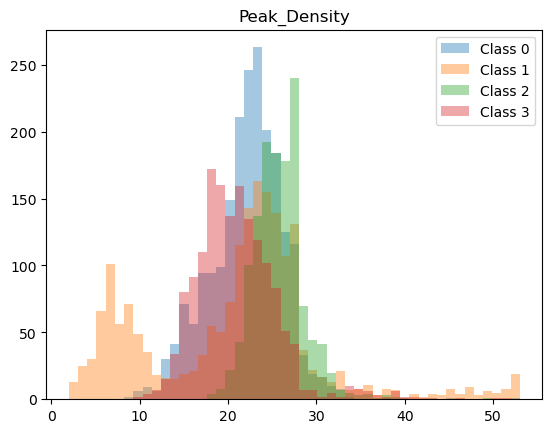

In [54]:
threshold = 0.8
EMG_DF['Peak_Density'] = get_Feature(calculate_peak_density, 
                              'Peak_Density', 
                              channel = 0, 
                              args = threshold)

In [55]:
#PEAK COUNTS
#cuántos valores en una señal superan un umbral específico. Devuelve el número total de valores 
#cuya magnitud es mayor que el umbral dado.
def calculate_peak_count(signal, threshold):
   
    return np.sum(abs(signal) > threshold)

Processing Class 0  	Samples: 2096
Processing Class 1  	Samples: 2096
Processing Class 2  	Samples: 1310
Processing Class 3  	Samples: 1572


Feature:	 Peak_Counts 
 
		MIN =  2 	MAX =  75 
		MEAN =  23.09836991094148 	STD =  6.6601996018395635 
		NaN =  0 	Infinite =  0

Class:	 0 
		MIN =  9 	MAX =  53 
		MEAN =  21.924141221374047 	STD =  4.1251265568255615 
		NaN =  0 	Infinite =  0

Class:	 1 
		MIN =  2 	MAX =  75 
		MEAN =  23.98854961832061 	STD =  14.454187386736647 
		NaN =  0 	Infinite =  0

Class:	 2 
		MIN =  18 	MAX =  55 
		MEAN =  25.644274809160304 	STD =  3.194488581686547 
		NaN =  0 	Infinite =  0

Class:	 3 
		MIN =  10 	MAX =  57 
		MEAN =  20.83651399491094 	STD =  4.866995882109498 
		NaN =  0 	Infinite =  0


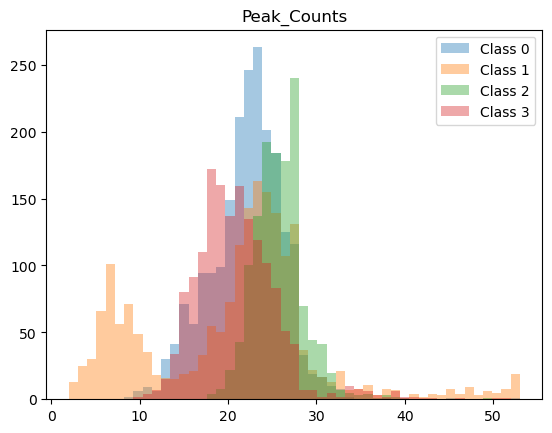

In [56]:
threshold = 0.8
EMG_DF['Peak_Counts'] = get_Feature(calculate_peak_count, 
                              'Peak_Counts', 
                              channel = 0, 
                              args = threshold)

In [57]:
###########################################
##########   NEW FEATURE
#####################################
#OUTLIERS
#Identifica cuantos valores atipicos en uan serie temporal utilizan Z. 

#threshold=5 gives good results because looks at points very far away

def find_outliers(time_series, threshold):
    # Calculate Z-scores for the time series data
    z_scores = zscore(time_series)

    # Identify indices of outliers based on the threshold
    outlier_indices = np.where(np.abs(z_scores) > threshold)[0]

    # Calculate the number of outliers
    num_outliers = len(outlier_indices)

    return num_outliers

Processing Class 0  	Samples: 2096
Processing Class 1  	Samples: 2096
Processing Class 2  	Samples: 1310
Processing Class 3  	Samples: 1572


Feature:	 Outliers_count 
 
		MIN =  0 	MAX =  5 
		MEAN =  0.22368797709923666 	STD =  0.5113269222260965 
		NaN =  0 	Infinite =  0

Class:	 0 
		MIN =  0 	MAX =  4 
		MEAN =  0.17461832061068702 	STD =  0.49717220138730017 
		NaN =  0 	Infinite =  0

Class:	 1 
		MIN =  0 	MAX =  5 
		MEAN =  0.32395038167938933 	STD =  0.8140692980118481 
		NaN =  0 	Infinite =  0

Class:	 2 
		MIN =  0 	MAX =  1 
		MEAN =  0.010687022900763359 	STD =  0.10282417246096326 
		NaN =  0 	Infinite =  0

Class:	 3 
		MIN =  0 	MAX =  3 
		MEAN =  0.38549618320610685 	STD =  0.6312420170442746 
		NaN =  0 	Infinite =  0


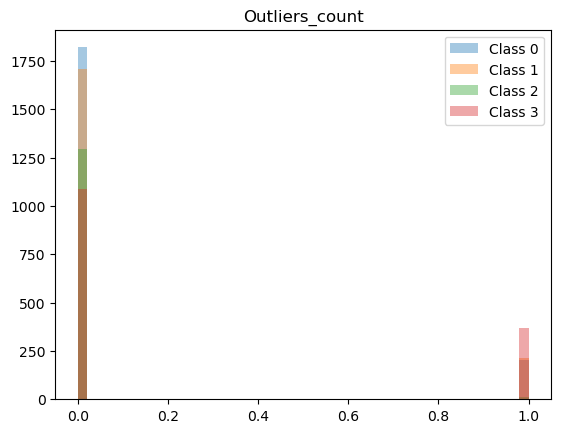

In [58]:
threshold = 5
EMG_DF['Outliers_count'] = get_Feature(find_outliers, 
                              'Outliers_count', 
                              channel = 0, 
                              args = threshold)

In [59]:
###########################################
##########   NEW FEATURE
#####################################
#ENVELOPE
#Calcula y analiza: calculo de la envolvente y caracteristicas(media y varianza) 
from scipy.signal import hilbert

#Inicializo listas para almacenar caracteristicas 
feature_mean_envelope_EMG = []
feature_var_envelope_EMG = []

for clase in range(clases):
    print('Processing Class',clase,' \tSamples:', len(EMG_Signals[clase]))
    histo = []
    for sample in EMG_Signals[clase]:
    #envolvente de la señal EMG
        analytical_signal_EMG = hilbert(sample)
        envelope_EMG = np.abs(analytical_signal_EMG)

     
        
        #MEDIA Y VARIANZA DE LA ENVOLVENTE
        mean_envelope_emg = np.mean(envelope_EMG)
        var_envelope_emg = np.var(envelope_EMG)
        
                   
        #AGREGAR A LA LISTA
        feature_mean_envelope_EMG.append(np.mean(envelope_EMG))
        feature_var_envelope_EMG.append(np.var(envelope_EMG))
        
#media de las desviaciones standard
print('\feature_var_envelope_EMG:\t\t Mean = ', np.mean(feature_var_envelope_EMG), '\tStd Desv. = ', np.std(feature_var_envelope_EMG))
print('\feature_var_envelope_EMG:\t\t Max = ', np.max(feature_var_envelope_EMG), '\t Min = ', np.min(feature_var_envelope_EMG))

#media de las desviaciones standard
print('\nfeature_mean_envelope_EMG:\t\t Mean = ', np.mean(feature_mean_envelope_EMG), '\tStd Desv. = ', np.std(feature_mean_envelope_EMG))
print('\nfeature_mean_envelope_EMG:\t\t Max = ', np.max(feature_mean_envelope_EMG), '\t Min = ', np.min(feature_mean_envelope_EMG))

"""
plt.hist(feature_var_envelope_EMG, label = 'EMG Envelope Var')
plt.xlabel('Envelope Variance')
plt.ylabel('Frequency')
plt.title('Histogram of EMG Envelope Variance')
plt.legend()
plt.show()



plt.hist(feature_mean_envelope_EMG, label = 'EMG Envelope Mean')
plt.xlabel('Envelope Mean')
plt.ylabel('Frequency')
plt.title('Histogram of EMG Envelope Mean') 
plt.legend()
plt.show()
"""
#Añadir los features al dataFrames        
EMG_DF['Envelope_Mean'] = feature_mean_envelope_EMG
EMG_DF['Envelope_Var'] = feature_var_envelope_EMG



Processing Class 0  	Samples: 2096
Processing Class 1  	Samples: 2096
Processing Class 2  	Samples: 1310
Processing Class 3  	Samples: 1572
eature_var_envelope_EMG:		 Mean =  0.8981539245369233 	Std Desv. =  0.12109890689687507
eature_var_envelope_EMG:		 Max =  1.711793737753733 	 Min =  0.3837658308895094

feature_mean_envelope_EMG:		 Mean =  1.0456668056518688 	Std Desv. =  0.06208868418946575

feature_mean_envelope_EMG:		 Max =  1.2712758567924924 	 Min =  0.5301207831126792


In [60]:
###########################################
##########   NEW FEATURE
#####################################
#NUMBER OF CUTS WITH X-AXIS

def countzeros(signal):
    signal2 = signal[1 : ]
    signal = signal[0 : -1] #Empiezo en 0, para que llegue hasta el final -1
    sign = signal * signal2 #multiplicar elemento a elemento
    sign = sign[sign<0]  #si es <0 me queod con los valores
    cruce_ceros = len(sign)
    
    return cruce_ceros


Processing Class 0  	Samples: 2096
Processing Class 1  	Samples: 2096
Processing Class 2  	Samples: 1310
Processing Class 3  	Samples: 1572


Feature:	 CutsX 
 
		MIN =  1.0 	MAX =  108.0 
		MEAN =  28.540418256997455 	STD =  11.546925210930938 
		NaN =  0 	Infinite =  0

Class:	 0 
		MIN =  20.0 	MAX =  85.0 
		MEAN =  29.47614503816794 	STD =  11.057509435232765 
		NaN =  0 	Infinite =  0

Class:	 1 
		MIN =  1.0 	MAX =  108.0 
		MEAN =  27.71517175572519 	STD =  21.02353458529392 
		NaN =  0 	Infinite =  0

Class:	 2 
		MIN =  21.0 	MAX =  38.0 
		MEAN =  23.581679389312978 	STD =  2.513590586723861 
		NaN =  0 	Infinite =  0

Class:	 3 
		MIN =  18.0 	MAX =  89.0 
		MEAN =  33.38867684478372 	STD =  11.593066236473213 
		NaN =  0 	Infinite =  0


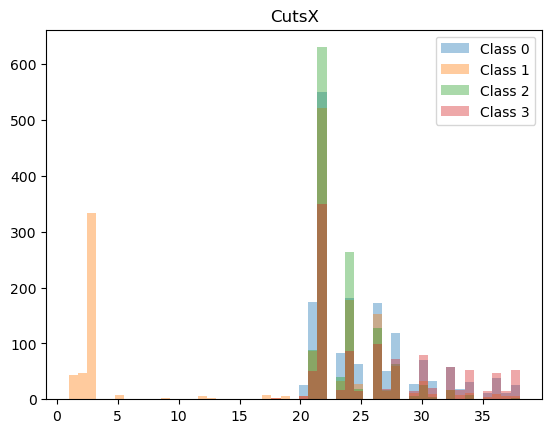

In [61]:
EMG_DF['CutsX'] = get_Feature(countzeros, 
                              'CutsX', 
                              channel = -1, 
                              args = None)

In [62]:
###########################################
##########   NEW FEATURE
#####################################
#TIME OF MUSCLE ACTIVITY
#Duracion total(segundos) en la que la señal EMG supera un umbral de activacion 

def calcular_tiempo_actividad_muscular(signal, fs):
    umbral = 1.25 * np.mean(EMG_Signals[clase][i])
    # Contar el número de muestras donde la señal supera el umbral
    muestras_activas = np.sum(signal > umbral)

    # Calcular la duración en segundos
    duracion_actividad = muestras_activas / fs  # fs es la frecuencia de muestreo

    return duracion_actividad


Processing Class 0  	Samples: 2096
Processing Class 1  	Samples: 2096
Processing Class 2  	Samples: 1310
Processing Class 3  	Samples: 1572


Feature:	 Time_ACt_Muscular 
 
		MIN =  0.017 	MAX =  0.067 
		MEAN =  0.029281424936386774 	STD =  0.00540933276631704 
		NaN =  0 	Infinite =  0

Class:	 0 
		MIN =  0.018 	MAX =  0.059 
		MEAN =  0.027938454198473288 	STD =  0.004578360391017687 
		NaN =  0 	Infinite =  0

Class:	 1 
		MIN =  0.017 	MAX =  0.054 
		MEAN =  0.03264933206106871 	STD =  0.009119731017341835 
		NaN =  0 	Infinite =  0

Class:	 2 
		MIN =  0.02 	MAX =  0.045 
		MEAN =  0.028284732824427485 	STD =  0.002832040595798514 
		NaN =  0 	Infinite =  0

Class:	 3 
		MIN =  0.017 	MAX =  0.067 
		MEAN =  0.028253180661577615 	STD =  0.005107199061110125 
		NaN =  0 	Infinite =  0


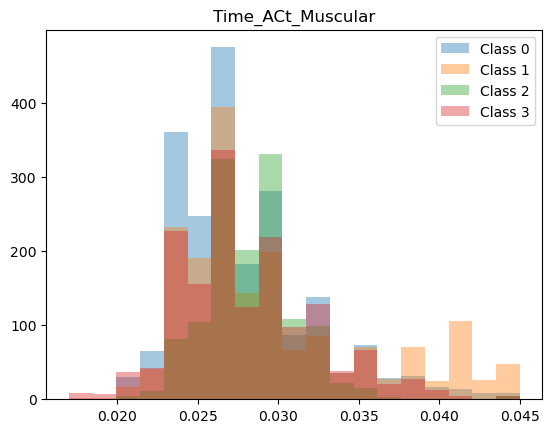

In [63]:
EMG_DF['Time_ACt_Muscular'] = get_Feature(calcular_tiempo_actividad_muscular, 
                              'Time_ACt_Muscular', 
                              channel = 0, 
                              args = SAMPLE_FREQUENCY, BINS = 20)

In [64]:
##########################
######## NEW FEATURE
##########################
#Absolute value of the maximum value
#Valor Absoluto Medio que es una medida de la magnitud promedio de la señal

def calculate_mean_absolute_value(signal):
    # Calcula el valor absoluto de cada punto en la señal
    abs_values = np.abs(signal)
    
    # Calcula el promedio de los valores absolutos
    mav = np.mean(abs_values)
    
    return mav


Processing Class 0  	Samples: 2096
Processing Class 1  	Samples: 2096
Processing Class 2  	Samples: 1310
Processing Class 3  	Samples: 1572


Feature:	 Mean_Abs_Max_Values 
 
		MIN =  0.24713254016179959 	MAX =  0.8382273833144488 
		MEAN =  0.6485069683367498 	STD =  0.051082359358444046 
		NaN =  0 	Infinite =  0

Class:	 0 
		MIN =  0.5049991200228418 	MAX =  0.817864628362008 
		MEAN =  0.6441598616921844 	STD =  0.037890022643706 
		NaN =  0 	Infinite =  0

Class:	 1 
		MIN =  0.24713254016179959 	MAX =  0.8382273833144488 
		MEAN =  0.6418329545734875 	STD =  0.11133872148601287 
		NaN =  0 	Infinite =  0

Class:	 2 
		MIN =  0.5990362155431005 	MAX =  0.819200266428153 
		MEAN =  0.686671811535411 	STD =  0.019712305610554284 
		NaN =  0 	Infinite =  0

Class:	 3 
		MIN =  0.4824248203760242 	MAX =  0.7593595611532371 
		MEAN =  0.6213632455459163 	STD =  0.03538838769350302 
		NaN =  0 	Infinite =  0


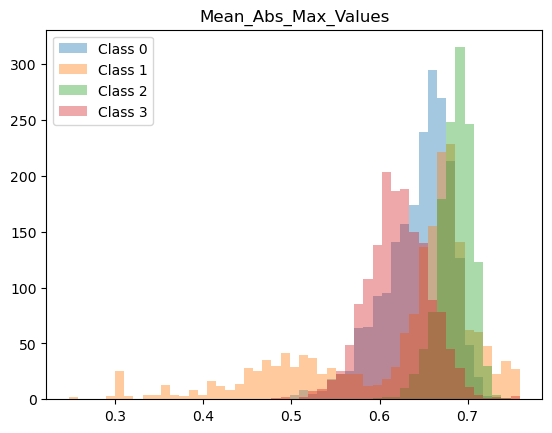

In [65]:
EMG_DF['Mean_Abs_Max_Values'] = get_Feature(calculate_mean_absolute_value, 
                              'Mean_Abs_Max_Values', 
                              channel = -1, 
                              args = None)

In [66]:
##########################
######## NEW FEATURE
##########################
#Wavelength
#Calcula la longitud de onda(variaciones en la señal)
def wavelength(signal):
    return np.sum(np.abs(np.diff(signal)), axis=0)


Processing Class 0  	Samples: 2096
Processing Class 1  	Samples: 2096
Processing Class 2  	Samples: 1310
Processing Class 3  	Samples: 1572


Feature:	 wavelength 
 
		MIN =  5.771534708180158 	MAX =  155.27497323171843 
		MEAN =  93.37616589619262 	STD =  15.955460592538328 
		NaN =  0 	Infinite =  0

Class:	 0 
		MIN =  70.29026336706262 	MAX =  140.63774160823894 
		MEAN =  98.54368232098591 	STD =  9.955281422199029 
		NaN =  0 	Infinite =  0

Class:	 1 
		MIN =  5.771534708180158 	MAX =  155.27497323171843 
		MEAN =  77.13843076870914 	STD =  37.613633111903134 
		NaN =  0 	Infinite =  0

Class:	 2 
		MIN =  78.66883578093571 	MAX =  112.48410916236901 
		MEAN =  96.59426560476734 	STD =  5.06104866015159 
		NaN =  0 	Infinite =  0

Class:	 3 
		MIN =  71.46157734539065 	MAX =  145.24187604629634 
		MEAN =  101.22828489030806 	STD =  11.19187917589956 
		NaN =  0 	Infinite =  0


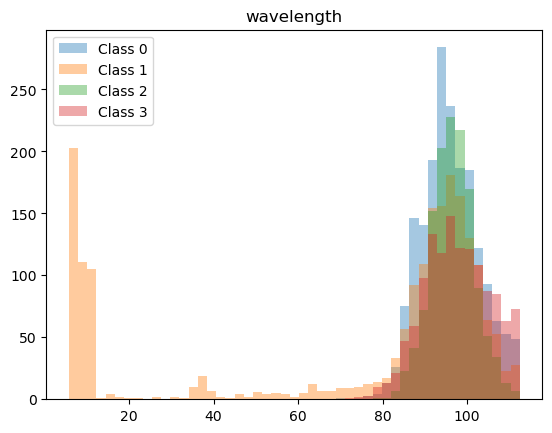

In [67]:
EMG_DF['wavelength'] = get_Feature(wavelength, 
                              'wavelength', 
                              channel = 0, 
                              args = None)

In [68]:
##########################
######## NEW FEATURE
##########################
#Skewness
#Calcula la asimetría de una señal. Es decir la desviacion respecto a una distribucion simetrica. 

def skewness(signal):
    return skew(signal,axis=0)


Processing Class 0  	Samples: 2096
Processing Class 1  	Samples: 2096
Processing Class 2  	Samples: 1310
Processing Class 3  	Samples: 1572


Feature:	 skewness 
 
		MIN =  0.8370899164256058 	MAX =  11.283702038608128 
		MEAN =  2.57688772900679 	STD =  0.5985224284702245 
		NaN =  0 	Infinite =  0

Class:	 0 
		MIN =  1.1977571455603864 	MAX =  4.2004676244993595 
		MEAN =  2.5561612909469096 	STD =  0.3415665639099221 
		NaN =  0 	Infinite =  0

Class:	 1 
		MIN =  0.8370899164256058 	MAX =  11.283702038608128 
		MEAN =  2.7611863950701343 	STD =  1.517520511670612 
		NaN =  0 	Infinite =  0

Class:	 2 
		MIN =  1.2270175200005318 	MAX =  2.9422235989428733 
		MEAN =  2.2276949740108094 	STD =  0.1602772273088637 
		NaN =  0 	Infinite =  0

Class:	 3 
		MIN =  1.1938549031977497 	MAX =  4.180495474346511 
		MEAN =  2.7625082559993084 	STD =  0.3747254109915002 
		NaN =  0 	Infinite =  0


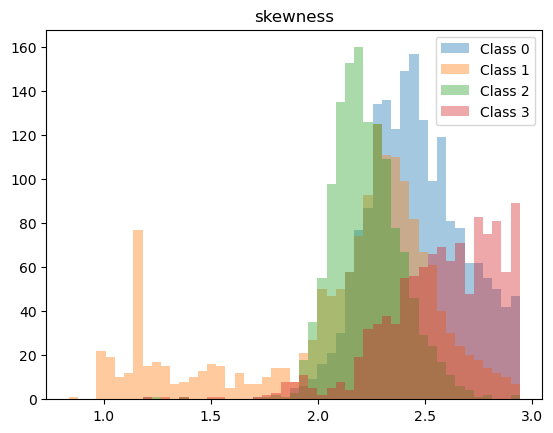

In [69]:
EMG_DF['skewness'] = get_Feature(skewness, 
                              'skewness', 
                              channel = 0, 
                              args = None)

In [70]:
##########################
######## NEW FEATURE
##########################
#KURTOSIS
#Describe la forma de la distribucion de una variable aleatoria (altitud y anchura de la distribucion)
#en comparacion con la distribucion normal.

def kurt(signal):
    return kurtosis(signal)



Processing Class 0  	Samples: 2096
Processing Class 1  	Samples: 2096
Processing Class 2  	Samples: 1310
Processing Class 3  	Samples: 1572


Feature:	 kurtosis 
 
		MIN =  -0.5216017362949388 	MAX =  130.9577176282916 
		MEAN =  6.9520464063045075 	STD =  5.903274079444838 
		NaN =  0 	Infinite =  0

Class:	 0 
		MIN =  0.10555846028657134 	MAX =  22.805836313850715 
		MEAN =  6.236731636717754 	STD =  2.547973421539973 
		NaN =  0 	Infinite =  0

Class:	 1 
		MIN =  -0.5216017362949388 	MAX =  130.9577176282916 
		MEAN =  9.62421126809549 	STD =  17.2272637806372 
		NaN =  0 	Infinite =  0

Class:	 2 
		MIN =  0.14541814046217638 	MAX =  8.483605455147078 
		MEAN =  4.175343673096916 	STD =  0.9224377022445205 
		NaN =  0 	Infinite =  0

Class:	 3 
		MIN =  1.0870194469916186 	MAX =  22.19908160237406 
		MEAN =  7.771899047307872 	STD =  2.9154214133576613 
		NaN =  0 	Infinite =  0


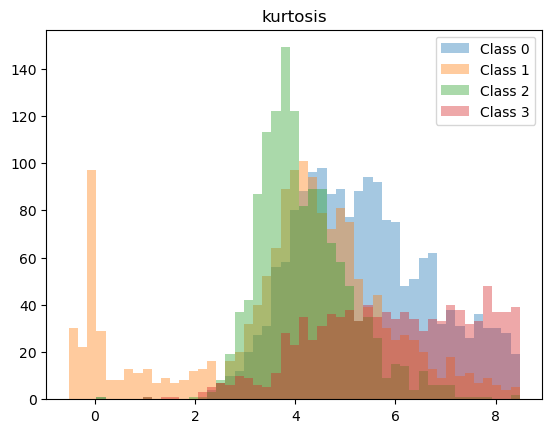

In [71]:
EMG_DF['kurtosis'] = get_Feature(kurt, 
                              'kurtosis', 
                              channel = 0, 
                              args = None)

In [72]:
##########################
######## NEW FEATURE
##########################
#ROOT MEAN SQUARE
#Valor cuadratico medio: util en añalisis de señales y procesamiento de lso datos

def rms(signal):
    return np.sqrt(np.mean(signal**2, axis=0))


Processing Class 0  	Samples: 2096
Processing Class 1  	Samples: 2096
Processing Class 2  	Samples: 1310
Processing Class 3  	Samples: 1572


Feature:	 rms 
 
		MIN =  0.9999999999999996 	MAX =  1.0000000000000002 
		MEAN =  1.0 	STD =  1.0330361125731256e-16 
		NaN =  0 	Infinite =  0

Class:	 0 
		MIN =  0.9999999999999997 	MAX =  1.0000000000000002 
		MEAN =  1.0 	STD =  1.0095175468718519e-16 
		NaN =  0 	Infinite =  0

Class:	 1 
		MIN =  0.9999999999999996 	MAX =  1.0000000000000002 
		MEAN =  1.0 	STD =  1.001622574484742e-16 
		NaN =  0 	Infinite =  0

Class:	 2 
		MIN =  0.9999999999999996 	MAX =  1.0000000000000002 
		MEAN =  1.0 	STD =  1.0792819260889911e-16 
		NaN =  0 	Infinite =  0

Class:	 3 
		MIN =  0.9999999999999997 	MAX =  1.0000000000000002 
		MEAN =  1.0 	STD =  1.0417224028469168e-16 
		NaN =  0 	Infinite =  0


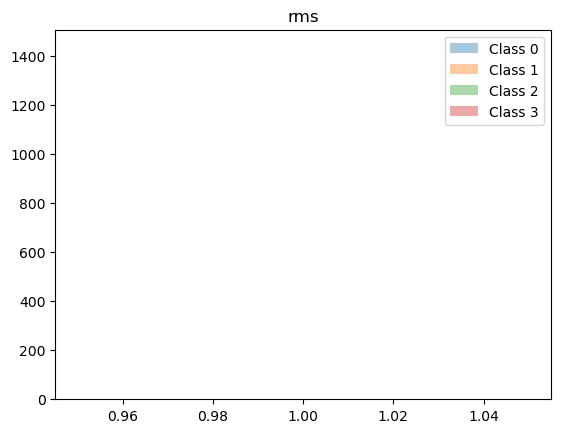

In [73]:
EMG_DF['rms'] = get_Feature(rms, 
                              'rms', 
                              channel = 0, 
                              args = None)

In [74]:
##########################
######## NEW FEATURE
##########################
#SUM OF SQUARES INTEGRAL 
#Suma de los cuadrados de la señal, mide la energia total de una señal 
def SSI(signal): 
    return np.sum(signal**2,axis=0)

Processing Class 0  	Samples: 2096
Processing Class 1  	Samples: 2096
Processing Class 2  	Samples: 1310
Processing Class 3  	Samples: 1572


Feature:	 SSI 
 
		MIN =  149.9999999999999 	MAX =  150.0000000000001 
		MEAN =  150.0 	STD =  2.873510414711563e-14 
		NaN =  0 	Infinite =  0

Class:	 0 
		MIN =  149.99999999999991 	MAX =  150.0000000000001 
		MEAN =  150.0 	STD =  2.7977539506295412e-14 
		NaN =  0 	Infinite =  0

Class:	 1 
		MIN =  149.9999999999999 	MAX =  150.0000000000001 
		MEAN =  150.0 	STD =  2.8231231491205096e-14 
		NaN =  0 	Infinite =  0

Class:	 2 
		MIN =  149.9999999999999 	MAX =  150.00000000000009 
		MEAN =  150.0 	STD =  2.9622178685054866e-14 
		NaN =  0 	Infinite =  0

Class:	 3 
		MIN =  149.99999999999991 	MAX =  150.00000000000009 
		MEAN =  150.0 	STD =  2.9109466905907154e-14 
		NaN =  0 	Infinite =  0


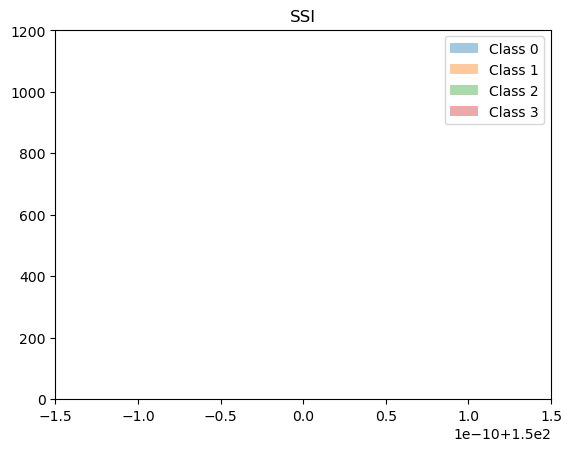

In [75]:
EMG_DF['SSI'] = get_Feature(SSI, 
                              'SSI', 
                              channel = 0, 
                              args = None)

In [76]:
##########################
######## NEW FEATURE
##########################
#DIFERENCIA DEL VALOR ABSOLUTO DE LAS SEÑALES
#Mide la variacion total en una señal, sumando las diferencias absolutas entre valores consecutivos
def abs_diffs_signal(signal):
    return np.sum(np.abs(np.diff(signal,axis=0)), axis=0)

Processing Class 0  	Samples: 2096
Processing Class 1  	Samples: 2096
Processing Class 2  	Samples: 1310
Processing Class 3  	Samples: 1572


Feature:	 abs_diffs_sum 
 
		MIN =  5.771534708180158 	MAX =  155.27497323171843 
		MEAN =  93.37616589619262 	STD =  15.955460592538328 
		NaN =  0 	Infinite =  0

Class:	 0 
		MIN =  70.29026336706262 	MAX =  140.63774160823894 
		MEAN =  98.54368232098591 	STD =  9.955281422199029 
		NaN =  0 	Infinite =  0

Class:	 1 
		MIN =  5.771534708180158 	MAX =  155.27497323171843 
		MEAN =  77.13843076870914 	STD =  37.613633111903134 
		NaN =  0 	Infinite =  0

Class:	 2 
		MIN =  78.66883578093571 	MAX =  112.48410916236901 
		MEAN =  96.59426560476734 	STD =  5.06104866015159 
		NaN =  0 	Infinite =  0

Class:	 3 
		MIN =  71.46157734539065 	MAX =  145.24187604629634 
		MEAN =  101.22828489030806 	STD =  11.19187917589956 
		NaN =  0 	Infinite =  0


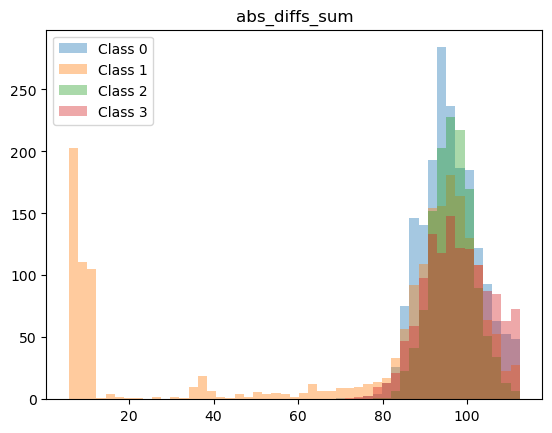

In [77]:
EMG_DF['abs_diffs_sum'] = get_Feature(abs_diffs_signal, 
                              'abs_diffs_sum', 
                              channel = 0, 
                              args = None)

In [78]:
##########################
######## NEW FEATURE
##########################
# onsets of EMG pulses.: Detectar los inicios de pulsos EMG en unna señal. 
def onset_EMG_Pulse(signal, fs):
    feature = bs.signals.emg.find_onsets(signal, size = 0.15,sampling_rate = fs, show = False)
    print(feature)
    return  1
#for i in range (100):
#    onset_EMG_Pulse(EMG_Signals[2][i][4], 1000)

In [79]:
"""
EMG_DF['onset_EMG'] = onset_EMG_Pulse(abs_diffs_signal, 
                              'abs_diffs_sum', 
                              channel = -1, 
                              args = SAMPLE_FREQUENCY)
"""

"\nEMG_DF['onset_EMG'] = onset_EMG_Pulse(abs_diffs_signal, \n                              'abs_diffs_sum', \n                              channel = -1, \n                              args = SAMPLE_FREQUENCY)\n"

<span style="color:#1B3B6F; font-size:30px;"> FEATURES QUE NO FUNCIONAN/DAN VALORES INF </span>


In [80]:
result = EMG_DF 
result = result.drop('Energy', axis=1)
result = result.drop('SSI', axis=1)
result = result.drop('rms', axis=1)
result

,mean,median,min,max,max_amp,var,std_dev,abs_dev,Class,Power_Ratio,...,Outliers_count,Envelope_Mean,Envelope_Var,CutsX,Time_ACt_Muscular,Mean_Abs_Max_Values,wavelength,skewness,kurtosis,abs_diffs_sum
0,2.368476e-17,-0.348695,-0.640952,4.424663,4.424663,1.006711,1.00335,0.465948,0,0.077265,...,0,0.981754,1.032467,47.0,0.032,0.585257,89.938217,3.034780,8.889524,89.938217
0,1.657933e-16,-0.361878,-0.689400,5.711982,5.711982,1.006711,1.00335,0.497758,0,0.069308,...,1,0.984225,1.031133,50.0,0.039,0.583351,88.390951,3.311346,11.976969,88.390951
0,-9.473903e-17,-0.266359,-0.745451,4.908950,4.908950,1.006711,1.00335,0.527766,0,0.078132,...,0,1.016629,0.966420,52.0,0.038,0.594962,97.073041,2.954562,9.094209,97.073041
0,-1.776357e-16,-0.272044,-0.794881,4.538395,4.538395,1.006711,1.00335,0.527162,0,0.090042,...,0,1.019936,0.959552,44.0,0.037,0.601100,111.271602,2.773657,7.792497,111.271602
0,-3.552714e-17,-0.281565,-0.805174,4.670309,4.670309,1.006711,1.00335,0.523832,0,0.089369,...,0,1.006819,0.974809,47.0,0.039,0.596566,106.707610,2.897121,8.691547,106.707610
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,-5.625130e-17,-0.318403,-0.835293,4.388412,4.388412,1.006711,1.00335,0.490579,3,0.114890,...,0,1.018381,0.947591,31.0,0.026,0.617317,96.825757,2.857430,8.382643,96.825757
0,8.881784e-17,-0.337060,-0.721710,4.418471,4.418471,1.006711,1.00335,0.475108,3,0.118050,...,0,1.007057,0.976705,25.0,0.024,0.621331,91.844219,2.935351,8.840727,91.844219
0,1.095420e-16,-0.346806,-0.731693,4.684402,4.684402,1.006711,1.00335,0.457204,3,0.118725,...,0,1.008581,0.979385,26.0,0.024,0.626849,85.460232,2.993155,9.544369,85.460232
0,1.776357e-17,-0.327068,-0.725476,5.025648,5.025648,1.006711,1.00335,0.456248,3,0.116737,...,1,1.013020,0.969220,22.0,0.021,0.622853,90.756087,3.024965,10.152310,90.756087


<span style="color:#1B3B6F; font-size:30px;"> DataFrame de features que SÍ funcionan(34 features) </span>


In [81]:
result.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7074 entries, 0 to 0
Data columns (total 35 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   mean                         7074 non-null   float64
 1   median                       7074 non-null   float64
 2   min                          7074 non-null   float64
 3   max                          7074 non-null   float64
 4   max_amp                      7074 non-null   float64
 5   var                          7074 non-null   float64
 6   std_dev                      7074 non-null   float64
 7   abs_dev                      7074 non-null   float64
 8   Class                        7074 non-null   int64  
 9   Power_Ratio                  7074 non-null   float64
 10  Frec_Fundamental             7074 non-null   float64
 11  Frec_Dominante               7074 non-null   float64
 12  Frec_Mean                    7074 non-null   float64
 13  Entropy              

In [82]:
result

,mean,median,min,max,max_amp,var,std_dev,abs_dev,Class,Power_Ratio,...,Outliers_count,Envelope_Mean,Envelope_Var,CutsX,Time_ACt_Muscular,Mean_Abs_Max_Values,wavelength,skewness,kurtosis,abs_diffs_sum
0,2.368476e-17,-0.348695,-0.640952,4.424663,4.424663,1.006711,1.00335,0.465948,0,0.077265,...,0,0.981754,1.032467,47.0,0.032,0.585257,89.938217,3.034780,8.889524,89.938217
0,1.657933e-16,-0.361878,-0.689400,5.711982,5.711982,1.006711,1.00335,0.497758,0,0.069308,...,1,0.984225,1.031133,50.0,0.039,0.583351,88.390951,3.311346,11.976969,88.390951
0,-9.473903e-17,-0.266359,-0.745451,4.908950,4.908950,1.006711,1.00335,0.527766,0,0.078132,...,0,1.016629,0.966420,52.0,0.038,0.594962,97.073041,2.954562,9.094209,97.073041
0,-1.776357e-16,-0.272044,-0.794881,4.538395,4.538395,1.006711,1.00335,0.527162,0,0.090042,...,0,1.019936,0.959552,44.0,0.037,0.601100,111.271602,2.773657,7.792497,111.271602
0,-3.552714e-17,-0.281565,-0.805174,4.670309,4.670309,1.006711,1.00335,0.523832,0,0.089369,...,0,1.006819,0.974809,47.0,0.039,0.596566,106.707610,2.897121,8.691547,106.707610
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,-5.625130e-17,-0.318403,-0.835293,4.388412,4.388412,1.006711,1.00335,0.490579,3,0.114890,...,0,1.018381,0.947591,31.0,0.026,0.617317,96.825757,2.857430,8.382643,96.825757
0,8.881784e-17,-0.337060,-0.721710,4.418471,4.418471,1.006711,1.00335,0.475108,3,0.118050,...,0,1.007057,0.976705,25.0,0.024,0.621331,91.844219,2.935351,8.840727,91.844219
0,1.095420e-16,-0.346806,-0.731693,4.684402,4.684402,1.006711,1.00335,0.457204,3,0.118725,...,0,1.008581,0.979385,26.0,0.024,0.626849,85.460232,2.993155,9.544369,85.460232
0,1.776357e-17,-0.327068,-0.725476,5.025648,5.025648,1.006711,1.00335,0.456248,3,0.116737,...,1,1.013020,0.969220,22.0,0.021,0.622853,90.756087,3.024965,10.152310,90.756087


<span style="color:#1B3B6F; font-size:30px;"> COMPRUEBA SI HAY VALORES NaN O INFINITO </span>


In [83]:

#result = EMG_DF 
#result = result[['mean', 'median', 'min', 'Power_Ratio','Cresta_Factor', 'skewness', 'kurtosis', 'SSI', 'Mean_Abs_Max_Values', 
#                 'wavelength','Time_ACt_Muscular','Class']]
print('NaN Values:\n-----------------------\n',result.isna().sum())
print('\nInfinite Values:\n-----------------------\n',np.isinf(result).sum())

#result = result.fillna(0)


NaN Values:
-----------------------
 mean                           0
median                         0
min                            0
max                            0
max_amp                        0
var                            0
std_dev                        0
abs_dev                        0
Class                          0
Power_Ratio                    0
Frec_Fundamental               0
Frec_Dominante                 0
Frec_Mean                      0
Entropy                        0
Entropy_Shannon                0
Cresta_Factor                  0
Peak_Height_Autocorrelation    0
STD_Autocorrelacion            0
Correlacion_Pearson            0
Coeficiente_Variacion          0
Dom_Frequency                  0
Abs_Dom_Frequency              0
At_Zero_Frequency              0
Peak_Density                   0
Peak_Counts                    0
Outliers_count                 0
Envelope_Mean                  0
Envelope_Var                   0
CutsX                          0
Time_A

## <span style="color:#3390FF;"> 3.3. Train-Test Split And Class Imbalance </span>

Now, we need to do a train-test split. It is needed to use part of our dataset to train the model, and leave a small percentage out to test it.
All  categories have same number of samples which means that is balanced and we do not need to apply techniques to resample the data, such as StratifiedShuffleSplit.


In [84]:
# Assuming result is a dataframe that you've loaded
X = result.drop('Class', axis=1)
y = result['Class']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Escalar las características
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

"""
# Entrenar el modelo
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

# Realizar predicciones
y_pred = clf.predict(X_test)

# Evaluar el modelo
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')

print('Classification Report:')
print(classification_report(y_test, y_pred))

print('Confusion Matrix:')
print(confusion_matrix(y_test, y_pred))
"""

"\n# Entrenar el modelo\nclf = RandomForestClassifier(n_estimators=100, random_state=42)\nclf.fit(X_train, y_train)\n\n# Realizar predicciones\ny_pred = clf.predict(X_test)\n\n# Evaluar el modelo\naccuracy = accuracy_score(y_test, y_pred)\nprint(f'Accuracy: {accuracy:.2f}')\n\nprint('Classification Report:')\nprint(classification_report(y_test, y_pred))\n\nprint('Confusion Matrix:')\nprint(confusion_matrix(y_test, y_pred))\n"

In [85]:
X_train_df = pd.DataFrame(X_train, columns = X.columns)
y_train_df = pd.DataFrame(y_train)
X_test_df = pd.DataFrame(X_test, columns = X.columns)
y_test_df = pd.DataFrame(y_test)
#resampled_df = pd.concat([X_resampled_df, y_train], axis=1)

# <span style="color:#1C7293;"> 4. Feature Selection </span>

Now, we need to select the best features. For this purpose, employ feature selection methods such as ANOVA, mutual information, Recursive Feature Elimination, and more to determine which features are created (or were created using biosppy) and are most significant.


<span style="color:#1B3B6F; font-size:30px;"> RFE (LOWER SCORE IS BETTER) </span>


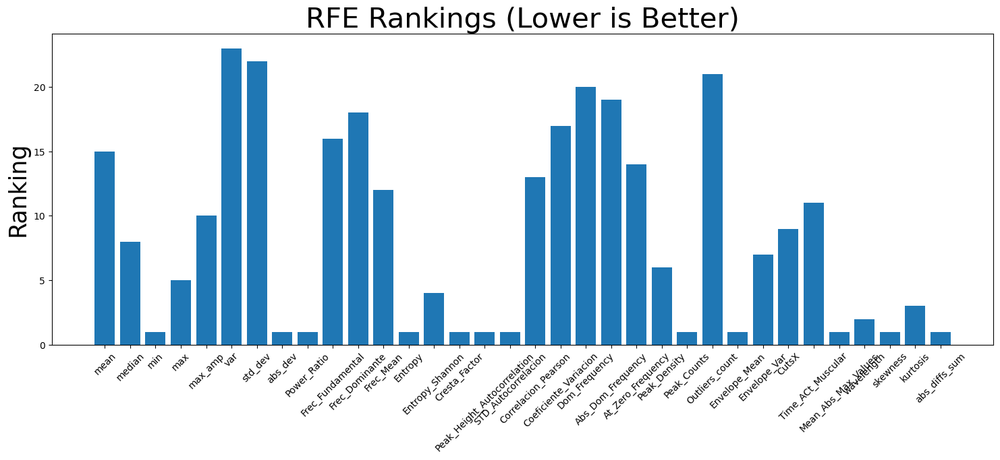

In [86]:
n_features_to_select=12

estimator = RandomForestClassifier()
selector = RFE(estimator, n_features_to_select=n_features_to_select, step=1)
selector = selector.fit(X_train_df, y_train)

plt.figure(figsize=(18, 6))
plt.bar(X_train_df.columns, selector.ranking_)
plt.title('RFE Rankings (Lower is Better)', fontsize = 30)
plt.xticks(rotation=45, fontsize = 10)
plt.ylabel('Ranking', fontsize = 25)
plt.show()

selected_columns = X_train_df.columns[selector.get_support()]
features_rfe = X_train_df[selected_columns.tolist()]


In [87]:
features_rfe

,min,abs_dev,Power_Ratio,Entropy,Cresta_Factor,Peak_Height_Autocorrelation,STD_Autocorrelacion,Peak_Counts,Envelope_Mean,Mean_Abs_Max_Values,skewness,abs_diffs_sum
0,-0.199799,0.614288,0.587364,0.156367,-0.387083,0.657353,0.334646,-0.114949,0.645345,0.870342,-0.698179,0.099549
1,-2.047886,0.198416,0.106074,1.482362,-0.036218,0.402608,0.120042,0.335924,-0.032913,0.355079,-0.299874,0.196450
2,-0.036790,0.027823,0.714999,0.126956,-0.859640,0.889703,0.530928,-0.340385,0.422116,0.676833,-0.449239,-0.019104
3,0.831098,-0.684529,-1.424675,-0.485237,0.159267,-2.027300,-1.328658,-0.903976,-1.024438,-1.287346,0.665684,0.664787
4,-0.784194,-0.067844,0.189724,0.879568,0.025892,1.135096,0.293206,-0.227667,0.584922,0.238753,-0.069308,0.289092
...,...,...,...,...,...,...,...,...,...,...,...,...
5654,-0.671584,0.036370,0.898289,0.689260,-0.639617,0.555111,0.405577,0.561360,0.612707,0.659535,-0.405932,0.174963
5655,-2.130605,0.420155,0.256814,1.478524,-0.153522,0.637681,0.166387,0.335924,0.195088,0.632644,-0.509299,0.297625
5656,-0.682811,0.856143,0.578413,0.555470,-0.524438,0.318455,0.162376,1.012233,0.614542,0.947511,-0.694031,0.324609
5657,-0.599245,0.357478,0.512209,0.583454,-0.354063,0.918457,0.399635,0.674078,0.334932,0.663900,-0.460439,0.220923


<span style="color:#1B3B6F; font-size:30px;"> LASSO (HIGHER SCORE BETTER THE FEATURE) </span>

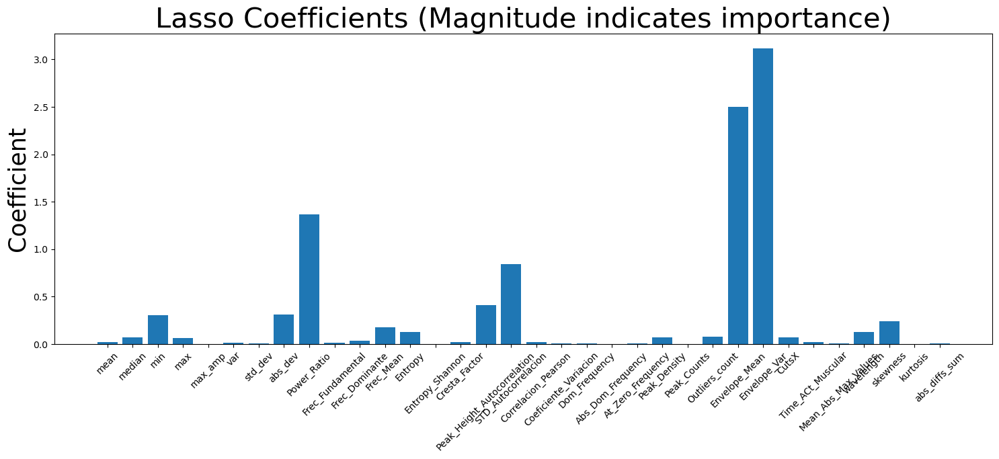

In [88]:
##########################
#OTRO MÉTODO PARA SELECCIONAR FEATURES 
######################

# Scaling features is crucial when using regularization
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train_df)

# Increase max_iter to a larger value, say 10,000
# lasso = LassoCV(cv=7, max_iter=50000000)
lasso = LassoCV(cv=5, max_iter=10000)

lasso.fit(X_scaled, y_train)

plt.figure(figsize=(18, 6))
plt.bar(X_train_df.columns, np.abs(lasso.coef_))
plt.title('Lasso Coefficients (Magnitude indicates importance)', fontsize =30 )
plt.xticks(rotation=45)
plt.ylabel('Coefficient', fontsize = 25)
plt.show()

# Features selected by Lasso
selected_columns = X_train_df.columns[np.abs(lasso.coef_) > 0.1]
features_lasso = X_train_df[selected_columns.tolist()]

In [89]:
features_lasso

,min,abs_dev,Power_Ratio,Frec_Mean,Entropy,Peak_Height_Autocorrelation,STD_Autocorrelacion,Envelope_Mean,Envelope_Var,wavelength,skewness
0,-0.199799,0.614288,0.587364,0.437649,0.156367,0.657353,0.334646,0.645345,-0.639294,0.099549,-0.698179
1,-2.047886,0.198416,0.106074,0.873051,1.482362,0.402608,0.120042,-0.032913,0.102551,0.196450,-0.299874
2,-0.036790,0.027823,0.714999,1.214493,0.126956,0.889703,0.530928,0.422116,-0.387118,-0.019104,-0.449239
3,0.831098,-0.684529,-1.424675,0.548647,-0.485237,-2.027300,-1.328658,-1.024438,1.119296,0.664787,0.665684
4,-0.784194,-0.067844,0.189724,0.219371,0.879568,1.135096,0.293206,0.584922,-0.580413,0.289092,-0.069308
...,...,...,...,...,...,...,...,...,...,...,...
5654,-0.671584,0.036370,0.898289,-0.974556,0.689260,0.555111,0.405577,0.612707,-0.645343,0.174963,-0.405932
5655,-2.130605,0.420155,0.256814,-0.451321,1.478524,0.637681,0.166387,0.195088,-0.173996,0.297625,-0.509299
5656,-0.682811,0.856143,0.578413,-0.951900,0.555470,0.318455,0.162376,0.614542,-0.670077,0.324609,-0.694031
5657,-0.599245,0.357478,0.512209,-1.957062,0.583454,0.918457,0.399635,0.334932,-0.383533,0.220923,-0.460439


<span style="color:#1B3B6F; font-size:30px;"> CORRELATION MATRIX </span>

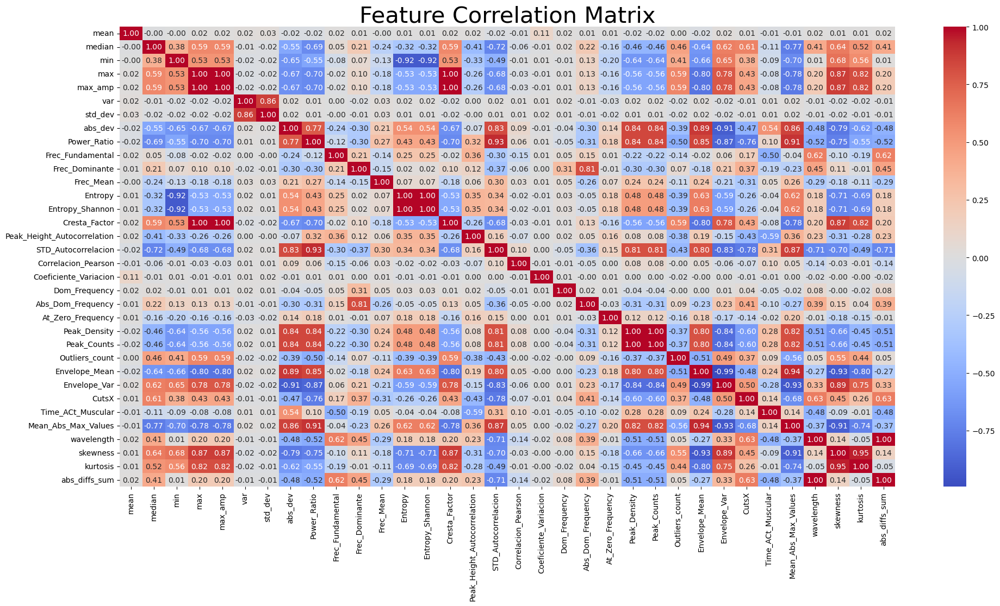

In [90]:
# Remove correlated features and plot a correlation matrix
corr_matrix = X_train_df.corr()
plt.figure(figsize=(23, 11))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Feature Correlation Matrix', fontsize = 30)
plt.show()

"""
To change the number of features selected, change the variable "correlation_threshold":
Initially --> correlation_threshold=0.95
"""
correlation_threshold=0.75

correlation_matrix = X_train_df.corr().abs()

# Select upper triangle of correlation matrix
upper = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))

# Find pairs of features with correlation greater than "correlation_threshold"
to_drop = []
for column in upper.columns:
    for idx, val in enumerate(upper[column]):
        if val > correlation_threshold:
            if column not in to_drop and upper.index[idx] not in to_drop:
                to_drop.append(column)

# Drop features
features_corr = X_train_df.drop(columns=to_drop)

<span style="color:#1B3B6F; font-size:30px;"> SMALL SUBSET OF THE CORRELATION MATRIX </span>

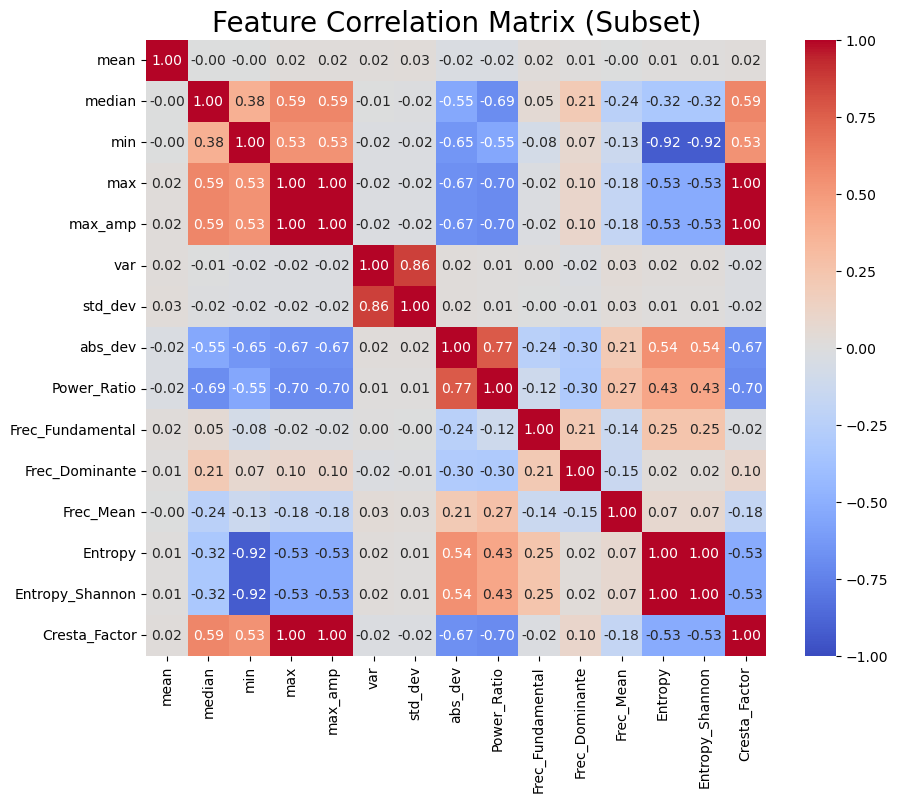

In [91]:
# Example feature selection for a smaller subset
selected_features = ['mean', 'median', 'min', 'max', 'max_amp', 'var', 'std_dev', 'abs_dev', 'Power_Ratio', 'Frec_Fundamental', 'Frec_Dominante', 'Frec_Mean', 'Entropy', 'Entropy_Shannon', 'Cresta_Factor', ]  # Replace with your feature names

# Compute correlation matrix for the selected features
corr_matrix = X_train_df[selected_features].corr()

# Plot the correlation matrix for the selected features
plt.figure(figsize=(10, 8))  # Adjust the figure size as needed
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1)
plt.title('Feature Correlation Matrix (Subset)', fontsize=20)
plt.show()


In [92]:
features_corr

,mean,median,min,max,var,abs_dev,Frec_Fundamental,Frec_Dominante,Frec_Mean,Peak_Height_Autocorrelation,Correlacion_Pearson,Coeficiente_Variacion,Dom_Frequency,At_Zero_Frequency,Outliers_count,CutsX,Time_ACt_Muscular,wavelength
0,1.118017,-0.707917,-0.199799,-0.387083,0.000000e+00,0.614288,0.553655,0.05738,0.437649,0.657353,-0.823632,0.112669,0.558000,0.813187,-0.3808,-0.531949,-0.376817,0.099549
1,-2.384376,0.157538,-2.047886,-0.036218,6.661338e-16,0.198416,0.553655,0.05738,0.873051,0.402608,0.179033,-0.031590,0.558000,2.703488,-0.3808,-0.462456,-0.070371,0.196450
2,-0.863958,-1.119647,-0.036790,-0.859640,2.220446e-16,0.027823,-0.571958,0.05738,1.214493,0.889703,-0.769166,-0.111828,0.558000,0.021899,-0.3808,-0.323470,0.082853,-0.019104
3,0.575010,1.777964,0.831098,0.159267,2.220446e-16,-0.684529,0.553655,0.05738,0.548647,-2.027300,0.373811,0.206392,0.558000,-0.637509,-0.3808,0.718926,-0.530040,0.664787
4,0.219086,-0.506902,-0.784194,0.025892,-2.220446e-16,-0.067844,0.553655,0.05738,0.219371,1.135096,-0.554874,0.525598,0.558000,-0.868301,-0.3808,-0.323470,-0.070371,0.289092
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5654,0.140605,-0.790911,-0.671584,-0.639617,2.220446e-16,0.036370,0.553655,0.05738,-0.974556,0.555111,-0.180753,0.821216,0.558000,-1.077113,-0.3808,-0.462456,-0.223594,0.174963
5655,-2.845932,-0.073584,-2.130605,-0.153522,2.220446e-16,0.420155,0.553655,0.05738,-0.451321,0.637681,-0.796129,-0.024167,0.558000,3.340915,-0.3808,-0.323470,-0.070371,0.297625
5656,0.235631,-0.830023,-0.682811,-0.524438,4.440892e-16,0.856143,0.553655,0.05738,-0.951900,0.318455,-0.883080,0.488940,-1.228731,-0.791370,-0.3808,-0.184484,0.389299,0.324609
5657,0.982265,-0.446859,-0.599245,-0.354063,0.000000e+00,0.357478,-1.492913,0.05738,-1.957062,0.918457,-0.798861,0.126337,0.558000,0.769227,-0.3808,-0.531949,-0.223594,0.220923


In [93]:
#todos los features que tenemos
#print(X_train_df.info())
#features que clasifica como buenos para el rfe
#print(features_rfe.info())

In [94]:
def seleccionar_rfe(n):

    estimator = RandomForestClassifier(),
    selector = RFE(estimator, n_features_to_select=n, step=1)
    selector = selector.fit(X_train_df, y_train)

    selected_columns = X_train_df.columns[selector.get_support()]
    features_rfe = X_train_df[selected_columns.tolist()]

    return features_rfe

#en vez de RFE podria probar otro como k-neighbor

In [95]:
"""
To change the number of folds, change the variable "cv". To change the classifier, change the "model" variable.
Initially --> cv = 5

"""

cv=5

# Function to evaluate features using cross-validation
def evaluate_features(X, y, model):
    scores = cross_val_score(model, X, y, cv=cv, scoring='accuracy')
    f1 = cross_val_score(model, X, y, cv=cv, scoring='f1')
    recall = cross_val_score(model, X, y, cv=cv, scoring='recall')
   
    return scores.mean(), scores.std(), f1.mean(), recall.mean()


# Create classifier
models = {
       "Classifer K-Neighbor": KNeighborsClassifier(n_neighbors=3),
       "Classifer LogisticRegression": LogisticRegression(max_iter=10000),
       'Random Forests':  RandomForestClassifier(),
       'SVC': SVC(kernel = "linear"), 
       #'Gradient Boosting': GradientBoostingClassifier(),
       'Neural Net': MLPClassifier(alpha=1, max_iter=1000), 
       #'Gaussian': GaussianProcessClassifier(1.0 * RBF(1.0))
   }
 
# Store results for each feature set
results = {}

# CUSTOM FEATURE SELECTION
columns = ['Power_Ratio','Cresta_Factor', 'Mean_Abs_Max_Values',
       'abs_diffs_sum',  'Time_ACt_Muscular']
X_train_MyFeatures = X_train_df[columns]

for name, model in models.items():
    print('\nCLASSIFIER:\t', name,'\n----------------------------------')
    for feature_name, feature_data in [('All Features', X_train_df),
                                      ('RFE', features_rfe),
                                      ('Lasso', features_lasso),
                                      ('Correlation', features_corr),
                                      ('MyFeatures', X_train_MyFeatures)]:


        mean_score, std_score, f1, recall = evaluate_features(feature_data, y_train, model)
        results[feature_name] = (mean_score, std_score)
        print('\t',feature_name,' Accuracy:\t', mean_score, ' F1 score:\t', f1, ' Recall:\t', recall )
    


CLASSIFIER:	 Classifer K-Neighbor 
----------------------------------


C:\Users\irene\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\irene\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdim

C:\Users\irene\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\skl

C:\Users\irene\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\skl

	 All Features  Accuracy:	 0.5553993932634118  F1 score:	 nan  Recall:	 nan


C:\Users\irene\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\irene\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdim

C:\Users\irene\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\skl

	 RFE  Accuracy:	 0.6753817097974524  F1 score:	 nan  Recall:	 nan


C:\Users\irene\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\irene\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdim

C:\Users\irene\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\skl

	 Lasso  Accuracy:	 0.6066430158120178  F1 score:	 nan  Recall:	 nan


C:\Users\irene\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\irene\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdim

C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1123, in f1_score
    return fbeta_score(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1261, in fbeta_score
    _, _,

C:\Users\irene\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\skl

	 Correlation  Accuracy:	 0.5209400667972618  F1 score:	 nan  Recall:	 nan


C:\Users\irene\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\irene\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdim

C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1901, in recall_score
    _, r, _, _ = precision_recall_fscore_support(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 

	 MyFeatures  Accuracy:	 0.6207783849309376  F1 score:	 nan  Recall:	 nan

CLASSIFIER:	 Classifer LogisticRegression 
----------------------------------


C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1123, in f1_score
    return fbeta_score(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1261, in fbeta_score
    _, _,

C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1901, in recall_score
    _, r, _, _ = precision_recall_fscore_support(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 

	 All Features  Accuracy:	 0.6068165699699756  F1 score:	 nan  Recall:	 nan


C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1123, in f1_score
    return fbeta_score(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1261, in fbeta_score
    _, _,

C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1901, in recall_score
    _, r, _, _ = precision_recall_fscore_support(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 

	 RFE  Accuracy:	 0.5813700312116298  F1 score:	 nan  Recall:	 nan


C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1123, in f1_score
    return fbeta_score(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1261, in fbeta_score
    _, _,

C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1901, in recall_score
    _, r, _, _ = precision_recall_fscore_support(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 

	 Lasso  Accuracy:	 0.5705906152658924  F1 score:	 nan  Recall:	 nan


C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1123, in f1_score
    return fbeta_score(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1261, in fbeta_score
    _, _,

C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1901, in recall_score
    _, r, _, _ = precision_recall_fscore_support(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 

	 Correlation  Accuracy:	 0.5320703402036411  F1 score:	 nan  Recall:	 nan


C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1123, in f1_score
    return fbeta_score(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1261, in fbeta_score
    _, _,

C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1901, in recall_score
    _, r, _, _ = precision_recall_fscore_support(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 

	 MyFeatures  Accuracy:	 0.5216449060058175  F1 score:	 nan  Recall:	 nan

CLASSIFIER:	 Random Forests 
----------------------------------


C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1123, in f1_score
    return fbeta_score(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1261, in fbeta_score
    _, _,

C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1901, in recall_score
    _, r, _, _ = precision_recall_fscore_support(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 

	 All Features  Accuracy:	 0.7163803257381909  F1 score:	 nan  Recall:	 nan


C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1123, in f1_score
    return fbeta_score(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1261, in fbeta_score
    _, _,

C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1901, in recall_score
    _, r, _, _ = precision_recall_fscore_support(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 

	 RFE  Accuracy:	 0.7061303202706883  F1 score:	 nan  Recall:	 nan


C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1123, in f1_score
    return fbeta_score(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1261, in fbeta_score
    _, _,

C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1901, in recall_score
    _, r, _, _ = precision_recall_fscore_support(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 

	 Lasso  Accuracy:	 0.6628353531850546  F1 score:	 nan  Recall:	 nan


C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1123, in f1_score
    return fbeta_score(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1261, in fbeta_score
    _, _,

C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1901, in recall_score
    _, r, _, _ = precision_recall_fscore_support(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 

	 Correlation  Accuracy:	 0.6506437593923886  F1 score:	 nan  Recall:	 nan


C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1123, in f1_score
    return fbeta_score(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1261, in fbeta_score
    _, _,

C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1901, in recall_score
    _, r, _, _ = precision_recall_fscore_support(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 

	 MyFeatures  Accuracy:	 0.6561196976939636  F1 score:	 nan  Recall:	 nan

CLASSIFIER:	 SVC 
----------------------------------


C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1123, in f1_score
    return fbeta_score(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1261, in fbeta_score
    _, _,

C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1901, in recall_score
    _, r, _, _ = precision_recall_fscore_support(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 

	 All Features  Accuracy:	 0.6195400736706939  F1 score:	 nan  Recall:	 nan


C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1123, in f1_score
    return fbeta_score(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1261, in fbeta_score
    _, _,

C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1901, in recall_score
    _, r, _, _ = precision_recall_fscore_support(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 

	 RFE  Accuracy:	 0.599926891677836  F1 score:	 nan  Recall:	 nan


C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1123, in f1_score
    return fbeta_score(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1261, in fbeta_score
    _, _,

C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1901, in recall_score
    _, r, _, _ = precision_recall_fscore_support(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 

	 Lasso  Accuracy:	 0.5870263971031608  F1 score:	 nan  Recall:	 nan


C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1123, in f1_score
    return fbeta_score(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1261, in fbeta_score
    _, _,

C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1901, in recall_score
    _, r, _, _ = precision_recall_fscore_support(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 

	 Correlation  Accuracy:	 0.5423186273131442  F1 score:	 nan  Recall:	 nan


C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1123, in f1_score
    return fbeta_score(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1261, in fbeta_score
    _, _,

C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1901, in recall_score
    _, r, _, _ = precision_recall_fscore_support(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 

	 MyFeatures  Accuracy:	 0.5370179615275265  F1 score:	 nan  Recall:	 nan

CLASSIFIER:	 Neural Net 
----------------------------------


C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1123, in f1_score
    return fbeta_score(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1261, in fbeta_score
    _, _,

C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1901, in recall_score
    _, r, _, _ = precision_recall_fscore_support(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 

	 All Features  Accuracy:	 0.6688453883957722  F1 score:	 nan  Recall:	 nan


C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1123, in f1_score
    return fbeta_score(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1261, in fbeta_score
    _, _,

C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1901, in recall_score
    _, r, _, _ = precision_recall_fscore_support(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 

	 RFE  Accuracy:	 0.6568300044052451  F1 score:	 nan  Recall:	 nan


C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1123, in f1_score
    return fbeta_score(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1261, in fbeta_score
    _, _,

C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1901, in recall_score
    _, r, _, _ = precision_recall_fscore_support(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 

	 Lasso  Accuracy:	 0.6285550483795884  F1 score:	 nan  Recall:	 nan


C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1123, in f1_score
    return fbeta_score(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1261, in fbeta_score
    _, _,

C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1901, in recall_score
    _, r, _, _ = precision_recall_fscore_support(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 

	 Correlation  Accuracy:	 0.608587415995726  F1 score:	 nan  Recall:	 nan


C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1123, in f1_score
    return fbeta_score(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1261, in fbeta_score
    _, _,

C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1901, in recall_score
    _, r, _, _ = precision_recall_fscore_support(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 

	 MyFeatures  Accuracy:	 0.5866747585707011  F1 score:	 nan  Recall:	 nan


C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:770: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 761, in _score
    scores = scorer(estimator, X_test, y_test)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 103, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 264, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 1901, in recall_score
    _, r, _, _ = precision_recall_fscore_support(
  File "C:\Users\irene\anaconda3\lib\site-packages\sklearn\metrics\_classification.py", line 

# <span style="color:#1C7293;"> 5. Classification </span>

Lastly, evaluate the performance of a Random Forests classifier on the data, with and without feature selection, and use this to further evaluate the features you created, and determine which features deliver the best performance.

C:\Users\irene\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


Classification Report for Classifer K-Neighbor:



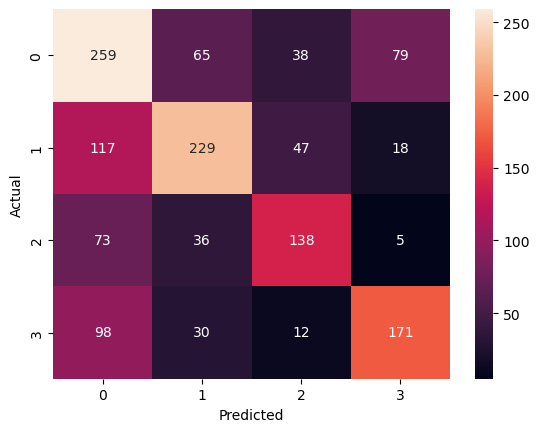

Accuracy: 0.5632508833922262

Classification Report:
               precision    recall  f1-score   support

           0       0.47      0.59      0.52       441
           1       0.64      0.56      0.59       411
           2       0.59      0.55      0.57       252
           3       0.63      0.55      0.59       311

    accuracy                           0.56      1415
   macro avg       0.58      0.56      0.57      1415
weighted avg       0.57      0.56      0.57      1415

---------------------------------------------------------

Classification Report for Classifer LogisticRegression:



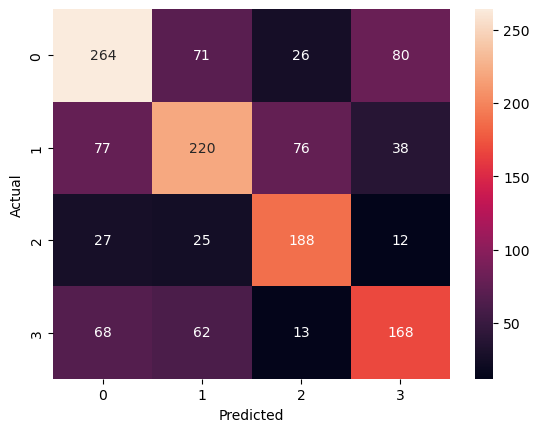

Accuracy: 0.5936395759717314

Classification Report:
               precision    recall  f1-score   support

           0       0.61      0.60      0.60       441
           1       0.58      0.54      0.56       411
           2       0.62      0.75      0.68       252
           3       0.56      0.54      0.55       311

    accuracy                           0.59      1415
   macro avg       0.59      0.61      0.60      1415
weighted avg       0.59      0.59      0.59      1415

---------------------------------------------------------

Classification Report for Random Forests:



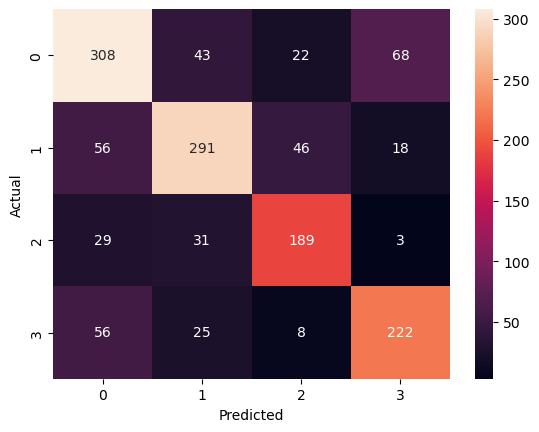

Accuracy: 0.7137809187279152

Classification Report:
               precision    recall  f1-score   support

           0       0.69      0.70      0.69       441
           1       0.75      0.71      0.73       411
           2       0.71      0.75      0.73       252
           3       0.71      0.71      0.71       311

    accuracy                           0.71      1415
   macro avg       0.71      0.72      0.72      1415
weighted avg       0.71      0.71      0.71      1415

---------------------------------------------------------

Classification Report for SVC:



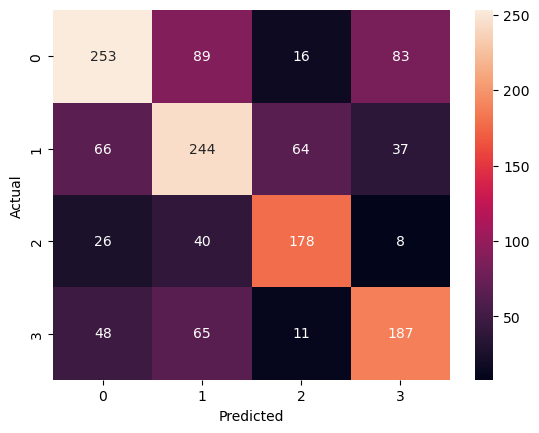

Accuracy: 0.6091872791519435

Classification Report:
               precision    recall  f1-score   support

           0       0.64      0.57      0.61       441
           1       0.56      0.59      0.57       411
           2       0.66      0.71      0.68       252
           3       0.59      0.60      0.60       311

    accuracy                           0.61      1415
   macro avg       0.61      0.62      0.62      1415
weighted avg       0.61      0.61      0.61      1415

---------------------------------------------------------

Classification Report for Neural Net:



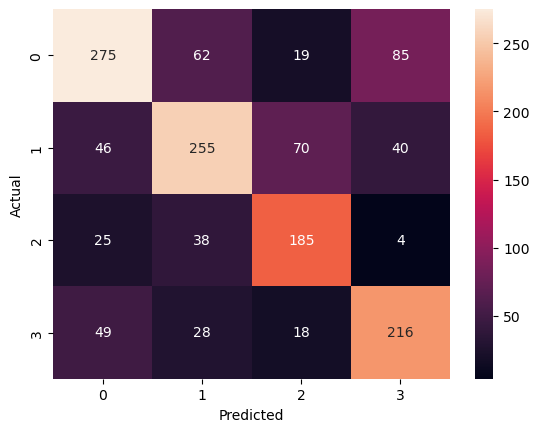

Accuracy: 0.6579505300353357

Classification Report:
               precision    recall  f1-score   support

           0       0.70      0.62      0.66       441
           1       0.67      0.62      0.64       411
           2       0.63      0.73      0.68       252
           3       0.63      0.69      0.66       311

    accuracy                           0.66      1415
   macro avg       0.66      0.67      0.66      1415
weighted avg       0.66      0.66      0.66      1415

---------------------------------------------------------



In [96]:
#features_selected = X_train_MyFeatures 
features_selected = X_train_df
X_test_selected = X_test_df[features_selected.columns]


# Function to train and evaluate classifiers
def evaluate_classifier(classifier, X_train, y_train, X_test, y_test):
    classifier.fit(X_train, y_train)
    y_pred = classifier.predict(X_test)

    conf_mat = confusion_matrix(y_test, y_pred)

    sns.heatmap(conf_mat, annot=True, fmt='g')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

    print("Accuracy:", accuracy_score(y_test, y_pred))
    print("\nClassification Report:\n", classification_report(y_test, y_pred))

    return conf_mat


for classifier_name, classifier in models.items():
    print(f"Classification Report for {classifier_name}:\n")
    conf = evaluate_classifier(classifier, features_selected, y_train, X_test_selected, y_test)
    print("---------------------------------------------------------\n")



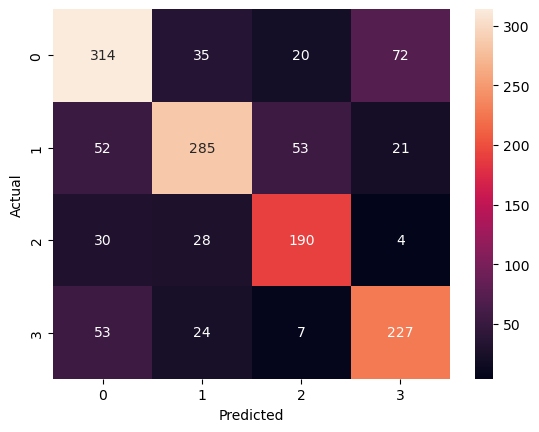

Accuracy: 0.7180212014134275

Classification Report:
               precision    recall  f1-score   support

           0       0.70      0.71      0.71       441
           1       0.77      0.69      0.73       411
           2       0.70      0.75      0.73       252
           3       0.70      0.73      0.71       311

    accuracy                           0.72      1415
   macro avg       0.72      0.72      0.72      1415
weighted avg       0.72      0.72      0.72      1415

MODELO:	RandomForestClassfier
	-Path:	 modelo_ml.pkl


In [97]:
#6. Guarda el modelo seleccionado
classifier = RandomForestClassifier()
X_train_selected = X_train_df
X_test_selected = X_test_df[features_selected.columns]
conf = evaluate_classifier(classifier, X_train_selected, y_train, X_test_selected, y_test)
path = 'modelo_ml.pkl'
joblib.dump(classifier, path)
print('MODELO:\tRandomForestClassfier') 
print('\t-Path:\t', path)